# GPN INTELLIGENCE CUP
## _Data scientist в разведке и добыче нефти_ 
__[Александр Бинько](https://t.me/ABin_98)__

# ➢ Описание проекта  
_Разработка плана похода за артефактами поможет героям в оптимизации\
маршрута и предсказании сроков поиска. Будущая модель должна опираться на\
эмпирические данные прошлых экспедиций краснолюдов._  

# ➢ Требования  
> * Провести детальный **EDA-анализ**  
>
> 
> * Провести этап **Feature-selection**
> 
> 
> * Предсказать **срок поиска артефакта**
> 
> 
> * Самостоятельно выбрать **метрику оценки качества модели**


# ➢ Полученные данные  
_Для выполнения проекта был получен один файл с расширением_ **.csv**,\
_объёмом 11,1 МБ. Файл содержит необходимые для исследования данные,\
разделенные на 53 столбца._


### **Стек проекта:**  
**python** 3.12 | **pandas** 2.2.2  
**seaborn** 0.13.2

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import seaborn as sns
from fuzzywuzzy import fuzz, process
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, \
    mean_absolute_percentage_error
from tqdm import tqdm
import warnings

warnings.filterwarnings('ignore')
!pip install fuzzywuzzy[speedup] -q

# **Ⅰ Шаг**. Загрузка данных

## ➢ Изучение общей информации

_Загрузим данные в проект, сформируем на их основе
 **pandas** - датафрейм._

In [2]:
df = pd.read_csv('data.csv', sep=',',
                 parse_dates=['Дата начала поиска', 'Дата окончания поиска'])

df['Наименование расщелины'] = df['Наименование расщелины'].astype(object)

In [3]:
display(df.info());

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13416 entries, 0 to 13415
Data columns (total 53 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   Наименование королевства                    13416 non-null  object        
 1   Наименование земли                          13416 non-null  object        
 2   Наименование хребта                         13416 non-null  object        
 3   Наименование расщелины                      13416 non-null  object        
 4   Цель                                        13416 non-null  object        
 5   Тип расщелины                               13414 non-null  object        
 6   Категория расщелины                         13416 non-null  object        
 7   Назначение расщелины                        10800 non-null  object        
 8   Участки                                     13416 non-null  object        
 9   Технол

None

**Промежуточный вывод:**  
>_Имена колонок не содержат опечаток и заданы в унифицированном стиле,  
исследование будем проводить на языке заказчика, не прибегая к переводу.  
Стоит отметить, что список признаков из технического задания содержит  
некоторое количество **дубликатов**. Выполнена конвертация целочисленного типа  
данных в строковый, для одного из столбцов, это позволит избежать коллизий  
при обучении модели. Необходимо выполнить предобработку вышеупомянутого списка  
и проверить объём соответствия мощностей признаковых пространств._

In [4]:
items = [
    "Наименование королевства", "Наименование земли", "Наименование хребта",
    "Наименование расщелины", "Цель",
    "Тип расщелины", "Категория расщелины", "Назначение расщелины", "Участки",
    "Количество труб", "Тип отвилка",
    "Количество дополнительных отвилков", "Количество пилотных отвилков",
    "Технологическая особенность",
    "Статус поиска", "Дата начала поиска", "Дата окончания поиска",
    "Глубина по отвилку", "Глубина первого отвилка",
    "Путь поиска в первом отвилке", "Помощник по контролю поиска",
    "Помощник по поиску", "Помощник по наклонным расщелинам",
    "Помощник по зельям", "Помощник по долбилам", "Помощник по исследованиям",
    "Помощник по укреплению",
    "Помощник по огненным заклятиям", "Помощник по подвескам",
    "Помощник по вырезке окна", "Общее время поиска",
    "Общее время активного поиска", "Общее время простоев",
    "Количество аварий", "Количество брака",
    "Количество геологических осложнений", "Количество осложнений",
    "Количество простоев по метеоусловиям",
    "Количество простоев", "Количество ремонтов", "Тип поискового станка",
    "Применение ротора",
    "Количество простоев без виновника",
    "Количество простоев по вине королевства", "Количество простоев в поиске",
    "Количество простоев в наклонном поиске", "Количество простоев по зельям",
    "Количество простоев в контроле поиска",
    "Количество простоев в конце расщелины", "Количество простоев по долбилам",
    "Количество простоев по вине исследователей",
    "Количество простоев по креплениям", "Количество простоев (прочие)",
    "Количество труб",
    "Количество дополнительных отвилков", "Количество пилотных отвилков",
    "Глубина по отвилку", "Глубина первого отвилка",
    "Путь поиска в первом отвилке", "Общее время поиска",
    "Общее время активного поиска", "Общее время простоев",
    "Количество аварий", "Количество брака",
    "Количество геологических осложнений", "Количество осложнений",
    "Количество простоев по метеоусловиям", "Количество простоев",
    "Количество ремонтов", "Количество простоев без виновника",
    "Количество простоев по вине королевства", "Количество простоев в поиске",
    "Количество простоев в наклонном поиске",
    "Количество простоев по зельям", "Количество простоев в контроле поиска",
    "Количество простоев в конце расщелины",
    "Количество простоев по долбилам",
    "Количество простоев по вине исследователей",
    "Количество простоев по креплениям",
    "Количество простоев (прочие)", "Общий путь поиска"
]

unique_items = list(set(items))

missing_columns_from_list = [item for item in unique_items if
                             item not in df.columns]
extra_columns_in_df = [col for col in df.columns if col not in unique_items]

if missing_columns_from_list:
    print(
        f"\nОтсутствующие колонки в полученных данных: "
        f"{', '.join(missing_columns_from_list)}")
else:
    print("\nПолученные данные содержат все уникальные признаки.")

if extra_columns_in_df:
    print(
        f"\nЛишние колонки, которых нет в техническом задании: "
        f"{', '.join(extra_columns_in_df)}")
else:
    print("\nВсе колонки датафрейма содержатся в техническом задании.")


Отсутствующие колонки в полученных данных: Применение ротора, Тип поискового станка

Лишние колонки, которых нет в техническом задании: Тип инструмента


**Промежуточный вывод:**
>_Предварительный анализ помог выяснить, что признаковые пространства  
из технического задания и полученной *.csv*-таблицы не равнозначны.  
Зафиксируем этот факт, как потенциально важный для хода исследования._

## ➢ Описание данных

**Наименование королевства, Наименование земли, Наименование хребта,  
Наименование расщелины** - _ойконимы или кодовые идентификаторы места  
проведения поисковой экспедиции, помогут дифференцировать шахты по  
географическому положению, категориальные признаки, предположительно,  
одни из наиболее важных для обучения качественной модели._

**Цель, Тип расщелины, Категория расщелины** -   
_категориальные признаки, содержащие ключевую информацию о предназначении и  
специальных инженерных характеристиках шахты._

**Назначение расщелины** - _категориальный признак, хранит название артефакта,  
для поиска которого снаряжалась краснолюдская экспедиция._

**Участки** -  _категориальный признак, в котором перечислены все виды  
использованных укреплений, дополнительно может содержать информацию о том, что  
расщелина является тупиковой._

**Тип отвилка** - _содержит информацию о положении исследуемого  
отвилка в иерархии._

**Технологическая особенность** - _категориальный признак, указывающий на угол  
наклона ствола, количество отвилков и пилотных тоннелей, а так же на  
вспомогательные технологии, использованные во время прохода._

**Статус поиска** - _идентификатор завершения краснолюдами, поиска артефакта  
в расщелине._

**Помощник по контролю поиска, Помощник по поиску, Помощник по наклонным  
расщелинам, Помощник по зельям, Помощник по долбилам, Помощник по  
исследованиям, Помощник по укреплению, Помощник по огненным заклятиям,  
Помощник по подвескам, Помощник по вырезке окна** - _поля, содержащие  
данные о компаниях, оказывающих услуги сопровождения, при проведении  
экспедиций. Их присутствие может оказывать влияние на конечное  
время поиска._                    

**Тип инструмента** - _признак, содержащий информацию о модели специального  
инструмента, используемого при бурении. Не заявлен в техническом  
задании._

**Количество труб, Количество дополнительных отвилков, Количество пилотных  
отвилков, Глубина по отвилку, Глубина первого отвилка** - _информация о   
конфигурации и инженерных решениях , применяющихся во время  
прокладывания шахты._

**Путь поиска в первом отвилке** - _информация о протяженности пути поиска  
артефакта в первом отвилке шахты._

**Общее время поиска, Общее время активного поиска, Общее время простоев** -  
_столбцы, содержащие отчет о том, сколько времени в сумме краснолюдская  
экспедиция вела активный поиск и сколько простаивала по различным причинам._

**Количество аварий, Количество брака, Количество геологических осложнений,                        
Количество осложнений, Количество простоев по метеоусловиям,  
Количество простоев, Количество ремонтов, Количество простоев без виновника,  
Количество простоев по вине королевства, Количество простоев в поиске,  
Количество простоев в наклонном поиске, Количество простоев по зельям,  
Количество простоев в контроле поиска, Количество простоев в конце расщелины,    
Количество простоев по долбилам, Количество простоев по вине исследователей,  
Количество простоев по креплениям, Количество простоев (прочие)** -  
_столбцы, содержащие количественную информацию о длительности возникших,  
в ходе экспедиции, временных простоев ._

**Общий путь поиска** - _информация о суммарной протяженности пути поиска  
артефакта в расщелине._

**Дата начала поиска, Дата окончания поиска** - _временные метки, содержащие   
дату начала и окончания экспедиции._

## Вывод шага Ⅰ:  
> Датафрейм был успешно создан на основе **.csv**-таблицы, полученной от  
заказчика исследования. Суммарный объём потребляемой памяти 5.4 МБ,  
54 колонки. Первичный анализ показал отсутствие опечаток в именах, однако  
было выявлено, что получен не полный объём данных, указанный заказчиком.  
**Отсутвуют два наименования: "Тип поискового станка", "Применение ротора".**  
**Колонка "Тип инструмента", напротив, не указана в задании, но есть в\
датафрейме.**    

**Заказчик исследования сообщил, что удаление столбцов из краснолюдской   
карты санкционировано и не должно оказать существенного влияния на ход работы.**

# **Ⅱ Шаг**. Подготовка данных

## ➢ Первичный анализ информативности  
_Оценим вариативность признакового пространства, подсчитаем количество  
пропусков и повторяющихся записей. При необходимости выполним предобработку  
значений в столбцах._



### Количество уникальных значений  
_Приступая к **EDA**-этапу стоит составить представление о том, с каким количеством  
уникальных значений предстоит иметь дело. Для корректного анализа количества  
пропусков в столбцах с типом object заменим пустые строки и пробелы на NaN,  
который сможет распознать **.isnull()**_

In [5]:
df.replace(r'^\s*$', np.nan, regex=True, inplace=True)

unique_counts = df.select_dtypes(include='object').nunique()
print("Количество уникальных значений в категориальных признаках:\n")
print(unique_counts)

Количество уникальных значений в категориальных признаках:

Наименование королевства             10
Наименование земли                  149
Наименование хребта                 703
Цель                                  3
Тип расщелины                         4
Категория расщелины                   9
Назначение расщелины                  5
Участки                             105
Технологическая особенность         148
Статус поиска                         2
Помощник по контролю поиска          98
Тип отвилка                          11
Помощник по поиску                  125
Помощник по наклонным расщелинам    229
Помощник по зельям                   86
Помощник по долбилам                121
Помощник по исследованиям            81
Помощник по укреплению              186
Помощник по огненным заклятиям       79
Помощник по подвескам               116
Помощник по вырезке окна             24
Тип инструмента                      58
dtype: int64


**Промежуточный вывод:**  
>_Анализ показал немалое количество уникальных наименований среди данных,  
описывающих помощников, участвовавших в экспедиции. Воспользуемся известным  
инструментом от [SEATGEEK](https://github.com/seatgeek/fuzzywuzzy?tab=readme-ov-file), 
чтобы автоматизировать проверку на схожесть строковых данных._

### Поиск неявных дубликатов  
_Используя библиотеку **fuzzywuzzy**, найдём расстояние Левенштейна между  
строками. Установив достаточно высокий порог сходства можно проанализировать  
признаковое пространство на предмет наличия **неявных дубликатов**._

In [151]:
object_columns = df.select_dtypes(include='object').drop(
    ['Технологическая особенность', 'Участки', 'Наименование хребта'], axis=1)

threshold = 90


def find_fuzzy_duplicates(column, threshold=threshold):
    unique_values = column.dropna().unique()
    duplicates = {}

    for item in unique_values:
        matches = process.extract(item, unique_values, limit=None,
                                  scorer=fuzz.ratio)

        similar_items = [match for match, score in matches if
                         score >= threshold and match != item]

        if similar_items:
            duplicates[item] = similar_items

    return duplicates


all_duplicates = {}

for col in object_columns.columns:
    duplicates = find_fuzzy_duplicates(df[col], threshold=threshold)
    if duplicates:
        all_duplicates[col] = duplicates

for col, duplicates in all_duplicates.items():
    print(f"\nСхожие наименования в столбце '{col}':")
    for key, matches in duplicates.items():
        match_str = ', '.join(matches)
        print(f"  - '{key}' -> Похожие значения: {match_str}")


Схожие наименования в столбце 'Помощник по контролю поиска':
  - 'Зеррикания; ООО Ойл Сервис Гарант (Опасная Группировка)' -> Похожие значения: Редания; ООО Ойл Сервис Гарант (Опасная Группировка)
  - 'ООО Ойл Сервис Гарант (Опасная Группировка)' -> Похожие значения: Редания; ООО Ойл Сервис Гарант (Опасная Группировка)
  - 'Редания; ООО Ойл Сервис Гарант (Опасная Группировка)' -> Похожие значения: Зеррикания; ООО Ойл Сервис Гарант (Опасная Группировка), ООО Ойл Сервис Гарант (Опасная Группировка)
  - 'Акбарские Воины; Редания; Шрамы Хроноса; Стрелы Мудрости' -> Похожие значения: Акбарские Воины; Шрамы Хроноса; Стрелы Мудрости
  - 'Акбарские Воины; Шрамы Хроноса; Стрелы Мудрости' -> Похожие значения: Акбарские Воины; Редания; Шрамы Хроноса; Стрелы Мудрости
  - 'Каменные Защитники; ООО Ойл Сервис Гарант (Опасная Группировка)' -> Похожие значения: Зеррикания; Каменные Защитники; ООО Ойл Сервис Гарант (Опасная Группировка)
  - 'Зеррикания; Каменные Защитники; ООО Ойл Сервис Гарант (Опасна

**Промежуточный вывод:**
>_Анализ расстояния Левенштейна между строковыми данными, указывает на множество   
схожих значений. Куратор исследования сообщил дополнительную информацию, оказалось    
некоторые компании прошли процедуру реорганизации либо просто сменили название.  
Создадим алгоритм, который снизит вариативность признакового пространства,  
очистив строковые данные от различных префиксов._

### Нормализация строковых признаков  
_Следуя Best-practice, перед началом модификации набора данных, создадим  
глубокую копию датафрейма и поставим задачу, исследовать распределения в обоих  
наборах._

In [7]:
working_df = df.copy(deep=True)

In [8]:
def normalize_assistant_names(working_df, assistant_columns):
    def clean_name(name):
        if pd.isna(name):
            return name
        names = re.split(r'[;,]', name)
        cleaned_names = []
        for n in names:
            n = re.sub(
                r'\b(ТФ|НФ|УЦС|АО|ООО|КФ|ЯФ|ПФ|ЗСФ|НПП|Филиал|Альянс|Гильдия|Цех|Фонд|Союз|Мастерская|Институт|Центр|Ковен|САК и УПБ|ЗБС|ССК-Т|Ф|-БР|-Сервис| - Урал| Гранд)\b',
                '', n, flags=re.IGNORECASE)
            n = re.sub(r'\s+', ' ',
                       n).strip()
            if n:
                cleaned_names.append(n)
        return '; '.join(cleaned_names)

    for column in assistant_columns:
        working_df[column] = working_df[column].apply(clean_name)

    return working_df


assistant_columns = [
    'Помощник по контролю поиска', 'Помощник по поиску',
    'Помощник по наклонным расщелинам',
    'Помощник по зельям', 'Помощник по долбилам', 'Помощник по исследованиям',
    'Помощник по укреплению', 'Помощник по огненным заклятиям',
    'Помощник по подвескам',
    'Помощник по вырезке окна'
]

working_df = normalize_assistant_names(working_df, assistant_columns)

**Промежуточный вывод:**
>_Скрипт очистил рабочий датафрейм от мусорных наименований, убедимся в этом,  
проанализировав обновлённое признаковое пространство._

In [9]:
unique_counts = working_df.select_dtypes(include='object').nunique()
print("Количество уникальных значений в категориальных признаках:\n")
print(unique_counts)

Количество уникальных значений в категориальных признаках:

Наименование королевства             10
Наименование земли                  149
Наименование хребта                 703
Цель                                  3
Тип расщелины                         4
Категория расщелины                   9
Назначение расщелины                  5
Участки                             105
Технологическая особенность         148
Статус поиска                         2
Помощник по контролю поиска          97
Тип отвилка                          11
Помощник по поиску                  107
Помощник по наклонным расщелинам    223
Помощник по зельям                   83
Помощник по долбилам                117
Помощник по исследованиям            81
Помощник по укреплению              179
Помощник по огненным заклятиям       78
Помощник по подвескам               114
Помощник по вырезке окна             22
Тип инструмента                      58
dtype: int64


In [10]:
object_columns = working_df.select_dtypes(include='object').drop(
    ['Технологическая особенность', 'Участки', 'Наименование хребта',
     'Тип инструмента', ], axis=1)

threshold = 90


def find_fuzzy_duplicates(column, threshold=threshold):
    unique_values = column.dropna().unique()
    duplicates = {}

    for item in unique_values:
        matches = process.extract(item, unique_values, limit=None,
                                  scorer=fuzz.ratio)

        similar_items = [match for match, score in matches if
                         score >= threshold and match != item]

        if similar_items:
            duplicates[item] = similar_items

    return duplicates


all_duplicates = {}

for col in object_columns.columns:
    duplicates = find_fuzzy_duplicates(working_df[col], threshold=threshold)
    if duplicates:
        all_duplicates[col] = duplicates

for col, duplicates in all_duplicates.items():
    print(f"\nСхожие наименования в столбце '{col}':")
    for key, matches in duplicates.items():
        match_str = ', '.join(matches)
        print(f"  - '{key}' -> Похожие значения: {match_str}")


Схожие наименования в столбце 'Помощник по контролю поиска':
  - 'Зеррикания; Ойл Сервис Гарант (Опасная Группировка)' -> Похожие значения: Редания; Ойл Сервис Гарант (Опасная Группировка)
  - 'Редания; Ойл Сервис Гарант (Опасная Группировка)' -> Похожие значения: Зеррикания; Ойл Сервис Гарант (Опасная Группировка), Техников; Ойл Сервис Гарант (Опасная Группировка)
  - 'Техников; Ойл Сервис Гарант (Опасная Группировка)' -> Похожие значения: Редания; Ойл Сервис Гарант (Опасная Группировка)
  - 'Акбарские Воины; Редания; Шрамы Хроноса; Стрелы Мудрости' -> Похожие значения: Акбарские Воины; Шрамы Хроноса; Стрелы Мудрости
  - 'Акбарские Воины; Шрамы Хроноса; Стрелы Мудрости' -> Похожие значения: Акбарские Воины; Редания; Шрамы Хроноса; Стрелы Мудрости
  - 'Каменные Защитники; Ойл Сервис Гарант (Опасная Группировка)' -> Похожие значения: Зеррикания; Каменные Защитники; Ойл Сервис Гарант (Опасная Группировка)
  - 'Зеррикания; Каменные Защитники; Ойл Сервис Гарант (Опасная Группировка)' -> П

**Промежуточный вывод:**
>_Используя библиотеку для анализа расстояния Левенштейна и регулярные  
выражения, удалось восстановить распределение строковых признаков в наборе  
данных._

### Поиск явных дубликатов  
_Используя стандартные средства библиотеки **pandas** проведём исследование  
наличия повторяющихся строк в датасете._

In [11]:
print("Количество явных дубликатов:",
      df.drop(['Дата начала поиска', 'Дата окончания поиска'],
              axis=1).duplicated().sum())

Количество явных дубликатов: 0


**Промежуточный вывод:**
>_Полностью повторяющие друг друга строки отсутствуют в таблице,  
что говорит об удовлетворительном качестве процесса сбора данных._

### Количество пропусков  
_Оценим количество пропущенных значений для каждого признака. Дополнительно  
рассчитаем процентное соотношение пустых записей к общему числу наблюдений._

In [12]:
missing_data = working_df.isnull().sum()
missing_percentage = (missing_data / len(working_df) * 100).round(2).astype(
    str) + '%'

result = pd.DataFrame(
    {'Пропуски': missing_data, 'Процент пропусков': missing_percentage})
print(result)

                                            Пропуски Процент пропусков
Наименование королевства                           0              0.0%
Наименование земли                                 0              0.0%
Наименование хребта                                0              0.0%
Наименование расщелины                             0              0.0%
Цель                                               0              0.0%
Тип расщелины                                      2             0.01%
Категория расщелины                                0              0.0%
Назначение расщелины                            2616             19.5%
Участки                                         1736            12.94%
Технологическая особенность                        2             0.01%
Статус поиска                                    383             2.85%
Помощник по контролю поиска                      676             5.04%
Тип отвилка                                      208             1.55%
Помощн

**Промежуточный вывод:**
>_Исследование показало наличие некоторого количества пропусков в столбцах  
датафрейма. В нескольких признаках отсутствует большая часть значений, стоит   
зафиксировать гипотезы, о возможных причинах возникновения и способах   
обработки пропущенных значений._

### Гипотетические причины возникновения пропусков в данных

**Наименование [Процент пропусков %] — Причина — Гипотеза возникновения**

**Агрегирование будем выполнять, принимая во следующие наблюдения:**    
- **Наименования строк могут дублировать друг друга, при условии, что**


* **Тип расщелины** [0.01%] — _Случайный — пропуск в ключевой переменной,  
возникновение связано с человеческим фактором. Заполнить модой для  
агрегированного набора._


* **Назначение расщелины** [19.5%] — _Неслучайный — почти пятая часть всех строк  
содержит null в исследуемом столбце, такое количество указывает на наличие  
особенностей механизма сбора и хранения данных. Возможно заполнение модой  
для агрегированного набора, делая предположение что в связанном комплексе  
расщелин охотятся за одним и тем же артефактом, в случае отсутствия моды,  
заполнить пропуски значением *"Неизвестный артефакт"*._  


* **Участки** [12.94%] — _Случайный — Можно предположить, что отсутствие записей  
в данном столбце свидетельствует о естественном способе формирования  
расщелины, однако для осуществления горнопроходческой деятельности, особенно с  
применением тяжелых инструментов, укрепление необходимо. Если в столбце  
"Цель" указан "боковой отвилок", то заполним пропуск "тупик", если в  
столбце "Цель" на первом месте идет укрепление, то заполним "поисковая"._


*  **Тип отвилка** [1.55%] — _Случайный — список допустимых значений охватывает  
все возможные конфигурации. Заполним модой по агрегированному набору,  
предполагая, что такой сценарий даст наименьшее смещение._


* **Технологическая особенность** [0.01%] — _Случайный — человеческий   
фактор или иная ошибка сбора. Возможно заполнение модой по агрегированному  
набору._


*  **Статус поиска** [2.85%] — _Неслучайный — в равной степени возможно,  
что команда исследователей забыла поставить отметку о завершённости или  
не завершённости работы на расщелине. В процессе обучения модели, для нас будут  
представлять интерес те записи, статус поиска в которых обозначен,  
как "завершен". Опираясь на эти предположения позволим себе замену пропусков  
статусом "завершен", это поможет увеличить объём выборок._


*  **Помощник по контролю поиска** [5.04%] — _Неслучайный — допустимо возникновение  
ситуации, когда в ходе одной и той же экспедиции на разных отвилках прибегали  
к помощи сопроводительных компаний, либо справлялись самостоятельно.  
Заполнить "Без помощи"._


*  **Помощник по поиску** [2.49%] — _Неслучайный — Допустимо возникновение  
ситуации, когда в ходе одной и той же экспедиции на разных отвилках прибегали  
к помощи ассистента по поиску, либо справлялись самостоятельно.  
Заполнить "Без помощи"._


*  **Помощник по наклонным расщелинам** [4.64%] — _Неслучайный — рельеф шахты  
мог не содержать наклонных расщелин, либо экспедиция справлялась собственными  
силами. Заменить на "Без помощи"._


*  **Помощник по зельям** [4.3%] — _Неслучайный — Возможно, зелья не  
использовались в ходе экспедиции. Заменить на "Без помощи"._


*  **Помощник по долбилам** [5.07%] — _Неслучайный — Возможно, что услуги  
эксперта в области долбил не понадобились в конкретной экспедиции. Заменить на  
"Без помощи"._


*  **Помощник по исследованиям** [10.22%] — _Неслучайный — Экспедиторы могли  
самостоятельно справиться с исследовательской нагрузкой. Каждая 10 запись  
в датасете содержит пропуск в данном столбце. Заменить на "Без помощи"._


*  **Помощник по укреплению** [14.02%] — _Неслучайный — Укрепления в шахте  
могли не применяться, либо экспедиция установила их без помощи специалистов.  
Заменить на "Без помощи"._


*  **Помощник по огненным заклятиям** [39.46%] — _Неслучайный — Очень высокий  
показатель количества пропусков может говорить о том, что далеко не каждый  
поиск сопряжен с работой над заклинаниями. Заменить на "Без помощи"._


*  **Помощник по подвескам** [54.35%] — _Неслучайный — Больше половины строк  
содержат пропуск в этом поле. Скорее всего конфигурация шахты позволила  
обойтись без использования подвесок. Заменить на "Без помощи"._


*  **Помощник по вырезке окна** [88.4%] — _Неслучайный — Очень высокий процент  
пропуска, вероятно, что окно в колонне не вырезалось. Либо экспедиция  
краснолюдов имела в штате такого специалиста и не прибегала к услугам  
аутсорисинга. Заменить на "Без помощи"._ 


*  **Тип инструмента** [97.82%] — _Неслучайный — Невосполнимая потеря  
информации, скорее всего природа пропусков кроется в том, что колонка  
не числится в техническом задании к исследованию. Возможно удаление  
из датафрейма, в противном случае позитивный результат могла бы дать  
бинаризация признака._


*  **Глубина первого отвилка** [89.04%] — _Неслучайный — Предположим, что  
глубина отвилка не может быть меньше пути поиска в нём. В случае наличия  
значения в "Путь поиска в первом отвилке", продублируем его в этот столбец.  
В противном случае заменим на 0._


*  **Путь поиска в первом отвилке** [88.53%] — _Неслучайный — Процент пропусков  
схож с предыдущем полем, привести к согласованному виду с глубиной первого  
отвилка, по аналогии с вышеописанным алгоритмом._


*  **Общее время поиска** [0.04%] — _Случайный — Целевая переменная, низкий процент  
пропусков свидетельствует о высоком уровне подготовки и сбора данных.  
Строки с отсутствующим значением не представляют интереса для обучения модели.  
Заполним суммой по столбцам, применяя формулу  
"Общее время простоев" + "Общее время активного"._


*  **Количество аварий, брака и простоев** [9.51%] — _Неслучайный — некоторые  
записи лишены информации о времени простоев, количестве аварий и брака.  
Скорее всего это свидетельствует о серьезном нарушении в технологии сбора и  
хранения данных. Важнейшие показатели, которые не могут быть использованы при  
обучении модели, из-за утечки целевого признака, но все же сильно помогут  
при построении оптимального плана поисков, могут быть заполнены медианой по  
агрегированному набору._


*  **Дата окончания поиска** [1.41%] — _Случайный — Если статус поиска "Завершён",  
но сведения о дате окончания не внесены, это может свидетельствовать об  
ошибке сбора. При возможности необходимо любыми способами восстановить точную  
дату окончания экспедиции._

### Обработка пропусков и коррекция данных
_Перед началом заполнения пропущенных значений нам потребуется сгруппировать  
данные по столбцам, позволяющим однозначно идентифицировать расщелину.  
Полученная структура потребуется для вычисления распределений внутри групп._

In [13]:
grouped_df = working_df.groupby(
    ['Наименование королевства', 'Наименование земли', 'Наименование хребта',
     'Наименование расщелины'])

_Узнаем, как часто материнский ствол начинает изучаться позже, чем боковые  
отвилки._

In [14]:
count_later_start = 0
count_total = 0

for name, group in grouped_df:
    maternal_rows = group[
        group['Тип отвилка'].str.contains('материнский', case=False, na=False)]
    if not maternal_rows.empty:
        earliest_date = group['Дата начала поиска'].min()
        for idx, row in maternal_rows.iterrows():
            if row['Дата начала поиска'] > earliest_date:
                count_later_start += 1
                break
    count_total += 1
frequency = count_later_start / count_total if count_total > 0 else 0
print(
    f"Процент записей, в которых материнский ствол начинает изучаться позже боковых: {frequency:.2%}")

Процент записей, в которых материнский ствол начинает изучаться позже боковых: 0.49%


In [15]:
grouped_original_df = df.groupby(
    ['Наименование королевства', 'Наименование земли', 'Наименование хребта',
     'Наименование расщелины'])

contains_multiple_otvilka = grouped_original_df.apply(
    lambda x: (x['Тип отвилка'] == 'Материнский').sum() > 1)

num_groups_with_multiple_otvilka = \
    contains_multiple_otvilka[contains_multiple_otvilka].shape[0]

print(
    f"Количество групп в агрегированном наборе: {grouped_original_df.ngroups}")
print(
    f"Количество групп с несколькими материнскими отвилками: {num_groups_with_multiple_otvilka}")

Количество групп в агрегированном наборе: 12651
Количество групп с несколькими материнскими отвилками: 42


_Менее половины процента, это говорит об удовлетворительном качестве ведения  
хронологии краснолюдами, некоторое количество групп содержит несколько  
материнских отвилков в одном шахтном комплексе, это аномальные значения,  
обработаем их позже, а пока продолжим исследование адекватности заполнения  
временных штампов в датафрейме._

In [16]:
incorrect_date_records = working_df[
    working_df['Дата окончания поиска'] <= working_df[
        'Дата начала поиска']].shape[0]
print(f"Записей, с нарушенными временными метками: {incorrect_date_records}")

working_df = working_df[
    working_df['Дата окончания поиска'] >= working_df['Дата начала поиска']]

Записей, с нарушенными временными метками: 4


_Всего 4 записи, с явно некорректными значениями в столбцах, которые составляют  
целевое значение исследования. Избавимся от них и постараемся вывести несколько  
эвристик, которые помогут заполнить пропуски._

_Известно о существовании двух наблюдений, с пропусками в типе расщелины,  
исследуем их подробнее._

In [17]:
display(working_df[working_df['Тип расщелины'].isna()])

,Наименование королевства,Наименование земли,Наименование хребта,Наименование расщелины,Цель,Тип расщелины,Категория расщелины,Назначение расщелины,Участки,Технологическая особенность,...,Количество простоев по зельям,Количество простоев в контроле поиска,Количество простоев в конце расщелины,Количество простоев по долбилам,Количество простоев по вине исследователей,Количество простоев по креплениям,Количество простоев (прочие),Общий путь поиска,Дата начала поиска,Дата окончания поиска
8639,Кэдвен,Орехвал,715,6567,боковой отвилок,NaN,Поисковая,Око Дракона,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1522.8,2170-03-04 00:00:17,2170-04-12 20:00:17
8798,Зеррикания,Мессоя,4181,1405,поиск,NaN,Поисковая,Око Дракона,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2636.1,2170-05-25 19:00:17,2170-06-03 04:00:17


_Помимо информации о типе расщелины, отсутствуют данные об участках и  
технологических особенностях. Удалим строки, как мусорные._

In [18]:
working_df = working_df.dropna(subset=['Тип расщелины'])

_Краснолюды внесли в карту несколько странных записей, с нетипичными  
категориями расщелин. Исследуем их количество._

In [19]:
working_df[working_df['Категория расщелины'] == 'Оценочная']

,Наименование королевства,Наименование земли,Наименование хребта,Наименование расщелины,Цель,Тип расщелины,Категория расщелины,Назначение расщелины,Участки,Технологическая особенность,...,Количество простоев по зельям,Количество простоев в контроле поиска,Количество простоев в конце расщелины,Количество простоев по долбилам,Количество простоев по вине исследователей,Количество простоев по креплениям,Количество простоев (прочие),Общий путь поиска,Дата начала поиска,Дата окончания поиска
3306,Бругге,Остров,2503,2933,разведка,горизонтальная,Оценочная,NaN,верхнее укрепление+среднее укрепление+основное...,горизонтальная + отвилков 40 + пилотов 40,...,0.0,0.0,0.0,0.0,0.0,0.9,0.0,8126.1,2166-02-23 22:30:17,2166-04-20 13:00:17


_Такая шахта оказалась уникальной в своём роде, учитывая значение в столбце  
'Цель', заменим категорию на более подходящую._

In [20]:
working_df['Категория расщелины'] = working_df['Категория расщелины'].replace(
    'Оценочная', 'Разведочная')

In [21]:
working_df[working_df['Категория расщелины'] == 'Пилот']

,Наименование королевства,Наименование земли,Наименование хребта,Наименование расщелины,Цель,Тип расщелины,Категория расщелины,Назначение расщелины,Участки,Технологическая особенность,...,Количество простоев по зельям,Количество простоев в контроле поиска,Количество простоев в конце расщелины,Количество простоев по долбилам,Количество простоев по вине исследователей,Количество простоев по креплениям,Количество простоев (прочие),Общий путь поиска,Дата начала поиска,Дата окончания поиска
8950,Кэдвен,Приобия,2732,978,боковой отвилок,наклонная,Пилот,Око Дракона,тупик,наклонная + пилотов 20 + магическое воздействие,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1870.2,2170-05-30 00:00:17,2170-07-20 20:00:17


In [22]:
working_df['Категория расщелины'] = working_df['Категория расщелины'].replace(
    'Пилот', 'Поисковая')

_И вновь уникальная шахта, имеет цель 'боковой отвилок', характерный для  
категории Поисковых шахт, произведём замену._

In [23]:
working_df[working_df['Категория расщелины'] == 'Прочее']

,Наименование королевства,Наименование земли,Наименование хребта,Наименование расщелины,Цель,Тип расщелины,Категория расщелины,Назначение расщелины,Участки,Технологическая особенность,...,Количество простоев по зельям,Количество простоев в контроле поиска,Количество простоев в конце расщелины,Количество простоев по долбилам,Количество простоев по вине исследователей,Количество простоев по креплениям,Количество простоев (прочие),Общий путь поиска,Дата начала поиска,Дата окончания поиска
2346,Бругге,Остров,290,2031,поиск,горизонтальная,Прочее,NaN,верхнее укрепление+среднее укрепление+основное...,горизонтальная,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2694.6,2165-06-08 18:30:17,2165-06-24 23:59:17


_Повреждённая строка с отсутствующим назначением и заврешенным поиском,  
безопаснее будет от неё избавиться._

In [24]:
working_df = working_df[working_df['Категория расщелины'] != 'Прочее']

_Исследуя набор данных в мануальном режиме, можно заметить существование  
взаимосвязей между значениями в столбцах. Попробуем измерить вероятности  
совместного возникновения признаков в строке._

#### Тупик | Боковой отвилок

In [25]:
side_track_non_null = working_df[(working_df['Цель'] == 'боковой отвилок') & (
    working_df['Участки'].notna())]
total_side_track = side_track_non_null.shape[0]
side_track_with_dead_end = \
    side_track_non_null[side_track_non_null['Участки'] == 'тупик'].shape[0]

probability = side_track_with_dead_end / total_side_track if total_side_track > 0 else 0

print(
    f"Вероятность 'Участка' = 'Тупик', при условии 'Цель' = 'боковой отвилок': {probability:.2%}")


Вероятность 'Участка' = 'Тупик', при условии 'Цель' = 'боковой отвилок': 99.11%


_Почти 100%, маску можно признать успешной и применить к пропущенным значениям._

In [26]:
working_df.loc[(working_df['Цель'] == 'боковой отвилок') & (
    working_df['Участки'].isna()), 'Участки'] = 'тупик'

#### Боковой | Боковой отвилок

In [27]:
side_track_non_null = working_df[(working_df['Цель'] == 'боковой отвилок') & (
    working_df['Тип отвилка'].notna())]
total_side_track = side_track_non_null.shape[0]
side_track_with_bokovoy_type = \
    side_track_non_null[side_track_non_null['Тип отвилка'] == 'Боковой'].shape[
        0]

probability_bokovoy_type = side_track_with_bokovoy_type / total_side_track if total_side_track > 0 else 0

print(
    f"Вероятность 'Тип отвилка' = 'боковой', при условии 'Цель' = 'боковой отвилок': {probability_bokovoy_type:.2%}")

Вероятность 'Тип отвилка' = 'боковой', при условии 'Цель' = 'боковой отвилок': 89.73%


Почти 90% вероятность, применяем маску к данным.

In [28]:
working_df.loc[(working_df['Цель'] == 'боковой отвилок') & (
    working_df['Тип отвилка'].isna()), 'Тип отвилка'] = 'Боковой'


#### Разведка | Материнский

In [29]:
reconnaissance_non_null = working_df[
    (working_df['Цель'] == 'разведка') & (working_df['Тип отвилка'].notna())]
total_reconnaissance = reconnaissance_non_null.shape[0]
reconnaissance_with_materinsky_type = reconnaissance_non_null[
    reconnaissance_non_null['Тип отвилка'] == 'Материнский'].shape[0]

probability_materinsky_type = reconnaissance_with_materinsky_type / total_reconnaissance if total_reconnaissance > 0 else 0

print(
    f"Вероятность 'Цель' = 'разведка', при условии 'Тип отвилка' = 'Материнский': {probability_materinsky_type:.2%}")


Вероятность 'Цель' = 'разведка', при условии 'Тип отвилка' = 'Материнский': 75.19%


_Вероятность материнского отвилка чуть больше 75%, применим маску. Ничего  
страшного, если в результате, в группе образуется несколько материнских  
стволов, в конце шага этот недочёт будет исправлен._

In [30]:
working_df.loc[(working_df['Цель'] == 'разведка') & (
    working_df['Тип отвилка'].isna()), 'Тип отвилка'] = 'Материнский'

#### Магическое воздействие | Нагнетательная

In [31]:
nagnetatelnaya_non_null = working_df[
    (working_df['Категория расщелины'] == 'Нагнетательная') & (
        working_df['Назначение расщелины'].notna())]
total_nagnetatelnaya = nagnetatelnaya_non_null.shape[0]
nagnetatelnaya_with_magicheskoe = nagnetatelnaya_non_null[
    nagnetatelnaya_non_null[
        'Назначение расщелины'] == 'Магическое воздействие'].shape[0]

probability_magicheskoe = nagnetatelnaya_with_magicheskoe / total_nagnetatelnaya if total_nagnetatelnaya > 0 else 0

print(
    f"Вероятность 'Назначения расщелины' = 'Магическое воздействие', при условии 'Категория расщелины' = 'Нагнетательная': {probability_magicheskoe:.2%}")

Вероятность 'Назначения расщелины' = 'Магическое воздействие', при условии 'Категория расщелины' = 'Нагнетательная': 81.19%


_82% Нагнетательных расщелин имели назначение "Магическое воздействие".  
Можно применить маску к данным._

In [32]:
working_df.loc[
    (working_df['Категория расщелины'] == 'Нагнетательная') & (
        working_df['Назначение расщелины'].isna()),
    'Назначение расщелины'
] = 'Магическое воздействие'

#### Око Дракона | Разведочная

In [33]:
razvedochnaya_non_null = working_df[
    (working_df['Категория расщелины'] == 'Разведочная') & (
        working_df['Назначение расщелины'].notna())]
total_razvedochnaya = razvedochnaya_non_null.shape[0]
razvedochnaya_with_oko_drakona = razvedochnaya_non_null[
    razvedochnaya_non_null['Назначение расщелины'] == 'Око Дракона'].shape[0]

probability_oko_drakona = razvedochnaya_with_oko_drakona / total_razvedochnaya if total_razvedochnaya > 0 else 0

print(
    f"Вероятность 'Назначение расщелины' = 'Око Дракона', при условии 'Категория расщелины' = 'Разведочная': {probability_oko_drakona:.2%}")

Вероятность 'Назначение расщелины' = 'Око Дракона', при условии 'Категория расщелины' = 'Разведочная': 97.67%


_Почти все известные разведочные расщелины нужны были для поиска артефакта  
'Око Дракона', сохраним этот тренд и применим маску к данным._

In [34]:
working_df.loc[
    (working_df['Категория расщелины'] == 'Разведочная') & (
        working_df['Назначение расщелины'].isna()),
    'Назначение расщелины'
] = 'Око Дракона'

#### Око Дракона | Поисково-оценочная

In [35]:
poiskovo_ocenochnaya_non_null = working_df[
    (working_df['Категория расщелины'] == 'Поисково-оценочная') & (
        working_df['Назначение расщелины'].notna())]
total_poiskovo_ocenochnaya = poiskovo_ocenochnaya_non_null.shape[0]
poiskovo_ocenochnaya_with_oko_drakona = poiskovo_ocenochnaya_non_null[
    poiskovo_ocenochnaya_non_null[
        'Назначение расщелины'] == 'Око Дракона'].shape[0]

probability_oko_drakona = poiskovo_ocenochnaya_with_oko_drakona / total_poiskovo_ocenochnaya if total_poiskovo_ocenochnaya > 0 else 0

print(
    f"Вероятность 'Назначения расщелины' = 'Око Дракона', при условии 'Категория расщелины' = 'Поисково-оценочная': {probability_oko_drakona:.2%}")


Вероятность 'Назначения расщелины' = 'Око Дракона', при условии 'Категория расщелины' = 'Поисково-оценочная': 96.67%


_И вновь, практически 100% Поисково-оценочных шахт были открыты с целью  
поиска 'Ока Дракона'. Заполним пропуски этим артефактом._

In [36]:
working_df.loc[
    (working_df['Категория расщелины'] == 'Поисково-оценочная') & (
        working_df['Назначение расщелины'].isna()),
    'Назначение расщелины'
] = 'Око Дракона'

#### Око Дракона | разведка

In [37]:
reconnaissance_non_null = working_df[(working_df['Цель'] == 'разведка') & (
    working_df['Назначение расщелины'].notna())]
total_reconnaissance = reconnaissance_non_null.shape[0]
reconnaissance_with_oko_drakona = reconnaissance_non_null[
    reconnaissance_non_null['Назначение расщелины'] == 'Око Дракона'].shape[0]

probability_oko_drakona = reconnaissance_with_oko_drakona / total_reconnaissance if total_reconnaissance > 0 else 0

print(
    f"Вероятность 'Назначения расщелины' = 'Око Дракона', при условии 'Цель' = 'разведка': {probability_oko_drakona:.2%}")

Вероятность 'Назначения расщелины' = 'Око Дракона', при условии 'Цель' = 'разведка': 98.74%


_Для шахт, с целью 'разведка', очень характерно назначение 'Око Дракона'.  
Заполним пропуски._

In [38]:
working_df.loc[
    (working_df['Цель'] == 'разведка') & (
        working_df['Назначение расщелины'].isna()),
    'Назначение расщелины'
] = 'Око Дракона'

#### Око Дракона | многощельная

In [39]:
mnogoschelnaya_non_null = working_df[
    (working_df['Тип расщелины'] == 'многощельная') & (
        working_df['Назначение расщелины'].notna())]
total_mnogoschelnaya = mnogoschelnaya_non_null.shape[0]
mnogoschelnaya_with_oko_drakona = mnogoschelnaya_non_null[
    mnogoschelnaya_non_null['Назначение расщелины'] == 'Око Дракона'].shape[0]

probability_mnogoschelnaya_oko_drakona = mnogoschelnaya_with_oko_drakona / total_mnogoschelnaya if total_mnogoschelnaya > 0 else 0

print(
    f"Вероятность 'Назначения расщелины' = 'Око Дракона', при условии 'Тип расщелины' = 'многощельная': {probability_mnogoschelnaya_oko_drakona:.2%}")

Вероятность 'Назначения расщелины' = 'Око Дракона', при условии 'Тип расщелины' = 'многощельная': 95.81%


_Почти все многощельные шахты ориентированы на поиск 'Ока Дракона'.  
Заполним пропуски._

In [40]:
working_df.loc[
    (working_df['Тип расщелины'] == 'многощельная') & (
        working_df['Назначение расщелины'].isna()),
    'Назначение расщелины'
] = 'Око Дракона'

#### Магическое воздействие | Поглощающая

In [41]:
pogloshayushchaya_non_null = working_df[
    (working_df['Категория расщелины'] == 'Поглощающая') & (
        working_df['Назначение расщелины'].notna())]
total_pogloshayushchaya = pogloshayushchaya_non_null.shape[0]
pogloshayushchaya_with_magicheskoe = pogloshayushchaya_non_null[
    pogloshayushchaya_non_null[
        'Назначение расщелины'] == 'Магическое воздействие'].shape[0]

probability_magicheskoe = pogloshayushchaya_with_magicheskoe / total_pogloshayushchaya if total_pogloshayushchaya > 0 else 0

print(
    f"Вероятность 'Назначения расщелины' = 'Магическое воздействие', при условии 'Категория расщелины' = 'Поглощающая': {probability_magicheskoe:.2%}")

Вероятность 'Назначения расщелины' = 'Магическое воздействие', при условии 'Категория расщелины' = 'Поглощающая': 100.00%


_Все известные поглощающие расщелины имели назначение, связанное с  
'Магическим воздействием', применим к пропущенным значениям данную маску._

In [42]:
working_df.loc[
    (working_df['Категория расщелины'] == 'Поглощающая') & (
        working_df['Назначение расщелины'].isna()),
    'Назначение расщелины'
] = 'Магическое воздействие'

#### 'Дополнительный' в отвилке | многощельная

In [43]:
multichamber_non_null = working_df[
    (working_df['Тип расщелины'] == 'многощельная') &
    (working_df['Тип отвилка'].notna())
    ]

total_multichamber = multichamber_non_null.shape[0]

multichamber_with_dopolnitelniy = multichamber_non_null[
    multichamber_non_null['Тип отвилка'].str.contains('Дополнительный',
                                                      case=False)
].shape[0]

probability_dopolnitelniy = multichamber_with_dopolnitelniy / total_multichamber if total_multichamber > 0 else 0

print(
    f"Вероятность 'Тип отвилка' содержит слово 'Дополнительный', при условии 'Тип расщелины' = 'многощельная': {probability_dopolnitelniy:.2%}")

Вероятность 'Тип отвилка' содержит слово 'Дополнительный', при условии 'Тип расщелины' = 'многощельная': 77.47%


_Заполним пропуски в типе отвилка, с учетом многощельного типа шахты._

In [44]:
working_df.loc[
    (working_df['Тип расщелины'] == 'многощельная') & (
        working_df['Тип отвилка'].isna()),
    'Тип отвилка'
] = 'Дополнительный'

#### Материнский | Нагнетательная

In [45]:
nagnetatelnaya_non_null = working_df[
    (working_df['Категория расщелины'] == 'Нагнетательная') &
    (working_df['Тип отвилка'].notna())
    ]

total_nagnetatelnaya = nagnetatelnaya_non_null.shape[0]

nagnetatelnaya_with_materinskiy = nagnetatelnaya_non_null[
    nagnetatelnaya_non_null['Тип отвилка'] == 'Материнский'
    ].shape[0]

probability_nagnetatelnaya_materinskiy = nagnetatelnaya_with_materinskiy / total_nagnetatelnaya if total_nagnetatelnaya > 0 else 0

print(
    f"Вероятность 'Тип отвилка' = 'Материнский', при условии 'Категория расщелины' = 'Нагнетательная': {probability_nagnetatelnaya_materinskiy:.2%}"
)

Вероятность 'Тип отвилка' = 'Материнский', при условии 'Категория расщелины' = 'Нагнетательная': 87.37%


_Почти 90% нагнетательных расщелин имеют материнский тип отвилка, применим  
маску к датасету._

In [46]:
working_df.loc[
    (working_df['Категория расщелины'] == 'Нагнетательная') & (
        working_df['Тип отвилка'].isna()),
    'Тип отвилка'
] = 'Материнский'

#### Материнский | Водозаборная

In [47]:
nagnetatelnaya_non_null = working_df[
    (working_df['Категория расщелины'] == 'Водозаборная') &
    (working_df['Тип отвилка'].notna())
    ]

total_nagnetatelnaya = nagnetatelnaya_non_null.shape[0]

nagnetatelnaya_with_materinskiy = nagnetatelnaya_non_null[
    nagnetatelnaya_non_null['Тип отвилка'] == 'Материнский'
    ].shape[0]

probability_nagnetatelnaya_materinskiy = nagnetatelnaya_with_materinskiy / total_nagnetatelnaya if total_nagnetatelnaya > 0 else 0

print(
    f"Вероятность 'Тип отвилка' = 'Материнский', при условии 'Категория расщелины' = 'Водозаборная': {probability_nagnetatelnaya_materinskiy:.2%}"
)

Вероятность 'Тип отвилка' = 'Материнский', при условии 'Категория расщелины' = 'Водозаборная': 89.61%


_Вероятность того, что отвилок будет материнским, при условии, что расщелина  
водозаборная около 90%. Можно заполнить пропуски._

In [48]:
working_df.loc[
    (working_df['Категория расщелины'] == 'Водозаборная') & (
        working_df['Тип отвилка'].isna()),
    'Тип отвилка'
] = 'Материнский'

In [49]:
missing_percentage = working_df['Тип отвилка'].isna().mean() * 100
print(f"Процент пропусков в 'Тип отвилка': {missing_percentage:.2f}%")

Процент пропусков в 'Тип отвилка': 0.66%


_Осталось около половины процента пропусков в данном столбце, учитывая   
сложный характер технологической особенности, заполним их строкой "Боковой"._

In [50]:
working_df['Тип отвилка'].fillna('Боковой', inplace=True)

#### Дублирование артефакта внутри группы

In [51]:
missing_percentage = working_df['Назначение расщелины'].isna().mean() * 100
print(f"Процент пропусков в 'Назначение расщелины': {missing_percentage:.2f}%")

Процент пропусков в 'Назначение расщелины': 18.03%


_Осталась примерно пятая доля записей с пропусками на месте весьма важного  
признака 'Назначение расщелины', некоторые из них нам поможет заполнить  
сгруппированный набор, однако перед применением алгоритма, стоит убедиться в  
целесообразности такого решения._

In [52]:
count_groups_with_diff_values = 0
count_total_groups = 0

for name, group in grouped_df:
    non_null_group = group[group['Назначение расщелины'].notna()]
    if not non_null_group.empty:
        unique_values = non_null_group['Назначение расщелины'].nunique()
        if unique_values > 1:
            count_groups_with_diff_values += 1
    count_total_groups += 1

probability_diff_values = count_groups_with_diff_values / count_total_groups if count_total_groups > 0 else 0
print(
    f"Вероятность того, что внутри группы будут разные значения в 'Назначение расщелины': {probability_diff_values:.2%}")

Вероятность того, что внутри группы будут разные значения в 'Назначение расщелины': 0.15%


_Весьма небольшая вероятность встретить различные артефакты в одной расщелине,  
очевидно наличие причинно-следственной связи, ведь древняя шахта, в которой  
можно найти магический предмет сама по себе большая редкость, а целых два  
предмета - почти невозможно, о чём и свидетельствуют краснолюдские записи.  
Возможно дело в ошибке заполнения._

_Заполним пропуски в назначении расщелины модой для агрегированного набора._

In [53]:
working_df['Назначение расщелины'] = grouped_df[
    'Назначение расщелины'].transform(
    lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else x))

#### Верхнее+среднее+основное в Участках | Водозаборная

In [54]:
vodozabornaya_sections = working_df[
    working_df['Категория расщелины'] == 'Водозаборная'
    ]

total_vodozabornaya = vodozabornaya_sections.shape[0]

vodozabornaya_with_upper_middle_main = vodozabornaya_sections[
    vodozabornaya_sections['Участки'].notna() &
    vodozabornaya_sections['Участки'].str.contains(
        'верхнее укрепление\+среднее укрепление\+основное укрепление',
        case=False)
    ].shape[0]

probability_upper_middle_main = vodozabornaya_with_upper_middle_main / total_vodozabornaya if total_vodozabornaya > 0 else 0

print(
    f"Вероятность 'Участки' содержат 'верхнее укрепление+среднее укрепление+основное укрепление', при условии что 'Категория расщелины' = 'Водозаборная': {probability_upper_middle_main:.2%}"
)

Вероятность 'Участки' содержат 'верхнее укрепление+среднее укрепление+основное укрепление', при условии что 'Категория расщелины' = 'Водозаборная': 55.13%


_Больше половины водозаборных расщелин содержат в участках эту комбинацию  
укреплений. Может подойти для заполнения._

In [55]:
working_df.loc[
    (working_df['Категория расщелины'] == 'Водозаборная') & (
        working_df['Участки'].isna()),
    'Участки'
] = 'верхнее укрепление+среднее укрепление+основное укрепление'

#### Верхнее+среднее+основное в Участках | Нагнетательная

In [56]:
nagnetatelnaya_sections = working_df[
    working_df['Категория расщелины'] == 'Нагнетательная'
    ]

total_nagnetatelnaya = nagnetatelnaya_sections.shape[0]

nagnetatelnaya_with_upper_middle_main = nagnetatelnaya_sections[
    nagnetatelnaya_sections['Участки'].notna() &
    nagnetatelnaya_sections['Участки'].str.contains(
        'верхнее укрепление\+среднее укрепление\+основное укрепление',
        case=False)
    ].shape[0]

probability_upper_middle_main = nagnetatelnaya_with_upper_middle_main / total_nagnetatelnaya if total_nagnetatelnaya > 0 else 0

print(
    f"Вероятность 'Участки' содержат 'верхнее укрепление+среднее укрепление+основное укрепление', при условии что 'Категория расщелины' = 'Нагнетательная': {probability_upper_middle_main:.2%}"
)


Вероятность 'Участки' содержат 'верхнее укрепление+среднее укрепление+основное укрепление', при условии что 'Категория расщелины' = 'Нагнетательная': 70.22%


_Для Нагнетательных это число равняется 70%, используем, как стратегию  
заполнения_ 

In [57]:
working_df.loc[
    (working_df['Категория расщелины'] == 'Нагнетательная') & (
        working_df['Участки'].isna()),
    'Участки'
] = 'верхнее укрепление+среднее укрепление+основное укрепление'

#### Око Дракона | Водозаборная х наклонная х поиск

In [58]:
vodozabornaya_naklonnaya_poisk = working_df[
    (working_df['Категория расщелины'] == 'Водозаборная') &
    (working_df['Тип расщелины'] == 'наклонная') &
    (working_df['Цель'] == 'поиск') &
    (working_df['Назначение расщелины'].notna())
    ]

total_vodozabornaya_naklonnaya_poisk = vodozabornaya_naklonnaya_poisk.shape[0]

vodozabornaya_naklonnaya_poisk_oko_drakona = vodozabornaya_naklonnaya_poisk[
    vodozabornaya_naklonnaya_poisk['Назначение расщелины'] == 'Око Дракона'
    ].shape[0]

probability_oko_drakona_poisk = vodozabornaya_naklonnaya_poisk_oko_drakona / total_vodozabornaya_naklonnaya_poisk if total_vodozabornaya_naklonnaya_poisk > 0 else 0

print(
    f"Вероятность 'Назначение расщелины' = 'Око Дракона', при условии 'Категория расщелины' = 'Водозаборная', 'Тип расщелины' = 'наклонная' и 'Цель' = 'поиск': {probability_oko_drakona_poisk:.2%}")

Вероятность 'Назначение расщелины' = 'Око Дракона', при условии 'Категория расщелины' = 'Водозаборная', 'Тип расщелины' = 'наклонная' и 'Цель' = 'поиск': 75.00%


_Вероятность такой комбинации около 75%, что позволяет считать применение  
маски допустимым. Оставшиеся пропуски в водозаборных расщелинах заполним  
прямым конкурентом Ока Дракона в этой категории - Магическим воздействием._

In [59]:
working_df.loc[
    (working_df['Категория расщелины'] == 'Водозаборная') &
    (working_df['Тип расщелины'] == 'наклонная') &
    (working_df['Цель'] == 'поиск') &
    (working_df['Назначение расщелины'].isna()),
    'Назначение расщелины'
] = 'Око Дракона'

working_df.loc[
    (working_df['Категория расщелины'] == 'Водозаборная') & (
        working_df['Назначение расщелины'].isna()),
    'Назначение расщелины'
] = 'Магическое воздействие'

#### Повтор заполнения назначения расщелины
_Выполняя преобразования в наборе, образовалось некоторое количество новых  
пропусков, требующих повторного заполнения._

In [60]:
working_df.loc[
    (working_df['Категория расщелины'] == 'Нагнетательная') & (
        working_df['Назначение расщелины'].isna()),
    'Назначение расщелины'
] = 'Магическое воздействие'

working_df.loc[
    (working_df['Категория расщелины'] == 'Разведочная') & (
        working_df['Назначение расщелины'].isna()),
    'Назначение расщелины'
] = 'Око Дракона'

working_df.loc[
    (working_df['Категория расщелины'] == 'Поглощающая') & (
        working_df['Назначение расщелины'].isna()),
    'Назначение расщелины'
] = 'Магическое воздействие'

working_df.loc[
    (working_df['Категория расщелины'] == 'Поисково-оценочная') & (
        working_df['Назначение расщелины'].isna()),
    'Назначение расщелины'
] = 'Око Дракона'

#### Око Дракона | Поисковая

In [61]:
poiskovaya_sections = working_df[
    working_df['Категория расщелины'] == 'Поисковая']

total_poiskovaya = poiskovaya_sections.shape[0]

poiskovaya_with_oko_drakona = poiskovaya_sections[
    poiskovaya_sections['Назначение расщелины'] == 'Око Дракона'
    ].shape[0]

probability_oko_drakona_poiskovaya = poiskovaya_with_oko_drakona / total_poiskovaya if total_poiskovaya > 0 else 0

print(
    f"Вероятность 'Назначение расщелины' = 'Око Дракона', при условии 'Категория расщелины' = 'Поисковая': {probability_oko_drakona_poiskovaya:.2%}"
)


Вероятность 'Назначение расщелины' = 'Око Дракона', при условии 'Категория расщелины' = 'Поисковая': 81.17%


_Почти все столбцы, содержащие назначение заполнены, осталась последняя,  
очень многочисленная (2000+) группа, с категорией 'Поисковая'.  
Наиболее часто встречающийся артефакт для этой категории это Око Дракона,  
им мы и заполним оставшиеся пропуски._

In [62]:
working_df['Назначение расщелины'].fillna('Око Дракона', inplace=True)

_Учитывая вариативность признакового пространства, заполним пропуски  
участках с помощью наиболее частого значения по обширной комбинации признаков,  
которая, предположительно, даст небольшое смещение оценки.  
Оставшиеся пропуски заполним популярным, нейтральным значением._

In [63]:
group_uch = working_df.groupby(['Категория расщелины', 'Назначение расщелины',
                                'Технологическая особенность'])

working_df['Участки'] = group_uch['Участки'].transform(
    lambda x: x.fillna(x.mode().iloc[0]) if not x.mode().empty else x)

working_df['Участки'].fillna('верхнее укрепление+среднее укрепление',
                             inplace=True)

#### Статус поиска

In [64]:
status_counts = working_df['Статус поиска'].value_counts(normalize=True)
probability_completed = status_counts.get('завершен', 0) * 100

print(f"Вероятность статуса 'завершен': {probability_completed:.2f}%")

Вероятность статуса 'завершен': 99.91%


_Такое распределение говорит о том, что Краснолюды вносили запись в карту  
уже после завершения поисков, что удобно, учитывая отсутствие технологий,  
позволяющих автоматически обновлять значения полей в условиях активной  
горнопроходческой работы. Незначительное количество записей все же содержит  
статус 'в процессе', но вероятность такого значения очень мала, более того  
заполнение пропуска таким статусом автоматически исключит строку из  
обучающего и тестового набора данных._

In [65]:
working_df['Статус поиска'].fillna('завершен', inplace=True)

_В ходе заполнения некоторых значений могли произойти коллизии, одна из  
наиболее вероятных это образование нескольких материнских расщелин в пределах  
одного шахтного комплекса_

In [66]:
contains_multiple_otvilka = grouped_df.apply(
    lambda x: (x['Тип отвилка'] == 'Материнский').sum() > 1)

num_groups_with_multiple_otvilka = \
    contains_multiple_otvilka[contains_multiple_otvilka].shape[0]

print(
    f"Количество групп с несколькими материнскими отвилками: {num_groups_with_multiple_otvilka}")

contains_multiple_otvilka = grouped_df.apply(
    lambda x: (x['Тип отвилка'] == 'Материнский; Пилотный').sum() > 1)

num_groups_with_multiple_otvilka = \
    contains_multiple_otvilka[contains_multiple_otvilka].shape[0]

print(
    f"Количество групп с несколькими материнскими пилотными отвилками': {num_groups_with_multiple_otvilka}")

Количество групп с несколькими материнскими отвилками: 42
Количество групп с несколькими материнскими пилотными отвилками': 0


_Обработаем такие записи, присвоив тип 'Материнский' расщелине, исследование  
которой началось раньше всех, внутри группы. Остальные типы заполним внутренней  
модой._

In [67]:
grouped_df = working_df.groupby(
    ['Наименование королевства', 'Наименование земли', 'Наименование хребта',
     'Наименование расщелины'])
contains_multiple_otvilka = grouped_df.apply(
    lambda x: (x['Тип отвилка'] == 'Материнский').sum() > 1)

for group_key in contains_multiple_otvilka[contains_multiple_otvilka].index:
    group = grouped_df.get_group(group_key)
    if (group['Тип отвилка'] == 'Материнский').sum() > 1:
        min_date_idx = group['Дата начала поиска'].idxmin()
        mode_value = group['Тип отвилка'].mode()[0]
        working_df.loc[group.index, 'Тип отвилка'] = mode_value
        if min_date_idx in working_df.index:
            working_df.at[min_date_idx, 'Тип отвилка'] = 'Материнский'

_Ознакомимся с информацией о текущем количестве пропусков в данных._

In [68]:
missing_data = working_df.isnull().sum()
missing_percentage = (missing_data / len(working_df) * 100).round(2).astype(
    str) + '%'

result = pd.DataFrame(
    {'Пропуски': missing_data, 'Процент пропусков': missing_percentage})
print(result)

                                            Пропуски Процент пропусков
Наименование королевства                           0              0.0%
Наименование земли                                 0              0.0%
Наименование хребта                                0              0.0%
Наименование расщелины                             0              0.0%
Цель                                               0              0.0%
Тип расщелины                                      0              0.0%
Категория расщелины                                0              0.0%
Назначение расщелины                               0              0.0%
Участки                                            0              0.0%
Технологическая особенность                        0              0.0%
Статус поиска                                      0              0.0%
Помощник по контролю поиска                      673             5.09%
Тип отвилка                                        0              0.0%
Помощн

_Удалим записи, с пропуском в общем времени поиска, а отсутствующие значения  
в "Помощниках" заменим на строку "Без помощи"._

In [69]:
working_df.dropna(subset=['Общее время поиска'], inplace=True)

helper_columns = [col for col in working_df.columns if 'помощ' in col.lower()]
working_df[helper_columns] = working_df[helper_columns].fillna('Без помощи')

_Признак "Тип инструмента" имеет малое количество ненулевых значений, однако  
не был удален из набора данных, как например, "использование ротора".  
Возможно он даст модели больше информации, если его конвертировать в булев тип._

In [70]:
working_df['Тип инструмента'] = working_df['Тип инструмента'].notna().astype(
    int)

_Все остальные пропуски имеют числовые типы данных. Их достаточно много,  
можно использовать заполнение с помощью методов машинного обучения.  
Перед этим удалим из набора все строки, поиск в которых отмечен, как  
незавершенный и сформируем новый столбец, который будет содержать целевую  
переменную в часах._

In [71]:
working_df = working_df[working_df['Статус поиска'] != 'в процессе']

In [72]:
working_df['Итоговое время поиска'] = ((working_df['Дата окончания поиска'] -
                                        working_df[
                                            'Дата начала поиска']).dt.total_seconds() / 3600).round(
    2)

In [73]:
working_df['Наименование расщелины'] = working_df[
    'Наименование расщелины'].astype('object')

In [74]:
columns_with_nan = working_df.columns[working_df.isna().any()].tolist()
categorical_columns = working_df.select_dtypes(
    include=['object']).columns.tolist()

predictions = {}
metrics = []

for column in tqdm(columns_with_nan,
                   desc="Заполнение числовых пропусков CatBoost"):
    if working_df[column].dtype in [np.float64, np.int64]:
        train_data = working_df[working_df[column].notna()]
        predict_data = working_df[working_df[column].isna()]

        X = train_data.drop(columns_with_nan, axis=1)
        y = train_data[column]
        X_predict = predict_data.drop(columns_with_nan, axis=1)

        X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2,
                                                          random_state=42)

        model = CatBoostRegressor(verbose=0, cat_features=categorical_columns)

        model.fit(X_train, y_train, eval_set=(X_val, y_val))

        predicted_values = model.predict(X_predict)

        predictions[column] = predicted_values

        working_df.loc[working_df[column].isna(), column] = predicted_values

        y_val_pred = model.predict(X_val)
        mse = mean_squared_error(y_val, y_val_pred)
        mae = mean_absolute_error(y_val, y_val_pred)
        r2 = r2_score(y_val, y_val_pred)
        mape = mean_absolute_percentage_error(y_val, y_val_pred)
        metrics.append({'column': column, 'mean_squared_error': mse,
                        'mean_absolute_error': mae, 'r2_score': r2,
                        'mean_absolute_percentage_error': mape})

predictions_df = pd.DataFrame(
    dict([(k, pd.Series(v)) for k, v in predictions.items()]))
predictions_df.to_csv('predicted_values.csv', index=False)

metrics_df = pd.DataFrame(metrics)
metrics_df.to_csv('model_metrics.csv', index=False)

Заполнение числовых пропусков CatBoost: 100%|██████████| 26/26 [14:50<00:00, 34.23s/it]


_Дообработаем полученное распределение, округлив значения до двух знаков и  
заменив отрицательные значения нулём._

In [75]:
working_df = working_df.applymap(
    lambda x: round(max(x, 0), 2) if isinstance(x, (int, float)) else x)

In [76]:
working_df.to_csv('filled_boost.csv', index=False)

In [77]:
analysis_df = working_df.copy(deep=True)

### Корреляционный анализ  
_Проведем исследования признаков на наличие мультиколлинеарности. Для удобства  
чтения введем порог значимости равный 0.3, что означает наличие умеренной  
корреляции по шкале Чеддока. В конце построим дополнительную матрицу, которая  
визуализирует изменение величины силы корреляции для поступившего набора  
данных и заполненного._

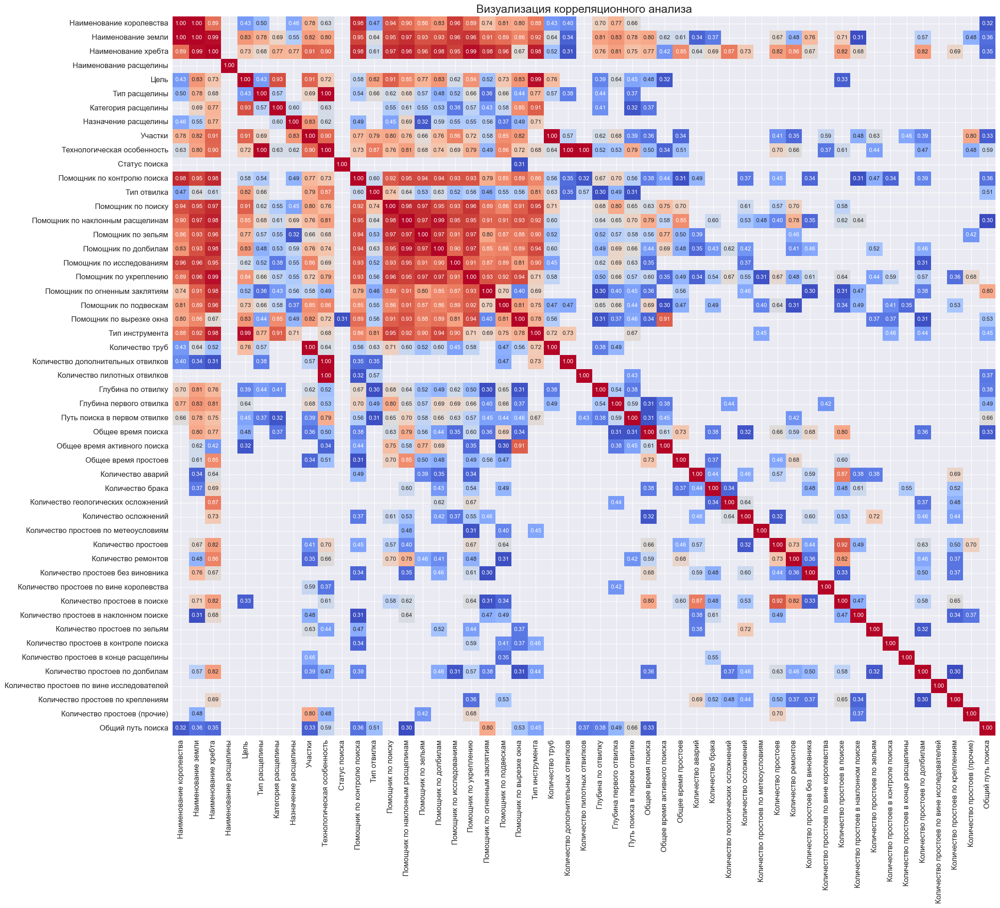

In [78]:
def annotate_cells(data, threshold=0.3):
    mask = np.abs(data) >= threshold
    return data.where(mask, other=np.nan)


df_filtered = df.drop(columns=['Дата начала поиска', 'Дата окончания поиска'])

phik_corr_matrix = df_filtered.phik_matrix(
    interval_cols=[col for col in df_filtered.columns if
                   df_filtered[col].dtype in ['float64', 'int64']])

filtered_phik_corr_matrix = annotate_cells(phik_corr_matrix, threshold=0.3)

plt.figure(figsize=(22, 20))
sns.heatmap(filtered_phik_corr_matrix, annot=True, fmt=".2f", cmap='coolwarm',
            annot_kws={"size": 9}, cbar=False)
plt.title(
    "Визуализация корреляционного анализа для исходного набора",
    fontsize=18)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()

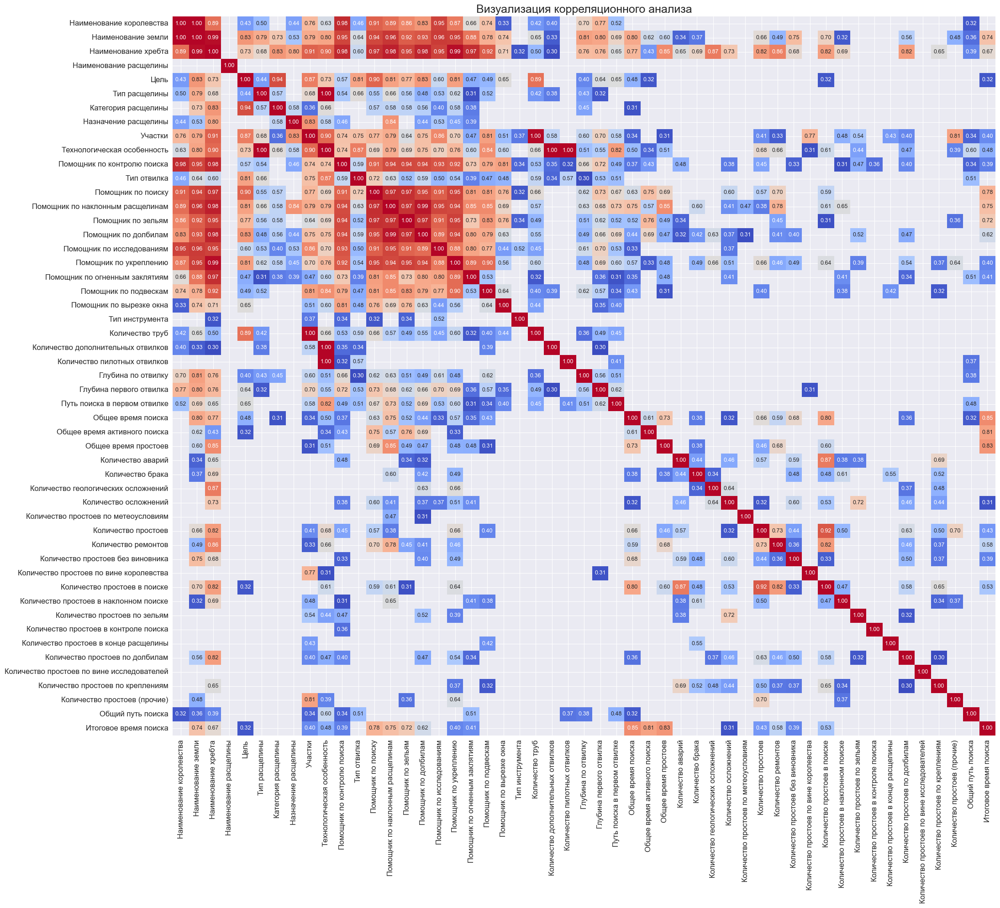

In [79]:
def annotate_cells(data, threshold=0.3):
    mask = np.abs(data) >= threshold
    return data.where(mask, other=np.nan)


df_filtered_an = analysis_df.drop(
    columns=['Дата начала поиска', 'Дата окончания поиска'])

phik_corr_matrix_an = df_filtered_an.phik_matrix(
    interval_cols=[col for col in df_filtered_an.columns if
                   df_filtered_an[col].dtype in ['float64', 'int64']])

filtered_phik_corr_matrix_an = annotate_cells(phik_corr_matrix_an,
                                              threshold=0.3)

plt.figure(figsize=(22, 20))
sns.heatmap(filtered_phik_corr_matrix_an, annot=True, fmt=".2f",
            cmap='coolwarm',
            annot_kws={"size": 9}, cbar=False)
plt.title(
    "Визуализация корреляционного анализа для заполненного набора",
    fontsize=18)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()

**Промежуточный вывод:**
>_Анализ показал скореллированность множества признаков в исследуемом наборе  
данных. Стоит отметить, что категориальные признаки зачастую обладают более  
высокой мерой совместной изменчивости, чем числовые._

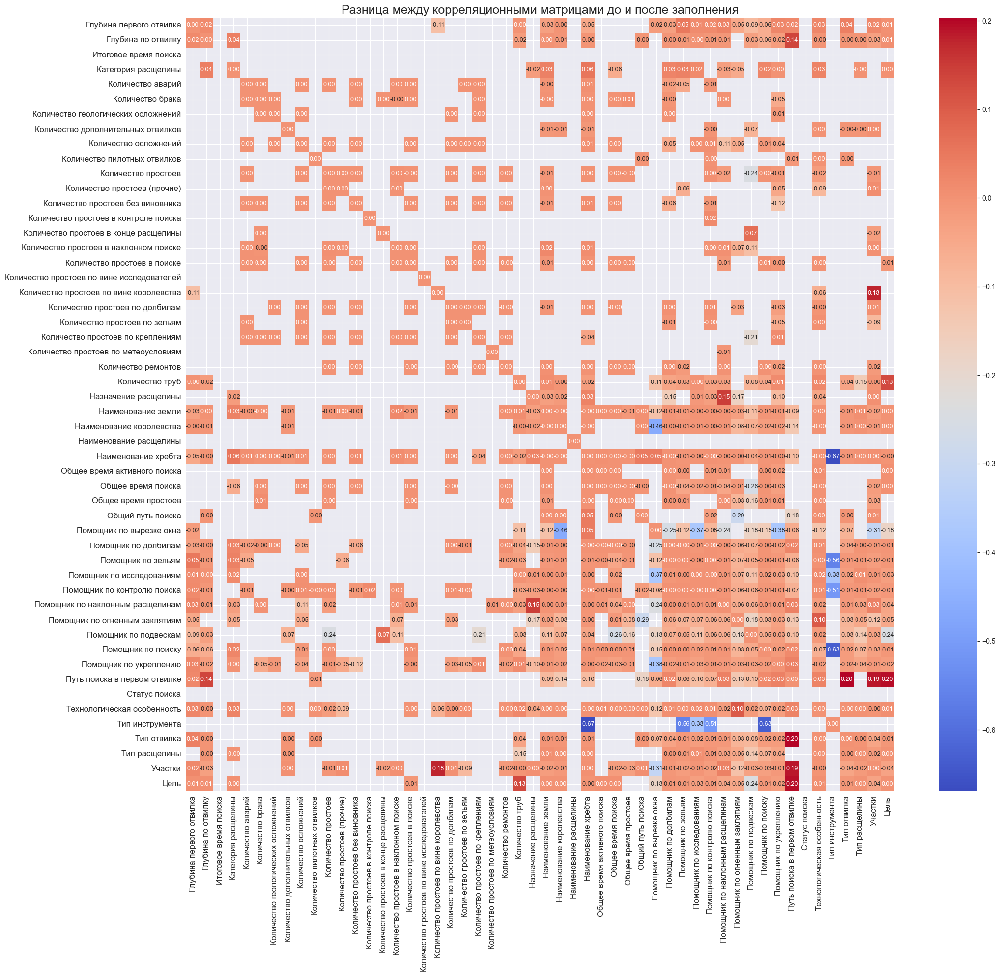

In [139]:
def annotate_cells(data, threshold=0.3):
    mask = np.abs(data) >= threshold
    return data.where(mask, other=np.nan)


df_filtered = df.drop(columns=['Дата начала поиска', 'Дата окончания поиска'])
df_filtered_an = analysis_df.drop(
    columns=['Дата начала поиска', 'Дата окончания поиска'])

interval_cols_df = [col for col in df_filtered.columns if
                    df_filtered[col].dtype in ['float64', 'int64']]
interval_cols_an = [col for col in df_filtered_an.columns if
                    df_filtered_an[col].dtype in ['float64', 'int64']]

phik_corr_matrix_df = df_filtered.phik_matrix(interval_cols=interval_cols_df)
filtered_phik_corr_matrix_df = annotate_cells(phik_corr_matrix_df,
                                              threshold=0.3)

phik_corr_matrix_an = df_filtered_an.phik_matrix(
    interval_cols=interval_cols_an)
filtered_phik_corr_matrix_an = annotate_cells(phik_corr_matrix_an,
                                              threshold=0.3)

corr_diff = filtered_phik_corr_matrix_an - filtered_phik_corr_matrix_df

plt.figure(figsize=(22, 20))
sns.heatmap(corr_diff, annot=True, fmt=".2f", cmap='coolwarm',
            annot_kws={"size": 9}, cbar=True)
plt.title("Разница между корреляционными матрицами до и после заполнения",
          fontsize=18)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

#### Гипотезы о существовании причинно-следственных связей в наборе

* **Общее время поиска -** _сильнее всего связана с количеством простоев и  
ремонтов, а так же с наименованием земли, хребта, тех. особенностями  
и привлечением различных помощников к поискам артефакта. Опровергнуть влияние  
всех этих факторов на значение целевой переменной трудно, значения переменных  
определенно пригодятся при интерпретации результатов работы модели и  
составлении оптимального плана._


* **Наименование королевства -** _помимо наиболее ожидаемых признаков, обладает  
выраженной корреляцией с целью и типом расщелины, похоже, что определенных  
регионов существует ряд геологических и технологических особенностей,  
которые наносят отпечаток на технологические процессы. Сильная  
скореллированность с компаниями, оказывающими исследователям вспомогательные  
услуги, может говорить о существовании регионов ведения бизнеса для этих самых  
компаний, что укладывается в гипотезу о причинах появления схожих имён в  
этих категориях. Значение в 0.3 для общего пути поиска может говорить о том,  
что существуют королевства, для которых характерны более глубокие расщелины  
или повышенное число отвилков._


* **Цель -** _признак созависим с большинством других в той или иной мере.  
Интересна взаимосвязь с наличием определенной конфигурации участков и  
технологических особенностей._ 


* **Тип расщелины -** _напрямую связан с технологическими особенностями  
шахты, что достаточно логично и, похоже, не влияет на количество простоев и  
частоту возникновения брака._


* **Назначение расщелины -** _имеет меру совместной изменчивости, равную 0.71  
с типом инструмента, что наводит на мысль о том, что для поиска некоторых  
артефактов необходимо специальное оборудование. Так же есть взаимосвязь с  
названием хребтов, что говорит о региональной локализованности поисков._


* **Участки -** _разделение расщелины на участки во время горнопроходческих  
работ не может быть случайным или бесцельным, это объясняет наличие весьма  
тесной взаимосвязи данного признака со многими остальными._ 


* **Технологическая особенность -** _ожидаемо вынуждает прибегать к помощи  
сторонних компаний, сильно сказывается на количестве простоев и пути поиска.  
Прослеживается и выраженная положительная корреляция с целевой переменной._


* **Статус поиска -** _статус поиска зависит от компании, которая оказывала  
помощь в вырезке окна. Эта информация пригодится для составления оптимального  
плана поиска._


* **Помощники в поиске -** _привлечение в экспедицию тех или иных  
сторонних специалистов связано с регионом проведения исследования. Стоит  
отметить, что записи зачастую коррелируют друг с другом. Самая сильная связь  
с целевой переменной прослеживается для помощников по подвескам и наклонным  
расщелинам, чуть слабее с ней связаны помощники по поиску и укреплению._


* **Тип инструмента -** _тесно связан с местом поисков, это может быть  
обусловлено ассортиментом регионального рынка кувалд и долбил, которые  
разработаны специально для местных пород и погодных условий. С целевой  
переменной тип инструмента не коррелирует._


* **Количество простоев, браков и осложнений -** _взаимосвязано со многими  
факторами в данных, ожидаемо, что на значении целевой переменной сказывается  
количество простоев при поиске, количество и общее время простоев. Так же  
очевидна взаимосвязь между переменными и привлечением в экспедицию  
различных помощников._


* **Общий путь поиска -** _интересно, что эта переменная не обладает  
сильно выраженной корреляцией с длительностью поиска. Похоже, что если  
экспедиция идёт по плану и без осложнений, увеличение длины пути не так сильно  
сказывается на затраченном времени, как можно подумать._

_Отдельно стоит сказать о том, что заполнение пропущенных значений в наборе  
данных не имело выраженного влияния на мультиколлинеарность в признаковом  
пространстве. Самые серьезные, из зафиксированных, изменений произошли со  
столбцом 'Тип инструмента', это ожидаемо, так как для него была проведена  
замена типа переменной на булеву. Отсутствие масштабных изменений в  
соотношении корреляционных мер является косвенным признаком того, что бустинг  
успешно справился со своей задачей по заполнению пропусков и не дал  
сильного смещения._

## ➢ Графический анализ числовых данных
_Создадим функцию, позволяющую автоматизировать визуализацию распределений  
для наиболее важных числовых признаков. Дополним вывод функции описательной  
статистикой, сформированной стандартными средствами библиотеки **padnas**.  
Во время исследования постараемся установить природу возникновения  
экстремальных значений в наборе данных._

In [80]:
def plot_hist_box(df, analysis_df, column, bins, y_max=None):
    stats_df = df[column].describe().to_frame()
    stats_analysis_df = analysis_df[column].describe().to_frame()

    fig = plt.figure(constrained_layout=True, figsize=(24, 12))
    spec = fig.add_gridspec(2, 3, height_ratios=[1, 2], width_ratios=[2, 3, 3])

    ax_table = fig.add_subplot(spec[0, 0])
    ax_box_df = fig.add_subplot(spec[0, 1])
    ax_box_analysis_df = fig.add_subplot(spec[0, 2])
    ax_hist = fig.add_subplot(spec[1, 0])
    ax_hist_iqr = fig.add_subplot(spec[1, 1:])

    fig.suptitle(f"Анализ столбца '{column}'", fontsize=18)

    ax_table.axis('off')
    table_data = pd.concat([stats_df, stats_analysis_df], axis=1,
                           keys=['df [исходный]',
                                 'analysis_df [заполненный]']).round(2)
    table = ax_table.table(cellText=table_data.values,
                           colLabels=table_data.columns.get_level_values(1),
                           rowLabels=table_data.index, loc='center')
    table.scale(1.5, 1.5)  # Увеличение масштаба таблицы для лучшей читаемости
    for key, cell in table.get_celld().items():
        cell.set_fontsize(
            14)  # Установлен более крупный шрифт для всех ячеек таблицы

    sns.histplot(df[column], kde=True, bins=bins, color='red', ax=ax_hist,
                 label='df')
    sns.histplot(analysis_df[column], kde=True, bins=bins, color='blue',
                 ax=ax_hist, label='analysis_df', alpha=0.5)
    ax_hist.axvline(df[column].mean(), color='orange', linestyle='--',
                    linewidth=1.5, label='Среднее [исходный]')
    ax_hist.axvline(df[column].median(), color='green', linestyle='-',
                    linewidth=1.5, label='Медиана [исходный]')
    ax_hist.set_title(f'Гистограмма')
    ax_hist.set_xlabel(column)
    ax_hist.legend()

    sns.boxplot(y=df[column], ax=ax_box_df, color='red')
    ax_box_df.set_title(f'Боксплот [исходный]')
    ax_box_df.set_ylabel(column)

    sns.boxplot(y=analysis_df[column], ax=ax_box_analysis_df, color='blue')
    ax_box_analysis_df.set_title(f'Боксплот [заполненный]')
    ax_box_analysis_df.set_ylabel(column)

    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_count_df = (
            (df[column] < lower_bound) | (df[column] > upper_bound)).sum()
    outliers_count_analysis_df = ((analysis_df[column] < lower_bound) | (
            analysis_df[column] > upper_bound)).sum()

    ax_box_df.text(0.95, 0.1, f'Выбросы [исходный]: {outliers_count_df}',
                   transform=ax_box_df.transAxes,
                   horizontalalignment='right',
                   verticalalignment='center',
                   fontsize=12, color='red')

    ax_box_analysis_df.text(0.95, 0.1,
                            f'Выбросы [заполненный]: {outliers_count_analysis_df}',
                            transform=ax_box_analysis_df.transAxes,
                            horizontalalignment='right',
                            verticalalignment='center',
                            fontsize=12, color='blue')

    sns.histplot(df[(df[column] >= Q1) & (df[column] <= Q3)][column],
                 kde=True, bins=bins, color='red', ax=ax_hist_iqr, label='df')
    sns.histplot(
        analysis_df[(analysis_df[column] >= Q1) & (analysis_df[column] <= Q3)][
            column],
        kde=True, bins=bins, color='blue', ax=ax_hist_iqr, label='analysis_df',
        alpha=0.5)
    ax_hist_iqr.axvline(df[column].mean(), color='orange', linestyle='--',
                        linewidth=1.5, label='Среднее [исходный]')
    ax_hist_iqr.axvline(df[column].median(), color='green', linestyle='-',
                        linewidth=1.5, label='Медиана [исходный]')
    ax_hist_iqr.set_title(f'Гистограмма в пределах IQR')
    ax_hist_iqr.set_xlabel(column)
    ax_hist_iqr.legend()

    if y_max is None:
        max_ylim = max(ax_hist.get_ylim()[1], ax_hist_iqr.get_ylim()[1])
    else:
        max_ylim = y_max
    ax_hist.set_ylim(0, max_ylim)
    ax_hist_iqr.set_ylim(0, max_ylim)

    plt.show()

**Количество труб**

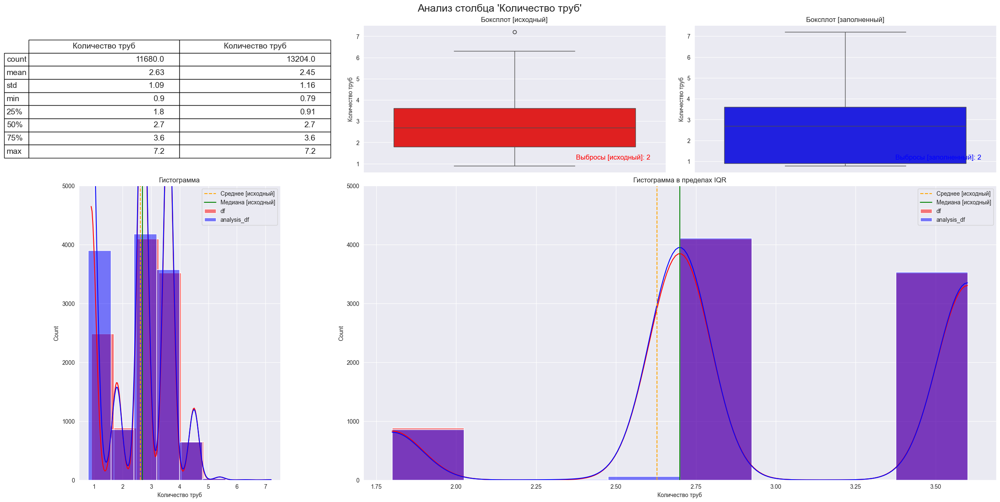

In [81]:
plot_hist_box(df, analysis_df, 'Количество труб', 8, 5000)

**Вывод:**
>_Визуализировав распределение и получив описательную статистику можно заметить,  
что наиболее вероятным будет использование 2 - 3 труб на расщелину.  
Экстремальные значения не являются аномалиями, учитывая специфику предметной  
области, вполне вероятно наличие 7 и более труб на одну расщелину.  
Стандартное отклонение изменилось незначительно, после заполнения пропусков,  
в целом можно заметить схожесть гистограмм для заполненного и исходного наборов._

**Дополнительные отвилки**

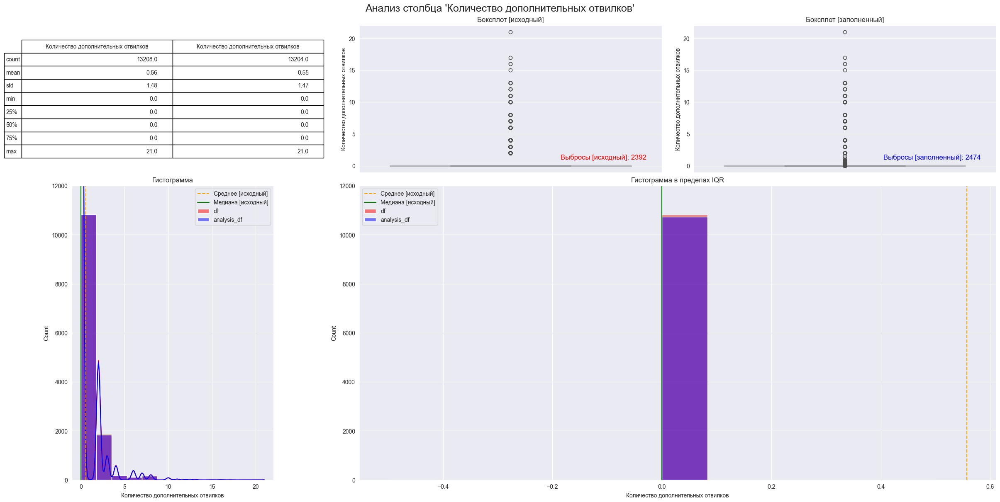

In [82]:
plot_hist_box(df, analysis_df, 'Количество дополнительных отвилков', 12, 12000)

**Вывод:**
>_Вероятнее всего, что в исследуемой расщелине не будет дополнительных отвилков.  
Однако существуют расщелины, количество отвилков в которых доходит до 21.  
Скорее всего такие высокие показатели объясняются технологическими требованиями.  
Характер распределения не изменился, после заполнения пропусков._ 


**Пилотные отвилки**

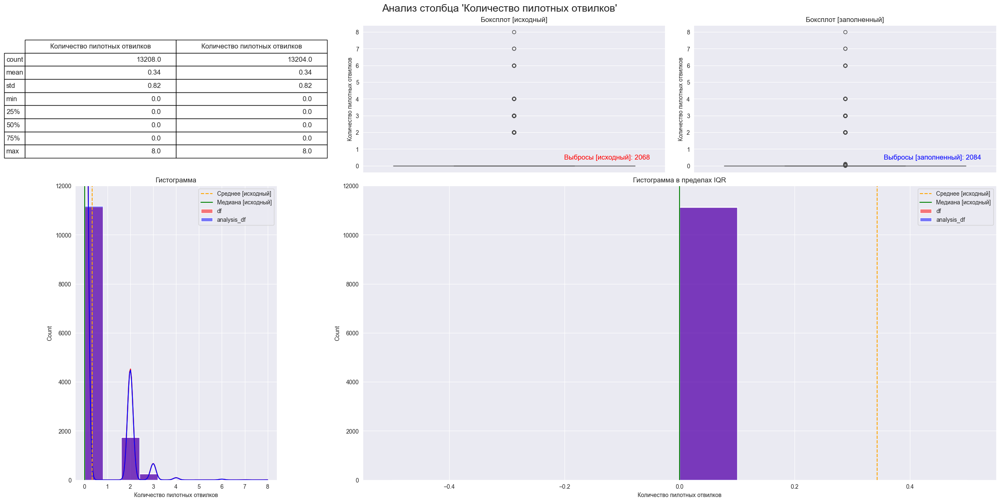

In [83]:
plot_hist_box(df, analysis_df, 'Количество пилотных отвилков', 10, 12000)

**Вывод:**
>_Вспомогательные тоннели встречаются еще реже чем обыкновенные отвилки.  
Однако стоит заметить, что их наличие сильнее коррелирует с целевой переменной.  
Смещение статистик отсутствует, до и после заполнения пропусков стандартное  
отклонение не изменилось._ 


**Глубина по отвилку**

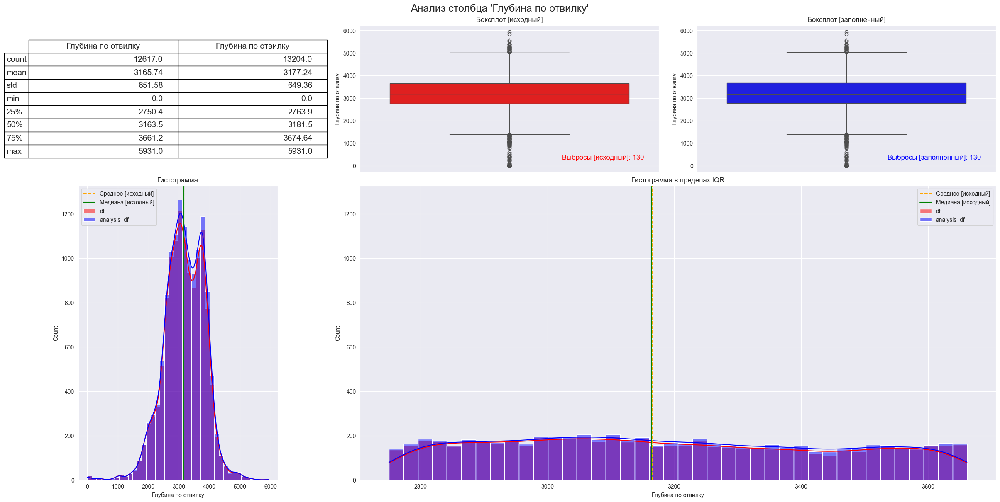

In [84]:
plot_hist_box(df, analysis_df, 'Глубина по отвилку', 40)

**Вывод:**
>_Типичная глубина по отвилку находится в пределах от 2700 до 3700. Среднее  
совпадает с медианой. Наблюдается несколько пиков в районе 2800 и 3900.   
Существует некоторое количество экстремально глубоких отвилков, скорее всего  
их наличие не свидетельствует о наличии аномалии в данных.  
Значение корреляции с целевой переменной находится на отметке 0.3, в это значение  
объясняется наличием четкой причинно-следственной связи между глубиной расщелины  
и временем, требуемым на ее исследование.  
Стандартное отклонение и меры центральной тенденции практически не изменились  
после заполнения пропусков бустингом. Визуально, новое распределение носит  
такой же характер, имея несколько пиков._ 


**Глубина первого отвилка**

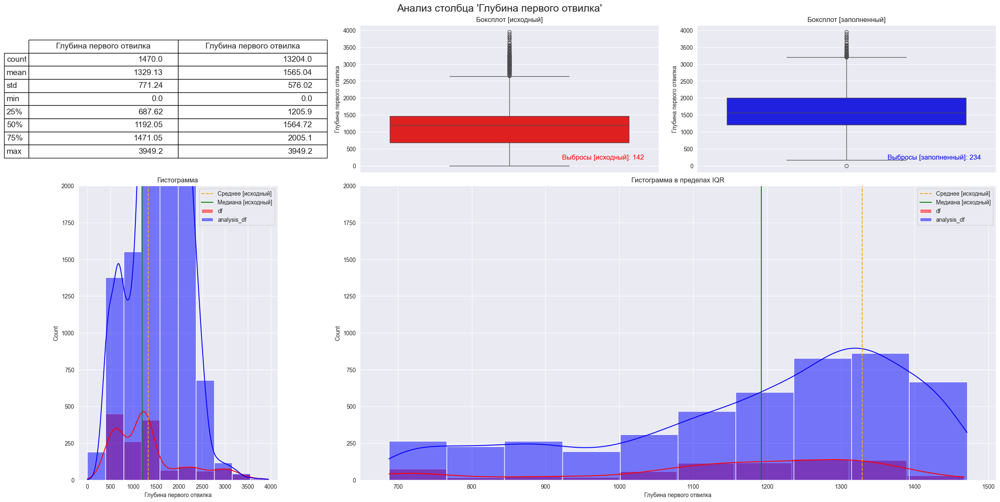

In [85]:
plot_hist_box(df, analysis_df, 'Глубина первого отвилка', 10, 2000)

**Вывод:**
>_Признак показал наличие корреляции с "Глубиной по отвилку". Типичная  глубина  
первого отвилка расщелины находится в пределах от 700 до 1500. Ожидаемо, что  
существую экстремально - глубокие первые отвилки, таких в краснолюдской карте  
142 штуки. Аномальными данные значения признать невозможно, так как максимальное  
значение глубины первого отвилка не слишком сильно отличается от средней длины  
отвилков в целом. Среднее значение находится на отметке в 1564 метров, оно  
равняется медиане набора. После заполнения пропусков распределение несколько  
изменило свой характер, о чём говорит уменьшившееся на треть стандартное  
отклонение._


**Путь поиска в первом отвилке**

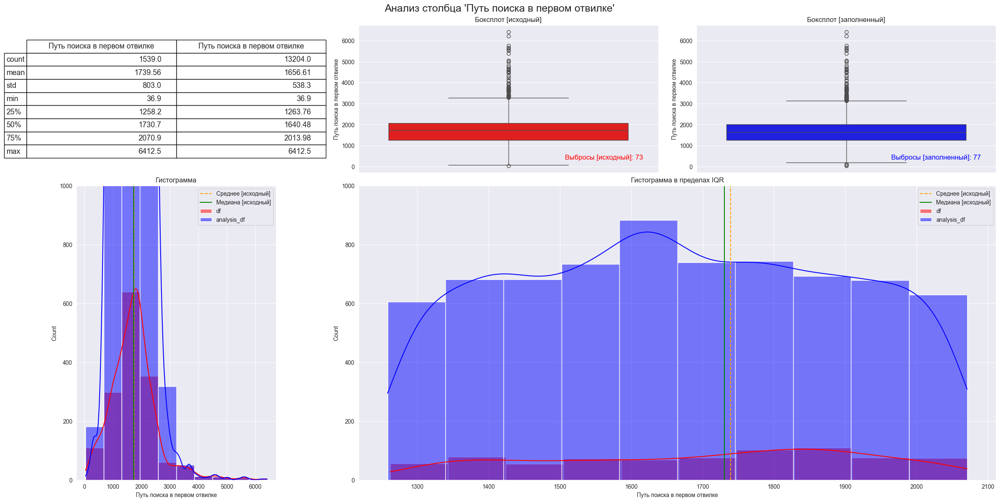

In [86]:
plot_hist_box(df, analysis_df, 'Путь поиска в первом отвилке', 10, 1000)

**Вывод:**
>_Данный столбец имеет отрицательную корреляцию с предыдущим, что странно.  
Предстоит понять, по какой причине увеличение глубины первого отвилка  
отрицательно сказывается на пути поиска в нём. Типичный путь поиска  
можно ожидать в пределах от 1200 до 2000. Стандартное отклонение уменьшилось,  
после заполнения пропусков в данных._


**Общее время поиска**

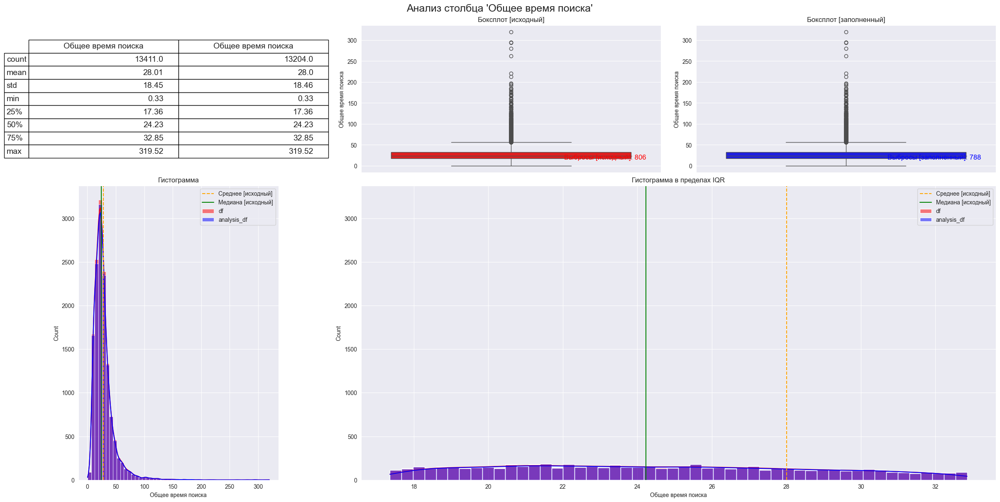

In [87]:
plot_hist_box(df, analysis_df, 'Общее время поиска', 50)

**Вывод:**
>_Столбец содержащий целевую переменную. Его распределение представляет особенную  
ценность для интерпретации результатов исследования. Можно ожидать, что поиск в  
расщелине продлится от 17 до 33 дней. 806 наблюдений из краснолюдской карты  
продлились экстремально долго, вплоть до 319 дней, некоторые наблюдения,  
напротив, шли очень недолго, самое быстрое из них 0.33 дня.  
Использование таких записей в обучающей выборке может повлиять на качество  
работы модели, поэтому они нуждаются в дополнительной проверке.  
Столбец изначально был заполнен почти полностью, следовательно бустинг  
на него не влиял._


**Общее время простоев**

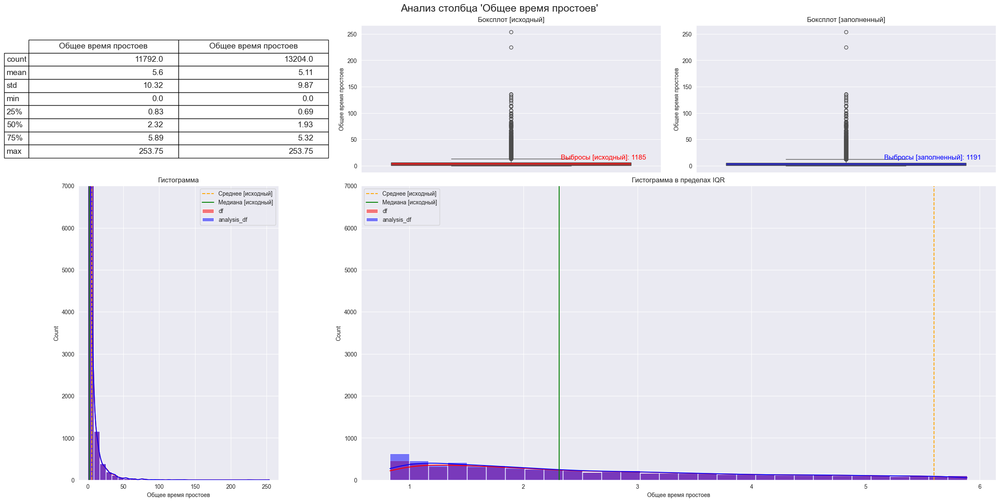

In [88]:
plot_hist_box(df, analysis_df, 'Общее время простоев', 30, 7000)

**Вывод:**
>_Исследуя расщелину, можно рассчитывать, что некоторое время экспедиция  
потратит простаивая по различным причинам. Среднее и медиана для этого столбца  
различаются более, чем в 2 раза. Разброс переменной зависит от большого  
количества факторов. 1185 записей в датасете признаны экстремальными, на  
графике видно два наблюдения, для которых общее время простоя превысило отметку  
в 200 дней. Возможно на участке произошла авария, либо исследование было  
остановлено по другой причине, после чего возобновлено. Скорее всего данный  
столбец не будет представлять для нас интереса, так как включение его в обучающую  
выборку приведет к утечке целевого признака.  
Внешний вид распределения не изменился, после заполнения пропусков._


**Общее время активного поиска**

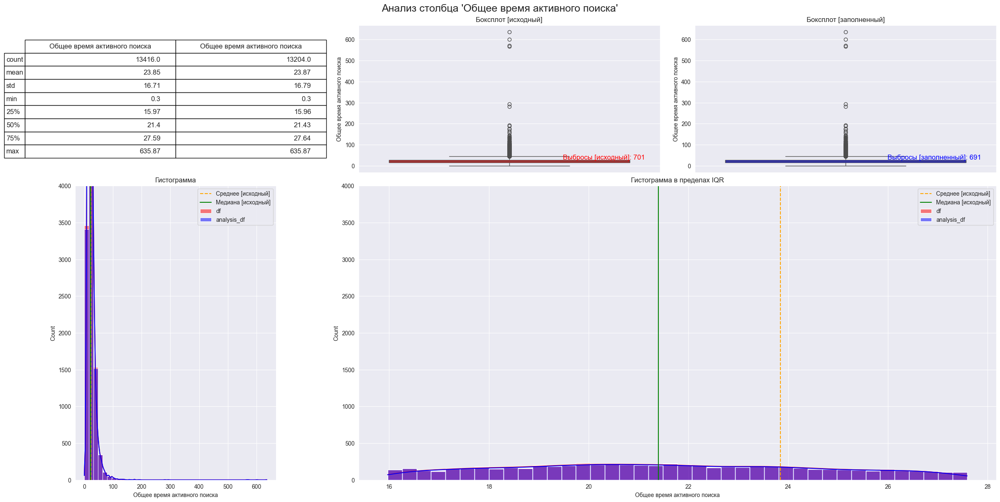

In [89]:
plot_hist_box(df, analysis_df, 'Общее время активного поиска', 40, 4000)

**Вывод:**
>_Второй компонент общего времени поиска. Среднее и медиана набора на этот раз  
находятся не так далеко друг от друга. Для одной записи можно ожидать, что  
время активного поиска будет находится в пределах от 16 до 28 дней.  
Несколько наблюдений являются выбросами, так как имеют значение, превышающее   
максимальное значение колонки "Общее время поиска". Использование данного  
признака в обучающей выборке приведёт к утечке целевого признака.  
Внешний вид распределения не изменился, после заполнения пропусков._


**Количество аварий**

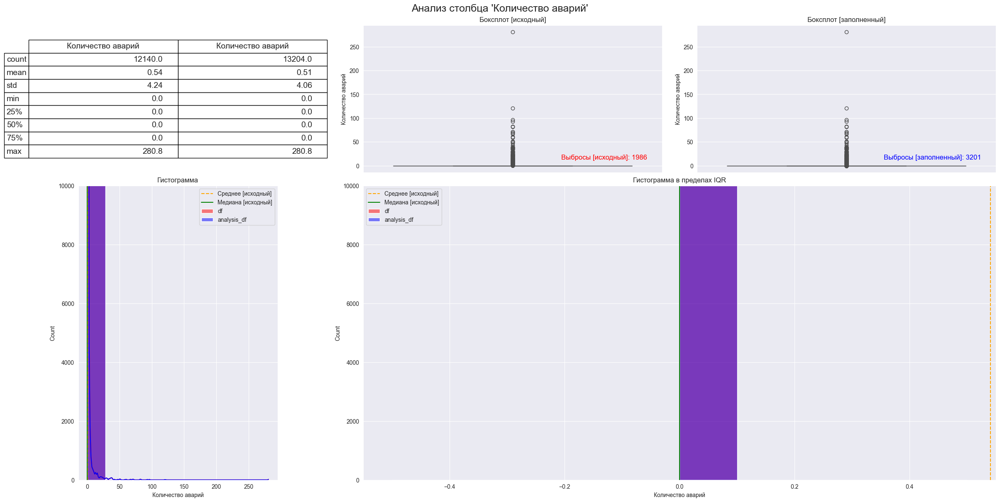

In [90]:
plot_hist_box(df, analysis_df, 'Количество аварий', 10, 10000)

**Вывод:**
>_Зачастую экспедиция в расщелину проходит без аварий вовсе, однако нередки  
и противоположные события. Очевидно, что некоторая часть значений в данном  
столбце является аномально большими и нуждаются в замене на более подходящие.  
Высокие значения признака положительно коррелируют с целевой переменной.  
Использование данного признака в обучающей выборке приведет к утечке целевого  
признака. Внешний вид распределения почти не изменился, после заполнения  
пропусков, однако значительно большее число наблюдений теперь распознаются,  
как экстремальные._


**Количество брака**

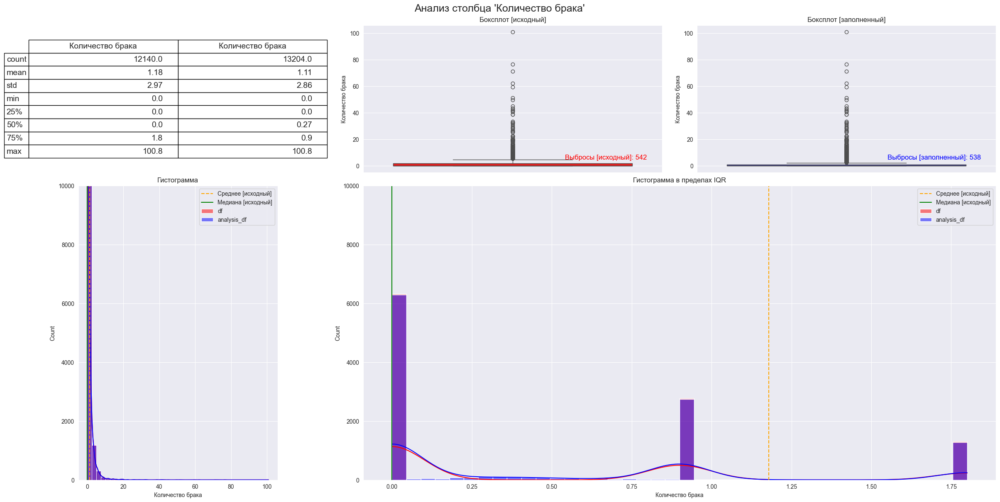

In [91]:
plot_hist_box(df, analysis_df, 'Количество брака', 40, 10000)

**Вывод:**
>_Продукты исследования расщелин, как и продукты любой другой  
научно-технической деятельности могут быть выбракованы по ряду признаков.  
Краснолюдская карта показывает, что это происходит не очень часто, однако  
вероятность ненулевая. Признак демонстрирует выраженную положительную  
корреляцию с целевой переменной. Наблюдается некоторое количество выбросов,  
часть наблюдений можно считать аномальными. Использование этого признака для  
обучения модели приведет к утечке целевого признака.  
Внешний вид распределения почти не изменился, после заполнения пропусков_

**Количество геологических осложнений**

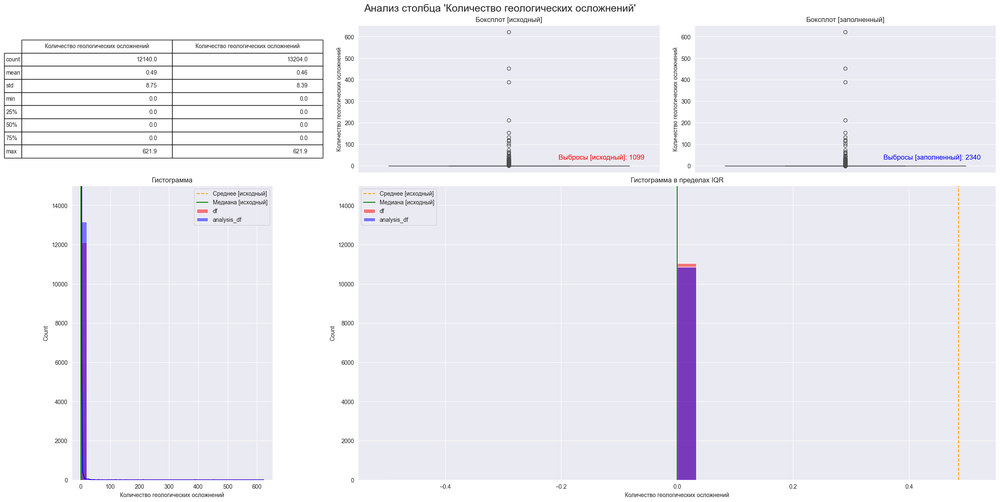

In [92]:
plot_hist_box(df, analysis_df, 'Количество геологических осложнений', 30,
              15000)

**Вывод:**
>_В аннотации к исследованию указано, что "Геологические опасности включают  
нестабильные слои земли, скрытые подземные воды и обвалы". Корреляционный  
анализ показал некоторую степень созависимости с целевой переменной, но  
согласно накопленным данным геологически осложнения случаются не так часто.  
2340 записей содержат экстремально высокие показатели количесва геологических  
осложнений, неизвестно является ли это ошибкой сбора данных или следствием  
ряда естественных причин. До начала экспедиции у героев не получится узнать  
о количестве трудностей геологической природы, поэтому использовать этот  
признак при обучении нельзя. После заполнения пропусков несколько уменьшилось  
среднее для набора и стандартное отклонение._

**Количество осложнений**

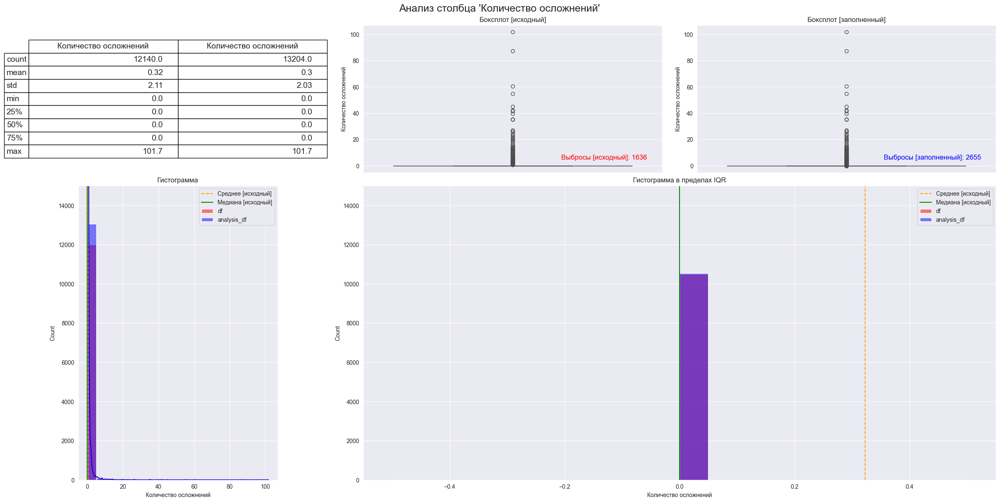

In [93]:
plot_hist_box(df, analysis_df, 'Количество осложнений', 20, 15000)

**Вывод:**
>_В эту категорию можно отнести все трудности иного характера, которые  
возникают при исследовании расщелин. Осложнения возникают не так часто, однако  
некоторые экспедиции с ними часто сталкиваются. Ожидаемо, что переменная  
будет коррелировать с целевым признаком. Использование признака в обучающей  
выборке недопустимо по причине возможной утечки целевой переменной.  
Внешний вид распределения почти не изменился, после заполнения пропусков._

**Количество простоев по метеоусловиям**

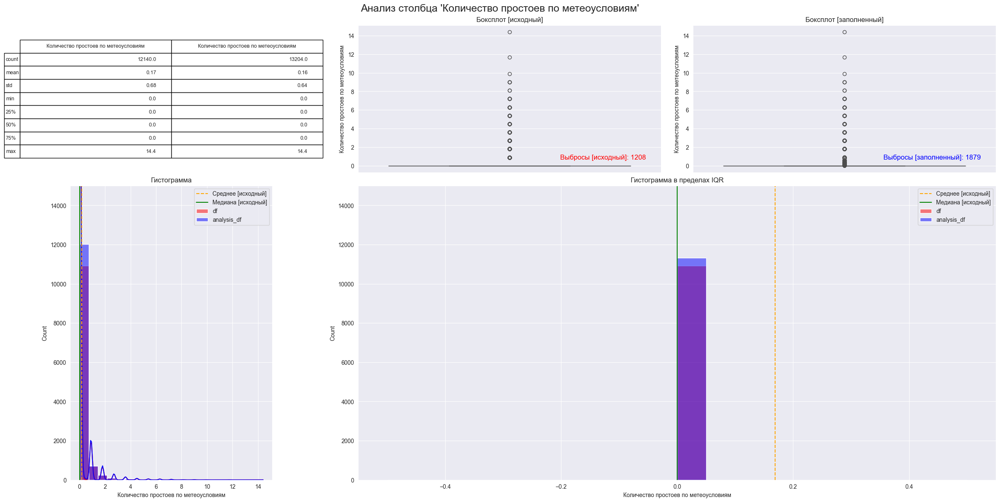

In [94]:
plot_hist_box(df, analysis_df, 'Количество простоев по метеоусловиям', 20,
              15000)

**Вывод:**
>_Принимая во внимание аннотацию к исследованию "Метели и снежные бури  
налетают будто ниоткуда и замедляют процесс поиска артефактов.", можно сделать  
вывод, что значение исследуемого признака отразится на конечном времени  
экспедиции. Из карты краснолюдов следует, что простои по метеоусловиям  
случаются достаточно редко. Использовать в обучении данный признак не удастся,  
так как героям не будут заранее известны погодные условия, однако при  
интерпретации результатов этот признак будет полезен.  
Внешний вид распределения почти не изменился, после заполнения пропусков._


**Количество простоев**

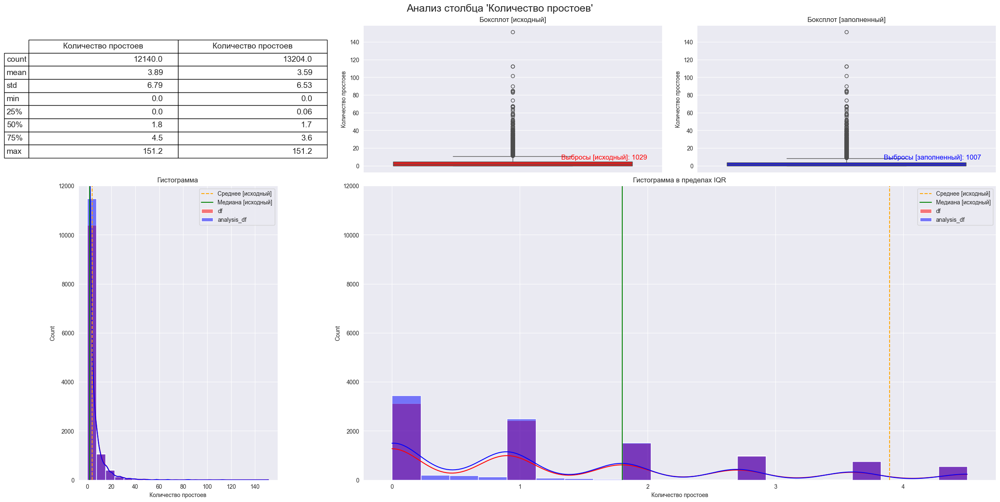

In [95]:
plot_hist_box(df, analysis_df, 'Количество простоев', 20, 12000)

**Вывод:**
>_Одна из переменных, демонстрирующих наиболее выраженную совместную  
изменчивость с целевой переменной. Среднее и медиана набора различаются в 2  
раза. Простои не редкость во время экспедиции. Использование при обучении 
модели невозможно.  
Внешний вид распределения почти не изменился, после заполнения пропусков._

**Количество ремонтов**

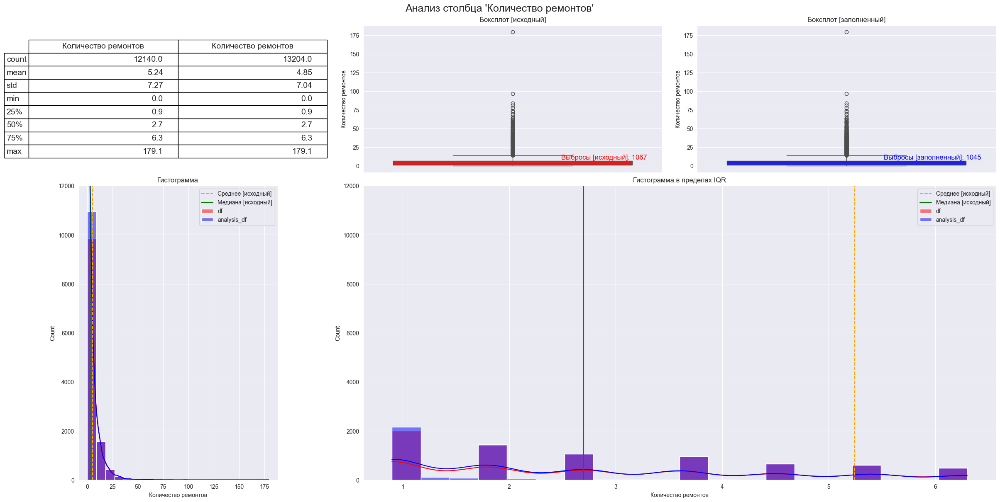

In [96]:
plot_hist_box(df, analysis_df, 'Количество ремонтов', 20, 12000)

**Вывод:**
>_Количество ремонтов отражается на общем времени поиска артефакта, о чем  
свидетельствует значение корреляции на уровне 0.55. Обращаясь к аннотации  
"Технические сложности усугубляют ситуацию, создавая дополнительные простои.  
Старые гномьи механизмы часто выходят из строя в самые неподходящие моменты,  
что приводит к вынужденным задержкам и потере производительности.".  
Из данных видно, что ремонтировать оборудование приходится достаточно часто, но  
предсказать его поломку не является возможным, следовательно мы не можем  
включить данную переменную в обучающую выборку.  
После заполнения пропусков в данных, набор немного уменьшил среднее и величину  
стандартного отклонения._

**Количество простоев без виновника**

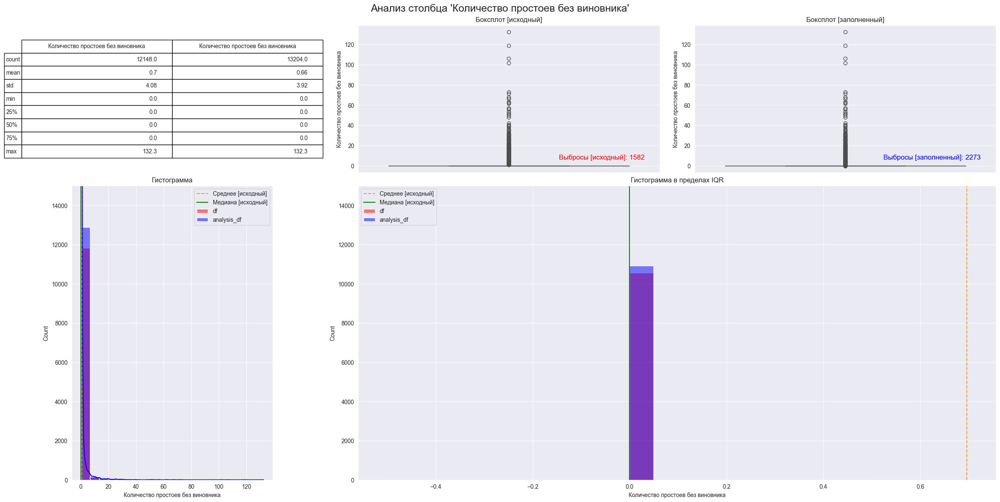

In [97]:
plot_hist_box(df, analysis_df, 'Количество простоев без виновника', 20, 15000)

**Вывод:**
>_Прочие простои, как и все другие отрицательно сказываются на скорости  
поиска требуемых артефактов. Переменная не может быть включена в обучающую  
выборку по причине непредсказуемости возникновения такого рода простоев.  
Внешний вид распределения почти не изменился, после заполнения пропусков._

**Количество простоев по вине королевства**

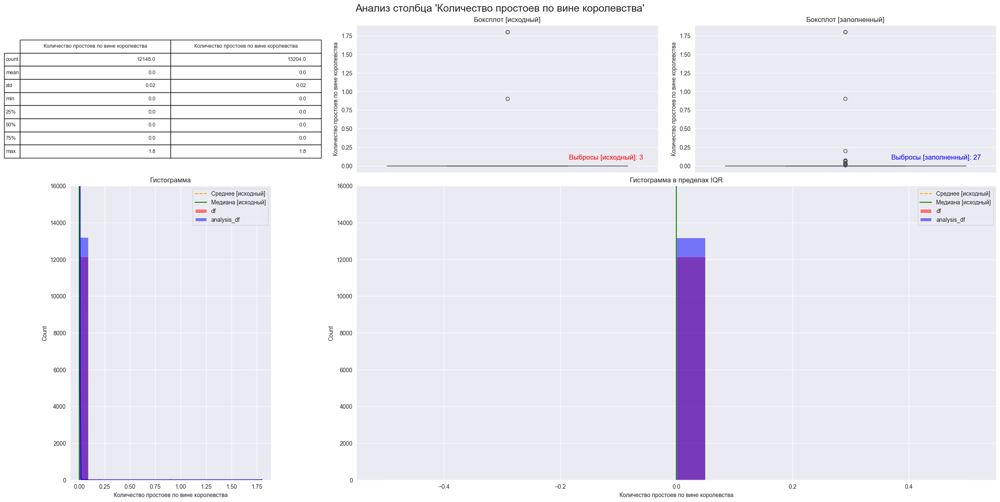

In [99]:
plot_hist_box(df, analysis_df, 'Количество простоев по вине королевства', 20,
              16000)

**Вывод:**
>_Данный тип простоев встречается крайне редко и, в следствие этого,  
не представляет ценности для задачи._

**Количество простоев в поиске**

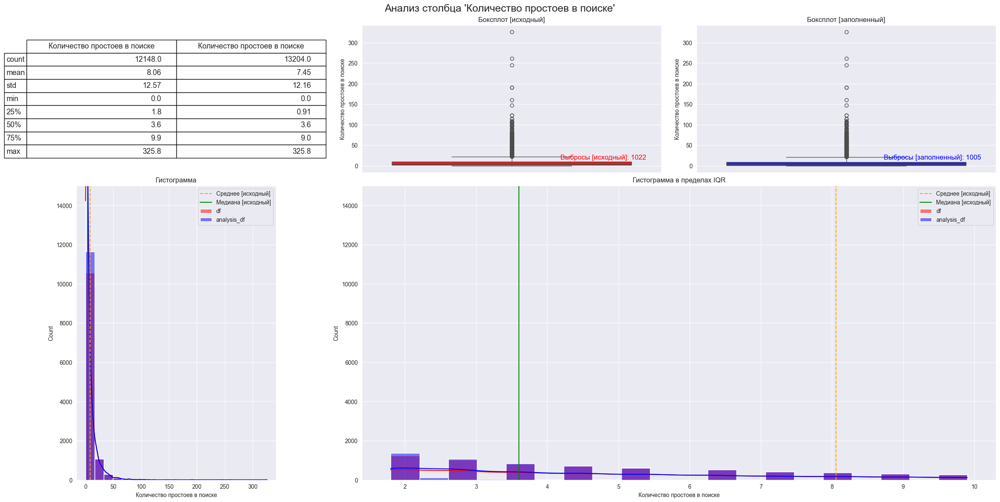

In [100]:
plot_hist_box(df, analysis_df, 'Количество простоев в поиске', 20, 15000)

**Вывод:**
>_Специфичный тип простоев во время исследования, скорее всего связан с  
различными таинственными трудностями, непременно сопровождающими процесс поиска  
магических артефактов. Один из рекордсменов по величине меры корреляции с  
целевой переменной. Можно ожидать, что скорее всего, такие простои возникнут и  
замедлят ход исследования. Нельзя включать признак в обучающую выборку.  
Внешний вид распределения почти не изменился, после заполнения пропусков._

**Количество простоев в наклонном поиске**

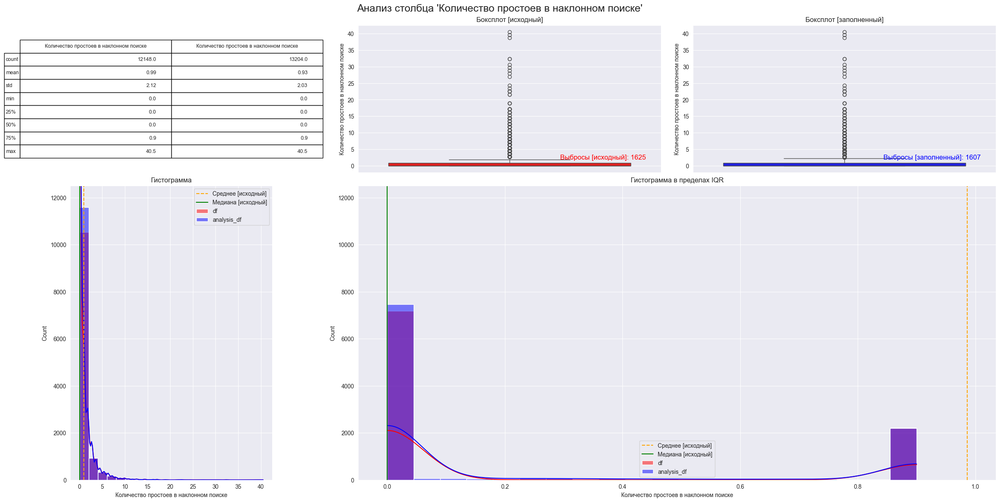

In [101]:
plot_hist_box(df, analysis_df, 'Количество простоев в наклонном поиске', 20,
              12500)

**Вывод:**
>_Наличие уклонов в пещерах затрудняет экспедиционную деятельность.  
В среднем значение находится на отметке в 0.93, а медиана набора равняется 0.  
Боксплот показывает, что 1607 значений являются экстремально большими, однако  
это число выбросов ожидаемо, принимая во внимание показатели других признаков.  
Невозможно использовать данный признак в обучении.  
Внешний вид распределения почти не изменился, после заполнения пропусков._

**Количество простоев по зельям**

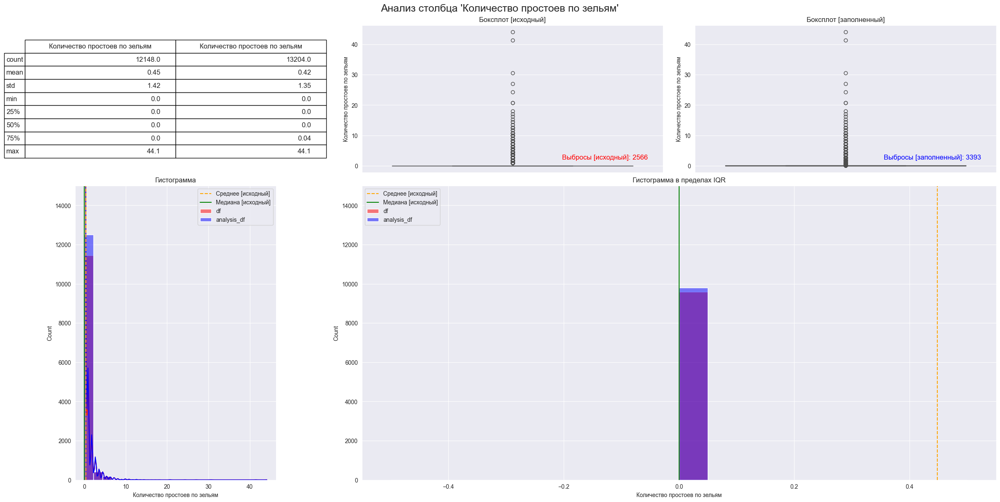

In [102]:
plot_hist_box(df, analysis_df, 'Количество простоев по зельям', 20, 15000)

**Вывод:**
>_Простои из-за снабжения экспедиции зельями случаются не так часто, типичная  
экспедиция вовсе с ними не сталкивается. Рекордное количество выбросов.  
Использование признака в обучающей выборке невозможно, так как приведет к  
утечке целевого признака.  
Внешний вид распределения почти не изменился, после заполнения пропусков._

**Количество простоев в контроле поиска**

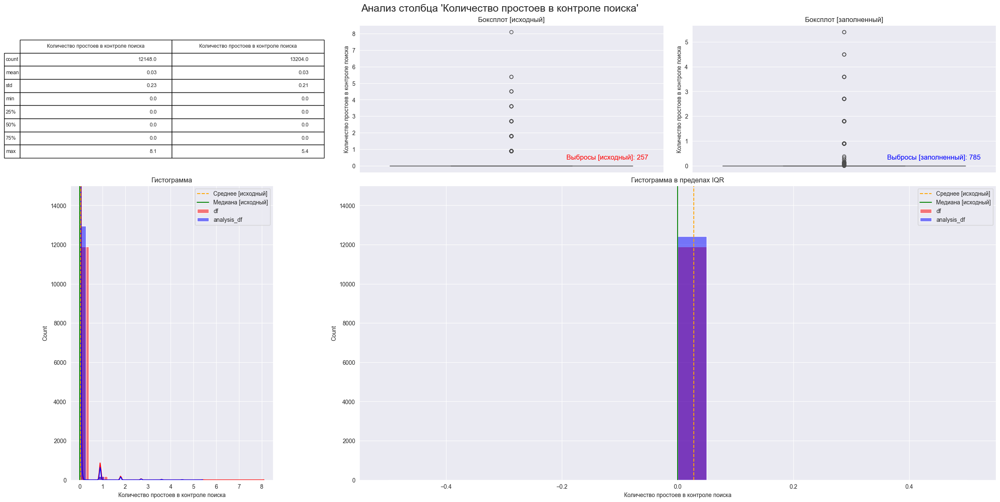

In [103]:
plot_hist_box(df, analysis_df, 'Количество простоев в контроле поиска', 20,
              15000)

**Вывод:**
>_Среднее значение признака не превышает 0.05, что свидетельствует о  
незначительном вкладе данной переменной в длительность описанных краснолюдами  
экспедиций. Невозомжно использовать в обучающей выборке.  
Внешний вид распределения почти не изменился, после заполнения пропусков._

**Количество простоев в конце расщелины**

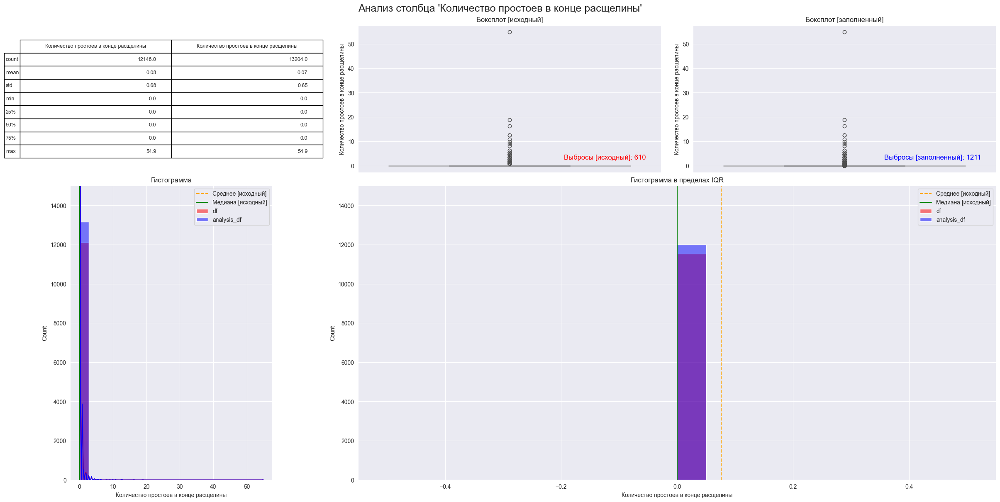

In [104]:
plot_hist_box(df, analysis_df, 'Количество простоев в конце расщелины', 20,
              15000)

**Вывод:**
>_Специфичный тип простоя, с которым сталкиваются некоторые экспедиции.  
Максимальное значение находится на отметке в 55, что намекает на возникновение  
уникального в своём роде наблюдения. Признак не может быть использован при
обучении модели._

**Количество простоев по долбилам**

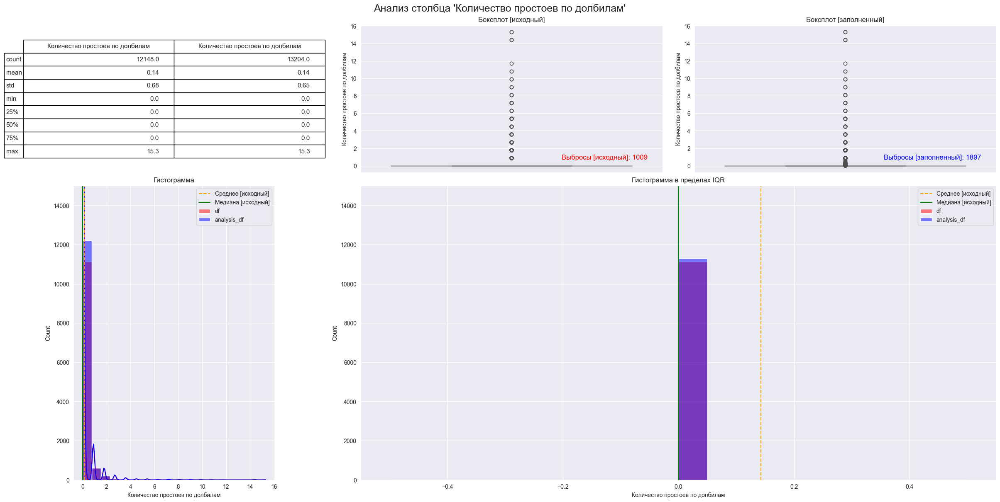

In [105]:
plot_hist_box(df, analysis_df, 'Количество простоев по долбилам', 20, 15000)

**Вывод:**
>_Вероятнее всего, что простоя из-за долбил не случится, но некоторым  
экспедициям может не повезти. Использование признака при обучении приведет  
к утечке целевого признака.  
Внешний вид распределения почти не изменился, после заполнения пропусков._

**Количество простоев по вине исследователей**

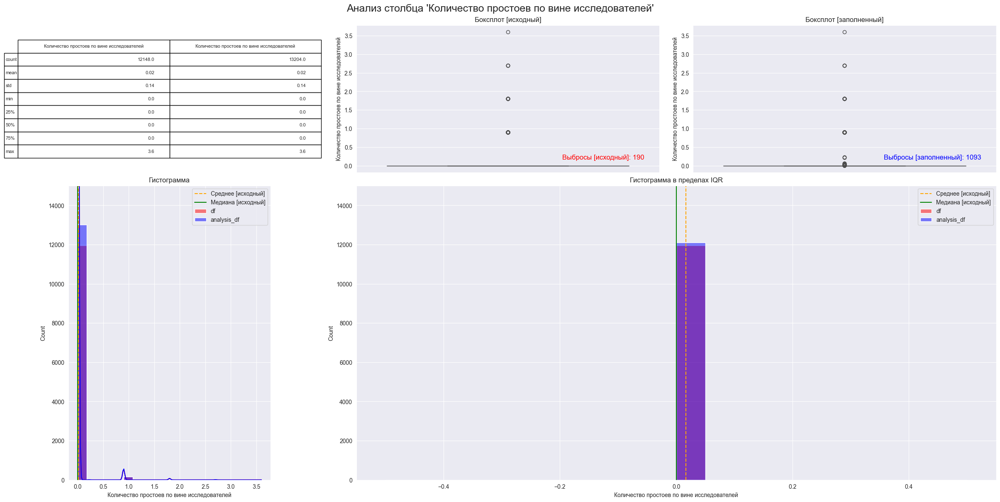

In [106]:
plot_hist_box(df, analysis_df, 'Количество простоев по вине исследователей',
              20,
              15000)

**Вывод:**
>_Небольшое количество выбросов и относительно маленько пиковое значение.  
Признак не может быть использован для обучения модели.  
Внешний вид распределения почти не изменился, после заполнения пропусков._

**Количество простоев по креплениям**

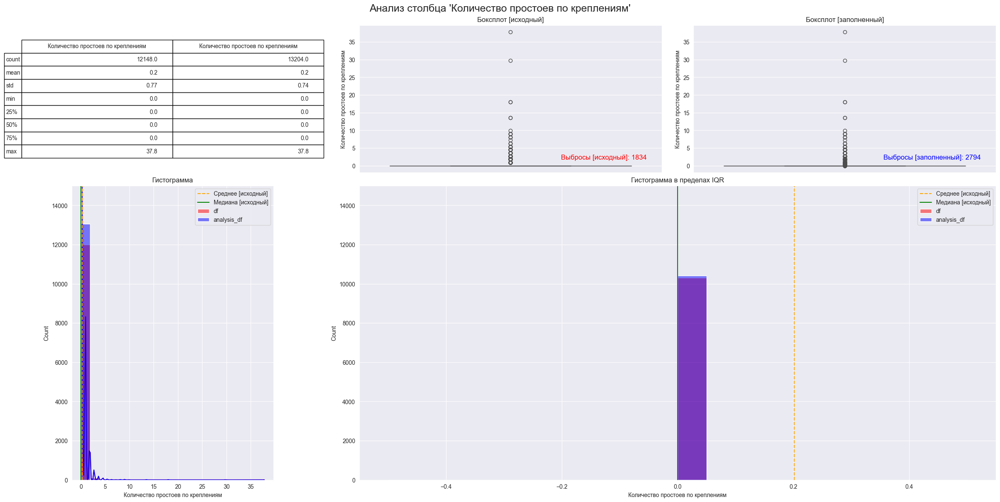

In [107]:
plot_hist_box(df, analysis_df, 'Количество простоев по креплениям', 20, 15000)

**Вывод:**
>_Вероятнее всего экспедиция не столкнется с простоями этого типа, есть  
около 2000 выбросов, которые с высокой долей вероятности не являются  
аномалиями. Признак использовать при обучении невозможно.  
Внешний вид распределения почти не изменился, после заполнения пропусков._

**Количество простоев (прочие)**

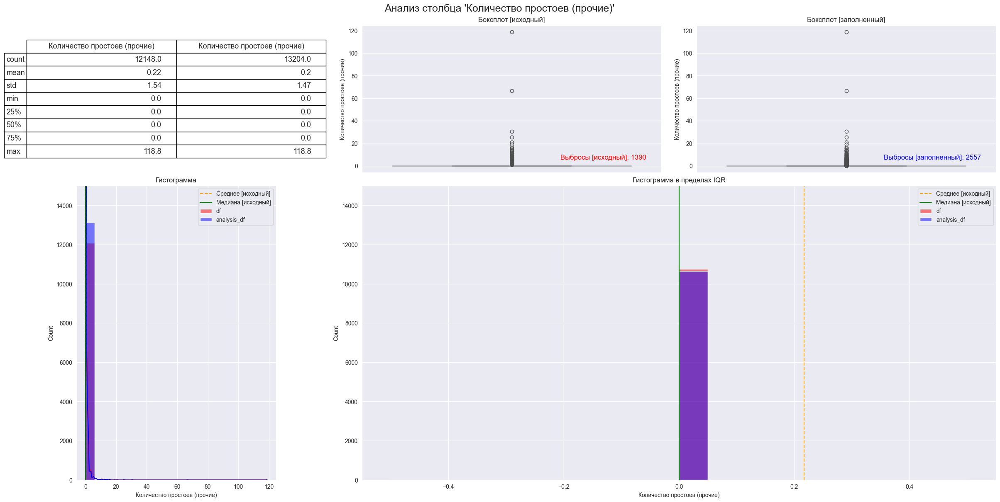

In [108]:
plot_hist_box(df, analysis_df, 'Количество простоев (прочие)', 20, 15000)

**Вывод:**
>_Некоторое количество не типизированных простоев, которые замедляют ход  
поиска артефактов, имеет сильную корреляцию с признаком "Участки". Существует  
около 2557 экстремальных значений, однако подавляющее большинство не превышает  
отметку в 20.  
Внешний вид распределения почти не изменился, после заполнения пропусков._

**Общий путь поиска**

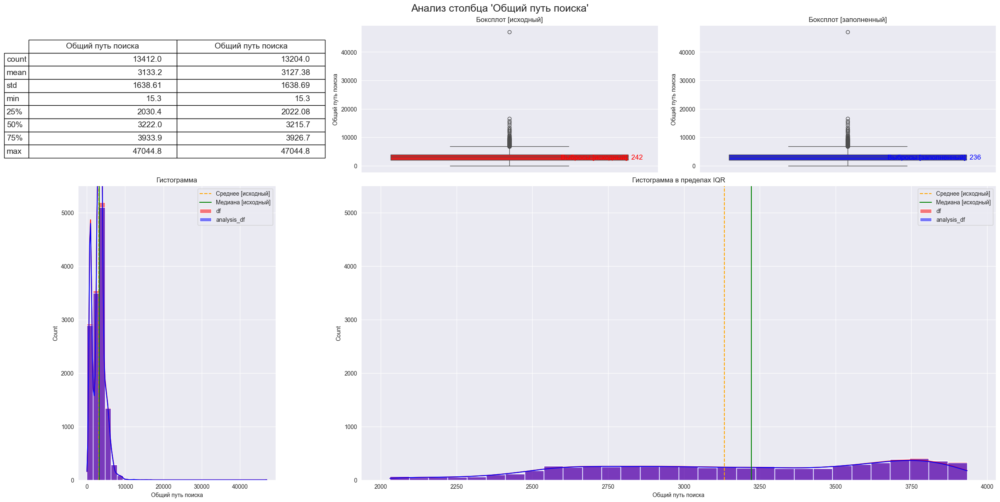

In [109]:
plot_hist_box(df, analysis_df, 'Общий путь поиска', 30, 5500)

**Вывод:**
>_Можно считать, что типичный путь поиска составит от 2000 до 4000, но  
распределение имеет выраженный "правый хвост", что означает, что путь поиска  
умеет сильно затягиваться.  
Внешний вид распределения почти не изменился, после заполнения пропусков._

**Промежуточный вывод:**
>_Исследование описательной статистики в паре с визуализацией распределений  
помогло сформулировать несколько важных гипотез о природе возникновения и  
взаимосвязи числовых признаков. Экстремальные значения, отображаемые на  
боксплотах зафиксированы в исследовательском дневнике и позже будут  
отфильтрованы в соответсвтии с выбранной стратегией._

## ➢ Графический анализ категориальных переменных
_Вновь автоматизируем процесс изучения распределения в признаковом  
пространстве. Применим столбчатую диаграмму, для удобства восприятия будем  
ограничивать число отображаемых на графике категорий, оставшиеся наблюдения  
объединим в группу "Иные", при необходимости рассмотрим их детально  
в одном из следующих пунктов._

In [110]:
def plot_categorical_pie_chart(df, analysis_df, column, top_n=10):
    fig, ax = plt.subplots(1, 2, figsize=(24, 10), gridspec_kw={'wspace': 0.4})

    values = df[column].value_counts()
    if len(values) > top_n:
        top_values = values[:top_n]
        other_values = values[top_n:].sum()
        top_values["Иные"] = other_values
    else:
        top_values = values

    total = top_values.sum()
    labels = [f"{label} - {count / total:.1%}" for label, count in
              top_values.items()]

    top_values.plot.pie(startangle=90, labels=[''] * len(top_values), ax=ax[0])
    ax[0].set_title(f'Распределение значений для {column} [исходный]')
    ax[0].set_ylabel('')
    ax[0].legend(labels=labels, loc="center left", bbox_to_anchor=(1, 0.5))

    values_working = analysis_df[column].value_counts()
    if len(values_working) > top_n:
        top_values_working = values_working[:top_n]
        other_values_working = values_working[top_n:].sum()
        top_values_working["Иные"] = other_values_working
    else:
        top_values_working = values_working

    total_working = top_values_working.sum()
    labels_working = [f"{label} - {count / total_working:.1%}" for label, count
                      in top_values_working.items()]

    top_values_working.plot.pie(startangle=90,
                                labels=[''] * len(top_values_working),
                                ax=ax[1])
    ax[1].set_title(f'Распределение значений для {column} [заполненный]')
    ax[1].set_ylabel('')
    ax[1].legend(labels=labels_working, loc="center left",
                 bbox_to_anchor=(1, 0.5))

    plt.show()

**Наименование королевства**

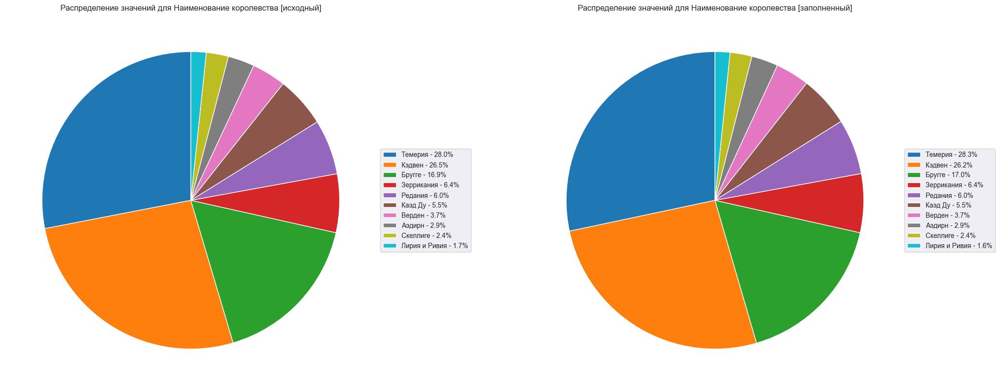

In [111]:
plot_categorical_pie_chart(df, analysis_df, 'Наименование королевства', 10)

**Вывод:**
>_Большая часть записей относится к Темерии и Кэдвену, меньше всего данных  
о шахтах на Скеллиге и Лирии с Ривией._

**Наименование земли**

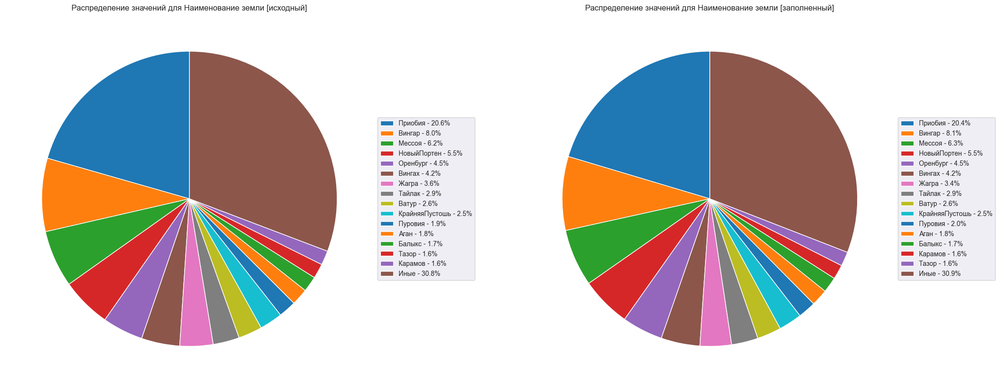

In [112]:
plot_categorical_pie_chart(df, analysis_df, 'Наименование земли', 15)

**Вывод:**
>_Чаще всего краснолюды заносили в карту информацию о расщелинах Приобии,  
пятая доля записей посвящена именно ей._

**Цель**

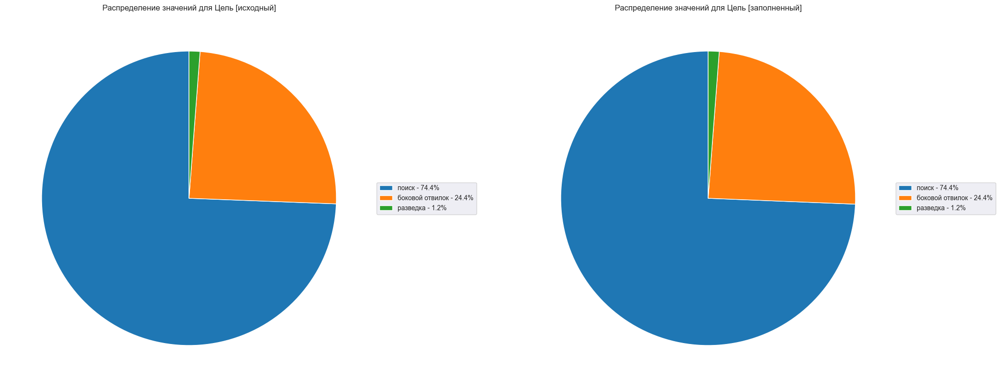

In [113]:
plot_categorical_pie_chart(df, analysis_df, 'Цель')

**Вывод:**
>_Три четверти набора отмечены, как шахты, исследуемые с целью поиска,  
около четверти это боковые отвилки, и совсем незначительное число для разведки._

**Тип расщелины**

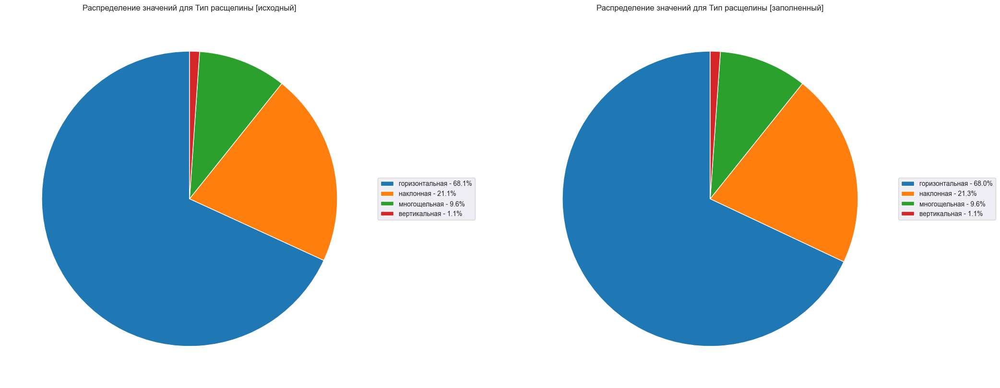

In [114]:
plot_categorical_pie_chart(df, analysis_df, 'Тип расщелины')

**Вывод:**
>_Больше всего данных о горизонтальных расщелинах, скорее всего это связано  
с технологическими особенностями выработки таких шахт. Меньше всего данных  
о вертикальных расщелинах._

**Категория расщелины**

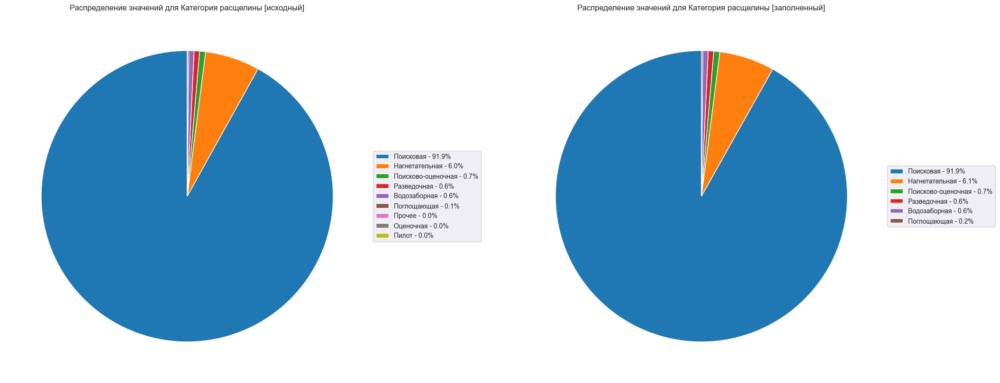

In [115]:
plot_categorical_pie_chart(df, analysis_df, 'Категория расщелины')

**Вывод:**
>_Девять из десяти шахт расщелин в наборе поисковые, модификация датасета  
привела к удалению из набора наименее популярных категорий расщелин._

**Назначение расщелины**

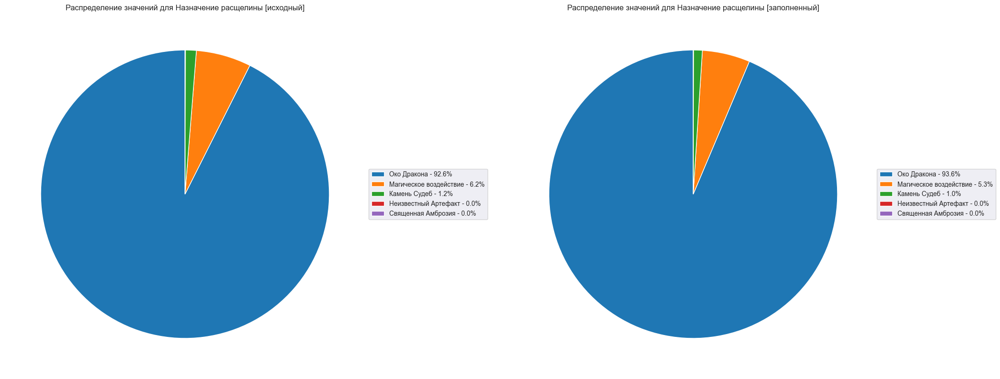

In [116]:
plot_categorical_pie_chart(df, analysis_df, 'Назначение расщелины')

**Вывод:**
>_После заполнения набора, Око Дракона еще сильнее укрепило свои лидерские  
позиции по отношению к магическому воздействию.  
Камень судеб является невероятно редким артефактом, ему отведен лишь 1% записей._

**Участки**

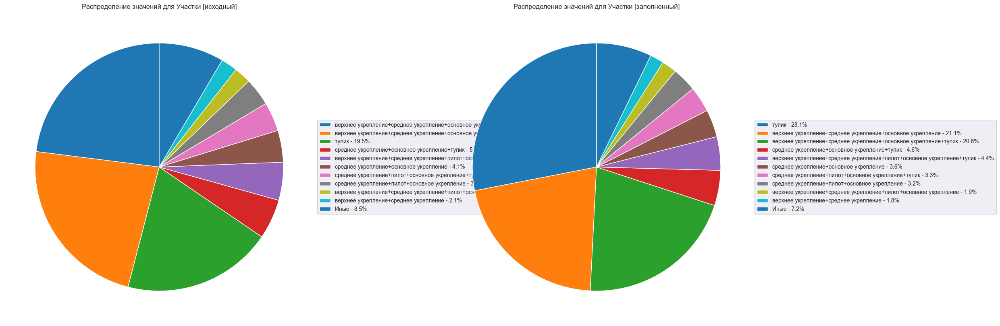

In [140]:
plot_categorical_pie_chart(df, analysis_df, 'Участки')

**Вывод:**
>_После заполнения пропусков, самым частым типом участков стал тупик, на его  
долю пришлось около четверти записей, что согласуется с количеством боковых  
отвилков в наборе._

**Технологическая особенность**

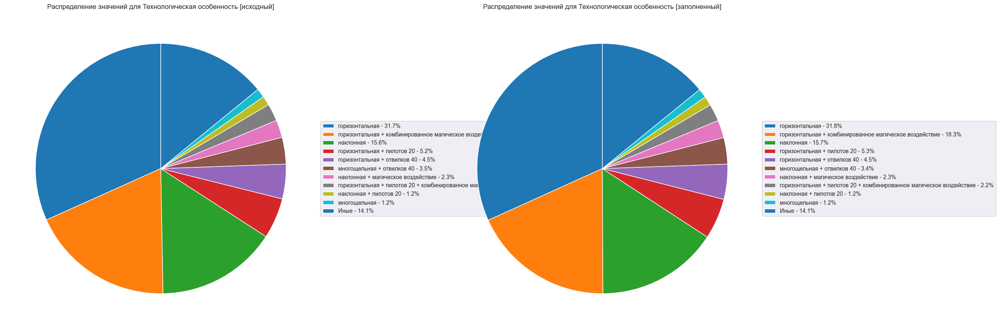

In [141]:
plot_categorical_pie_chart(df, analysis_df, 'Технологическая особенность')

**Вывод:**
>_Соотношение типов почти не изменилось после заполнения. Каждая третья  
шахта горизонтальная, что согласуется с доминирующим значением в столбце  
"тип расщелины"._

**Статус поиска**

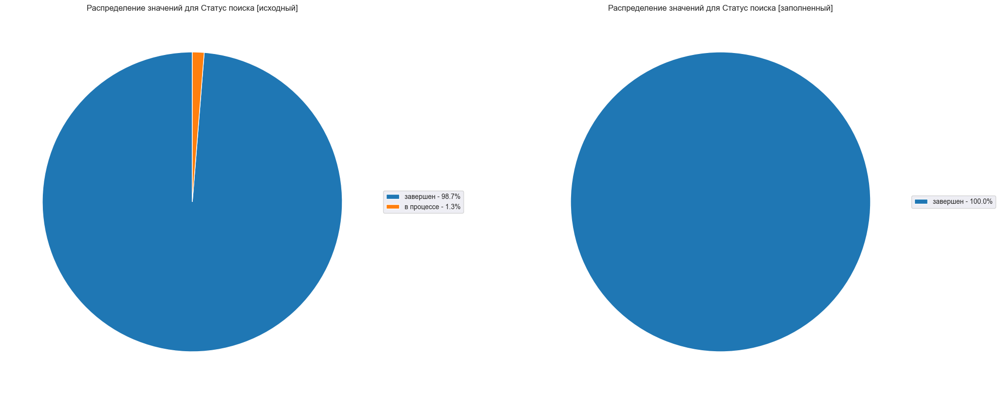

In [117]:
plot_categorical_pie_chart(df, analysis_df, 'Статус поиска')

**Вывод:**
>_1.3% изначального датасета были удалены в процессе модификации набора,  
записи с такой пометкой не будут представлять инетереса для обучения модели._

**Тип отвилка**

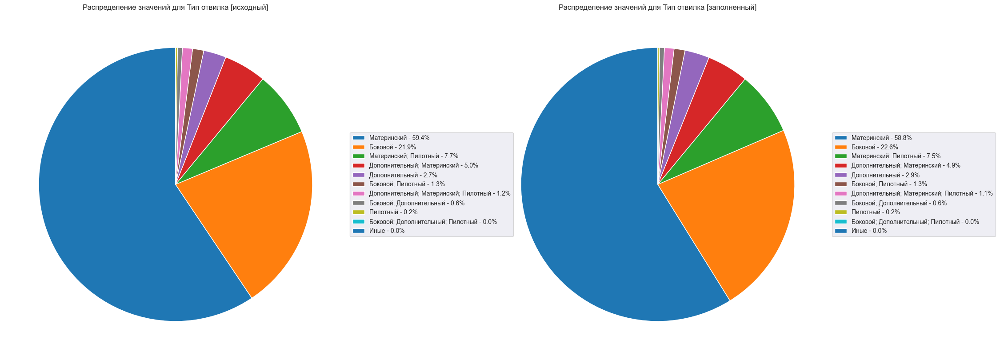

In [142]:
plot_categorical_pie_chart(df, analysis_df, 'Тип отвилка')

**Вывод:**
>_60% набора являются материнскими отвилками, чуть меньше четверти боковыми._

**Помощник по контролю поиска**

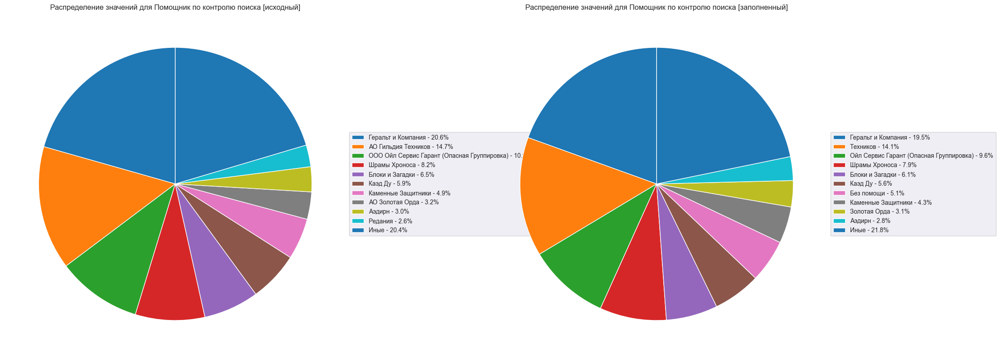

In [120]:
plot_categorical_pie_chart(df, analysis_df, 'Помощник по контролю поиска')

**Вывод:**
>_Геральт и компания являются лидерами рынка, на втором месте гильдия техников._

**Помощник по поиску**

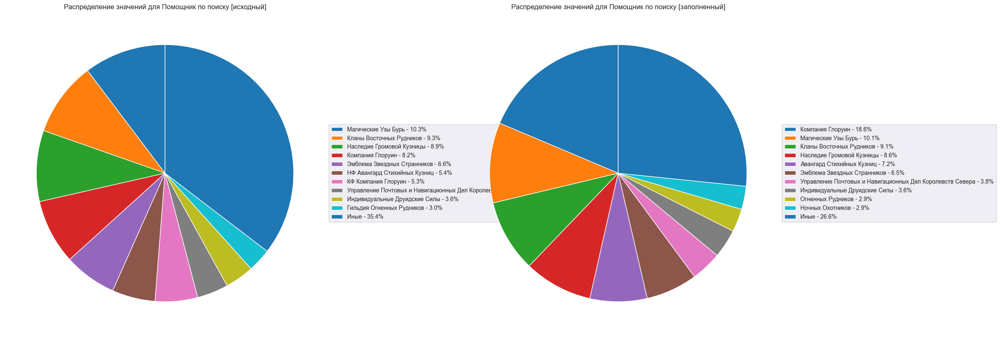

In [121]:
plot_categorical_pie_chart(df, analysis_df, 'Помощник по поиску')

**Вывод:**
>_Магические узы бурь и до модификации датасета находились на первом месте, а  
после объединения на их долю пришлось почти 20 процентов записей._

**Помощник по наклонным расщелинам**

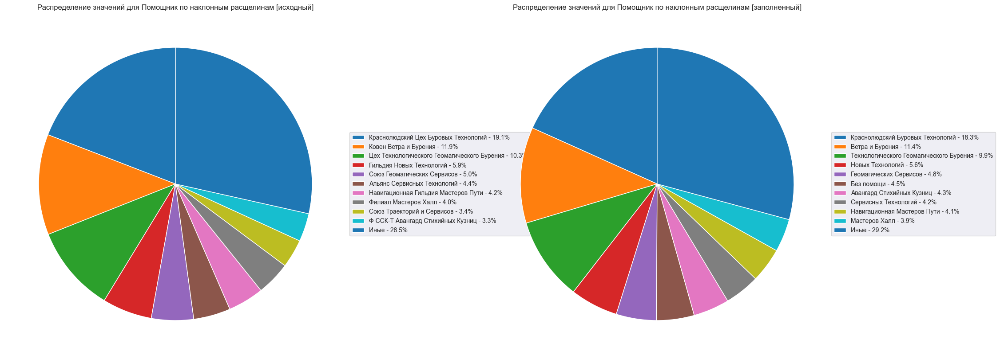

In [122]:
plot_categorical_pie_chart(df, analysis_df, 'Помощник по наклонным расщелинам')

**Вывод:**
>_Самая часто встречающаяся компания это Кроаснолюдский цех буровых технологий._

**Помощник по зельям**

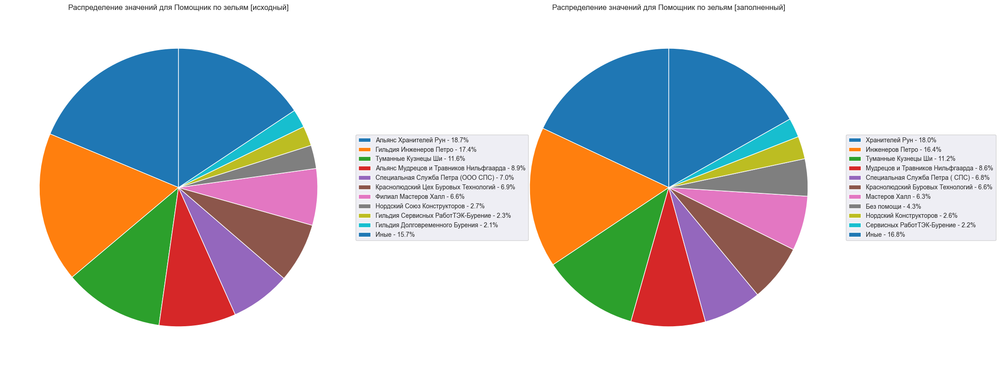

In [123]:
plot_categorical_pie_chart(df, analysis_df, 'Помощник по зельям')

**Вывод:**
>_Большую часть рынка делят между собой Альянс хранителей рун и инженеры 
Петро._

**Помощник по долбилам**

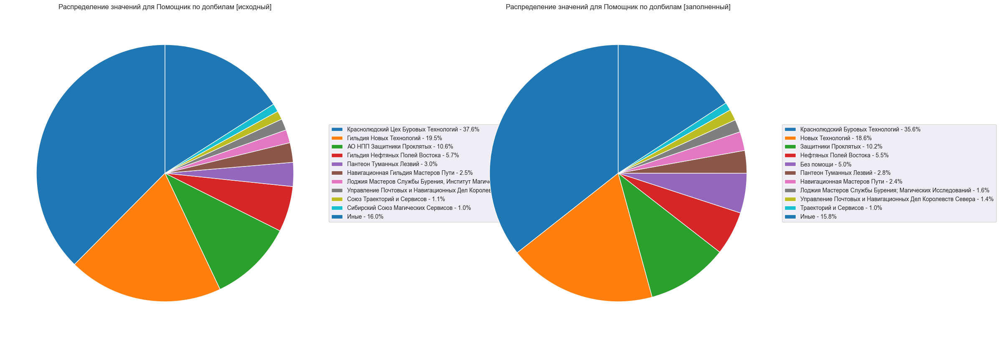

In [124]:
plot_categorical_pie_chart(df, analysis_df, 'Помощник по долбилам')

**Вывод:**
>_Краснолюдский цех буровых технологий вновь на вервом месте. На втором  
оказалась гильдия новых технологий._

**Помощник по исследованиям**

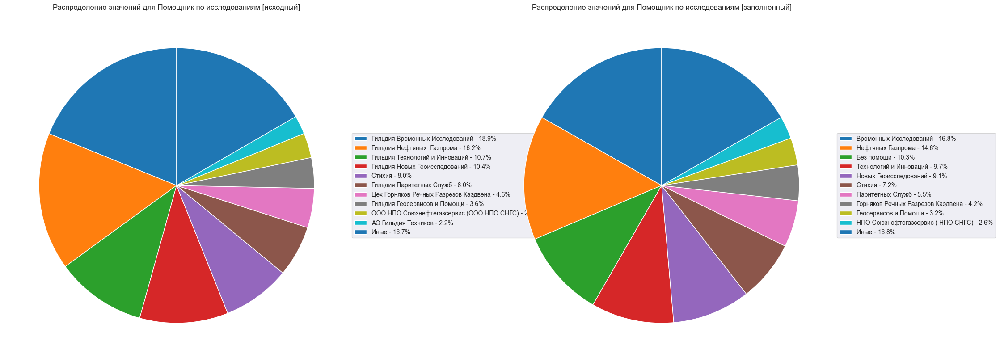

In [125]:
plot_categorical_pie_chart(df, analysis_df, 'Помощник по исследованиям')

**Вывод:**
>_Гильдия временных исследований и гильдия нефтяных газпрома почти в равной  
доле нравятся исследователям на рынке._

**Помощник по укреплению**

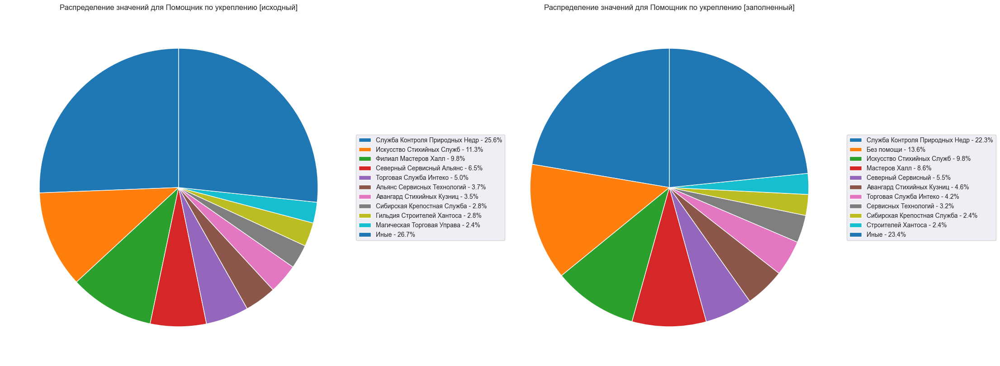

In [126]:
plot_categorical_pie_chart(df, analysis_df, 'Помощник по укреплению')

**Вывод:**
>_Здесь однозначный чемпион по популярности это СКПН._

**Помощник по огненным заклятиям**

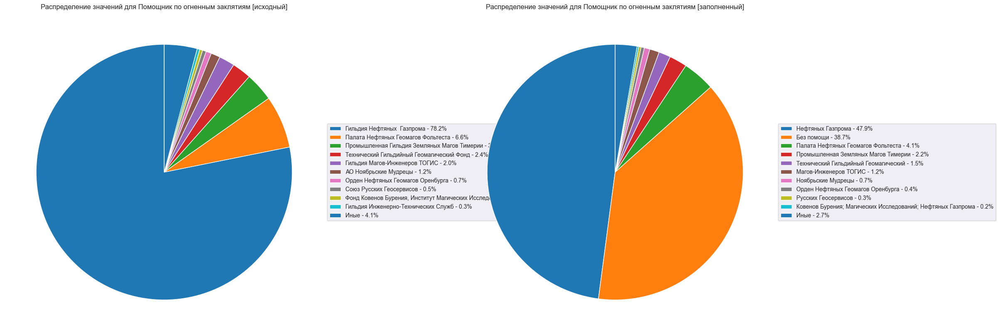

In [127]:
plot_categorical_pie_chart(df, analysis_df, 'Помощник по огненным заклятиям')

**Вывод:**
>_Чаще всего исследователи обращаются к Гильдии нефтяных Газпрома, когда речь  
заходит о огненных заклятиях._

**Помощник по подвескам**

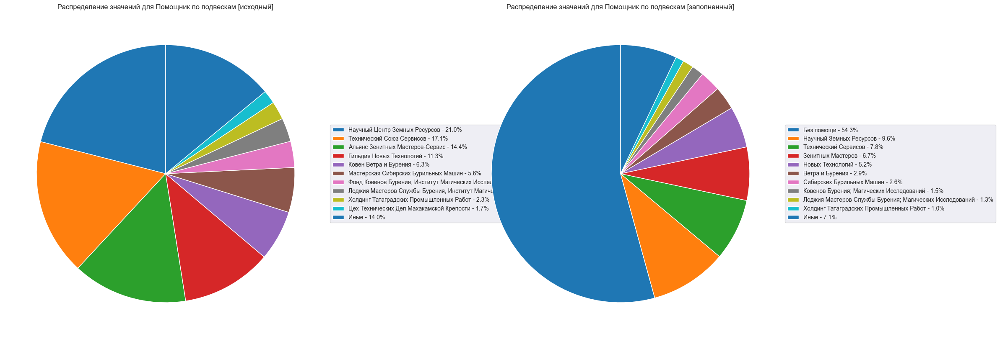

In [128]:
plot_categorical_pie_chart(df, analysis_df, 'Помощник по подвескам')

**Вывод:**
>_После заполнения, оказалось, что больша часть экспедиций не нанимает  
помощника поп подвескам. Лидер на рынке Научный центр земных ресурсов._

**Помощник по вырезке окна**

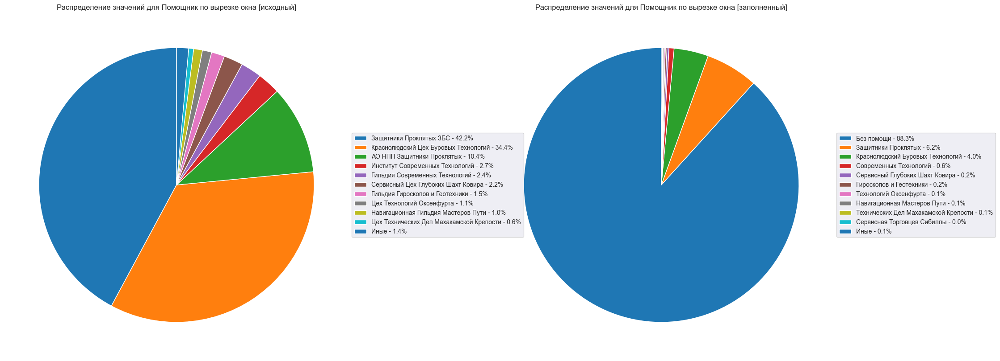

In [129]:
plot_categorical_pie_chart(df, analysis_df, 'Помощник по вырезке окна')

**Вывод:**
>_После заполнения на диаграмме хорошо заметно, что далеко не все  
экспедиции нуждаются в вырезке окна. Покупатели услуг доверяют Защитникам  
проклятых и краснолюдскому цеху буровых технологий в этом вопросе._

# **Ⅲ Шаг**. Обучение предсказательной модели  
_Перейдем к подготовке набора для обучения и тестированию модели. Воспользуемся  
записями из исследовательского дневника и проведем удаление строк, которые  
содержат явно аномальные значения, их использование в обучающей выборке  
может привести к радикальному снижению обобщающей способности модели._

In [131]:
learning_df = analysis_df.copy(deep=True)
learning_df['Наименование расщелины'] = learning_df[
    'Наименование расщелины'].astype('object')

In [133]:
learning_df = learning_df[
    learning_df['Количество дополнительных отвилков'] < 20]

gl_depth_quantile_97 = learning_df['Глубина по отвилку'].quantile(0.97)

learning_df = learning_df[
    learning_df['Глубина по отвилку'] <= gl_depth_quantile_97]

first_gl_depth_quantile_97 = learning_df['Глубина первого отвилка'].quantile(
    0.97)

learning_df = learning_df[
    learning_df['Глубина первого отвилка'] <= first_gl_depth_quantile_97]

first_search_path_quantile_97 = learning_df[
    'Путь поиска в первом отвилке'].quantile(0.97)

learning_df = learning_df[learning_df[
                              'Путь поиска в первом отвилке'] <= first_search_path_quantile_97]

learning_df = learning_df[learning_df['Общее время поиска'] < 200]

learning_df = learning_df[learning_df['Общее время простоев'] < 150]

learning_df = learning_df[learning_df['Общее время активного поиска'] < 200]

learning_df = learning_df[learning_df['Количество аварий'] < 100]

learning_df = learning_df[learning_df['Количество брака'] < 50]

learning_df = learning_df[
    learning_df['Количество геологических осложнений'] < 200]

learning_df = learning_df[learning_df['Количество осложнений'] < 50]

learning_df = learning_df[
    learning_df['Количество простоев по метеоусловиям'] < 10]

learning_df = learning_df[learning_df['Количество простоев'] < 100]

learning_df = learning_df[learning_df['Количество ремонтов'] < 85]

learning_df = learning_df[
    learning_df['Количество простоев без виновника'] < 80]

learning_df = learning_df[
    learning_df['Количество простоев по вине королевства'] < 1]

learning_df = learning_df[learning_df['Количество простоев в поиске'] < 150]

learning_df = learning_df[
    learning_df['Количество простоев в наклонном поиске'] < 35]

learning_df = learning_df[learning_df['Количество простоев по зельям'] < 20]

learning_df = learning_df[
    learning_df['Количество простоев в контроле поиска'] < 6]

learning_df = learning_df[
    learning_df['Количество простоев в конце расщелины'] < 20]

learning_df = learning_df[learning_df['Количество простоев по долбилам'] < 12]

learning_df = learning_df[
    learning_df['Количество простоев по вине исследователей'] < 1]

learning_df = learning_df[
    learning_df['Количество простоев по креплениям'] < 12]

learning_df = learning_df[learning_df['Количество простоев (прочие)'] < 30]

learning_df = learning_df[learning_df['Общий путь поиска'] < 20000]

_Теперь, когда аномальные значения удалены, очистим данные от строк, назначение  
которых отсутсвует, как заявленное в требованиях к исследованию._

In [134]:
learning_df = learning_df[learning_df['Назначение расщелины'].isin(
    ["Око Дракона", "Камень судеб", "Священная Амброзия"])]

_Набор готов, он будет разделён на обучающую и тестовую выборки.  
В процессе обучения будет использован кросс-валидационный метод, призванный  
снизить влияние на значение целевой метрики конкретного распределения._

Cross-Validation MAE Scores: [187.84075379 190.399158   190.73918869 193.18332699 198.13326396]
Mean Cross-Validation MAE: 192.0591382846394


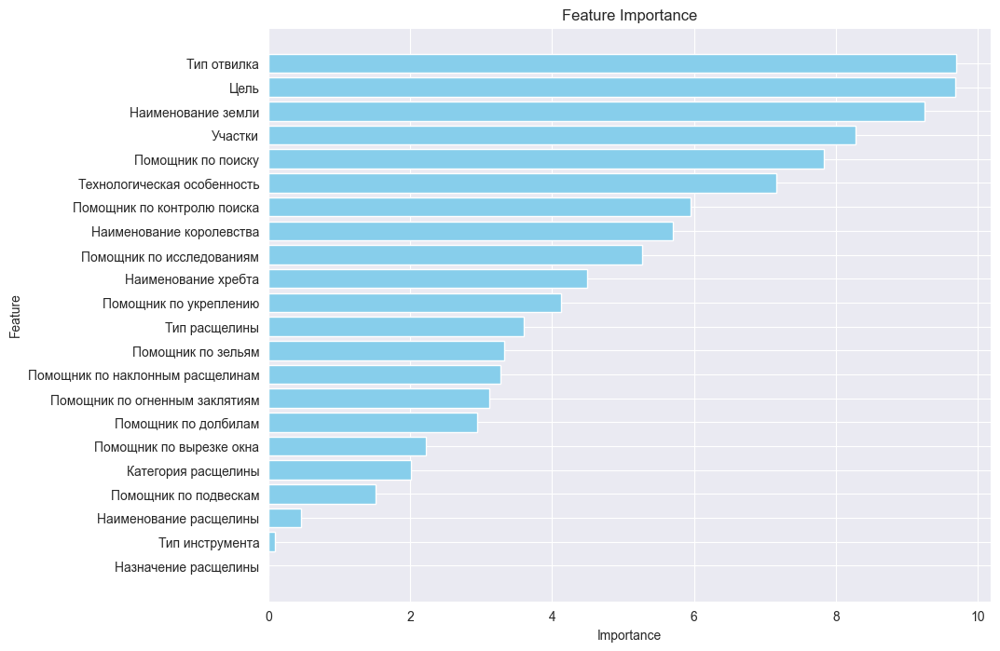

In [135]:
features = [
    'Наименование королевства', 'Наименование земли', 'Наименование хребта',
    'Наименование расщелины', 'Цель', 'Тип расщелины', 'Категория расщелины',
    'Назначение расщелины', 'Участки', 'Тип отвилка',
    'Технологическая особенность', 'Помощник по контролю поиска',
    'Помощник по поиску',
    'Помощник по наклонным расщелинам', 'Помощник по зельям',
    'Помощник по долбилам',
    'Помощник по исследованиям', 'Помощник по укреплению',
    'Помощник по огненным заклятиям',
    'Помощник по подвескам', 'Помощник по вырезке окна', 'Тип инструмента'
]

X = learning_df[features]
y = learning_df['Итоговое время поиска']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                                    random_state=42)

model = CatBoostRegressor(
    iterations=500,
    learning_rate=0.1,
    depth=8,
    l2_leaf_reg=5,
    random_strength=0.8,
    bagging_temperature=1,
    border_count=128,
    verbose=0,
    cat_features=features
)

cv_scores = cross_val_score(model, X_train, y_train, cv=5,
                            scoring='neg_mean_absolute_error',
                            error_score='raise')
cv_mae_scores = -cv_scores
print(f"Cross-Validation MAE Scores: {cv_mae_scores}")
print(f"Mean Cross-Validation MAE: {cv_mae_scores.mean()}")

model.fit(X_train, y_train, cat_features=features)

y_pred = model.predict(X_test)

feature_importances = model.get_feature_importance()
feature_importance_df = pd.DataFrame(
    {'Feature': features, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance',
                                                          ascending=False)

plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'],
         color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.gca().invert_yaxis()
plt.show()

In [145]:
learn_mean = learning_df['Итоговое время поиска'].mean()
print(f"Среднее по обучающему набору: {learn_mean:.2f}")
print(f"CV-MAE: {cv_mae_scores.mean():.2f}")

Среднее по обучающему набору: 723.84
CV-MAE: 192.06


# **IV Шаг**. Интерпретация результатов работы, составление оптимального плана 
_Проанализируем результаты работы модели и выполним финальную цель исследования,  
составим список рекомендаций для похода за артефактами._

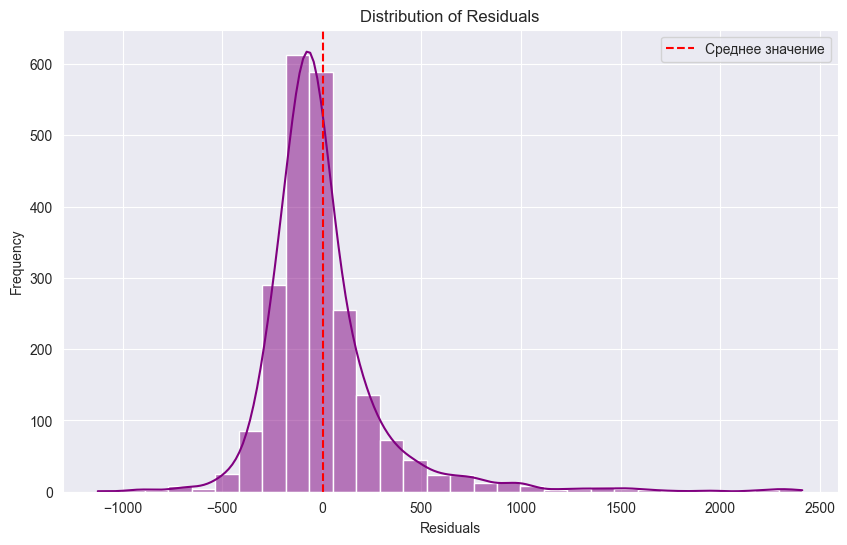

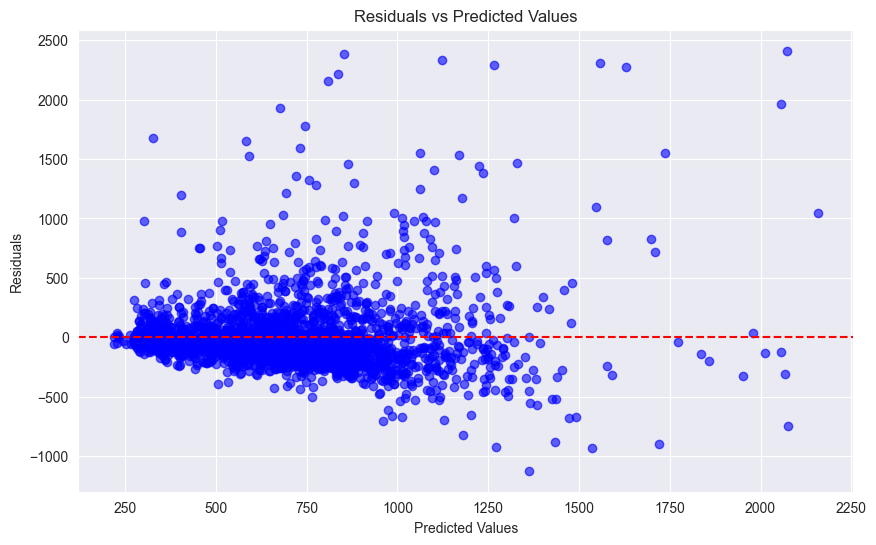

In [137]:
residuals = y_test - y_pred

plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, color='purple', bins=30)
plt.axvline(residuals.mean(), color='red', linestyle='--', linewidth=1.5,
            label='Среднее значение')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Distribution of Residuals')
plt.legend()
plt.show()

# Построение графика остатков против предсказанных значений
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, alpha=0.6, color='blue')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Values')
plt.show()

**Вывод:**
>_Среднее на гистограмме распределения остатков находится около нуля, что  
говорит о несклонности модели систематически завышать или занижать прогнозы.  
В дисперсии не прослеживается закономерностей, однако на высоких значениях  
предсказаний можно выявить некоторую гетероскедастичность. Я связываю это  
с недостаточным количеством записей, у которых значение целевого признака  
сильно выше среднего._

_На основании признаков, которые модель сочла, как наиболее важные для  
предсказания целевой переменной, составим советы и план похода за артефактом._

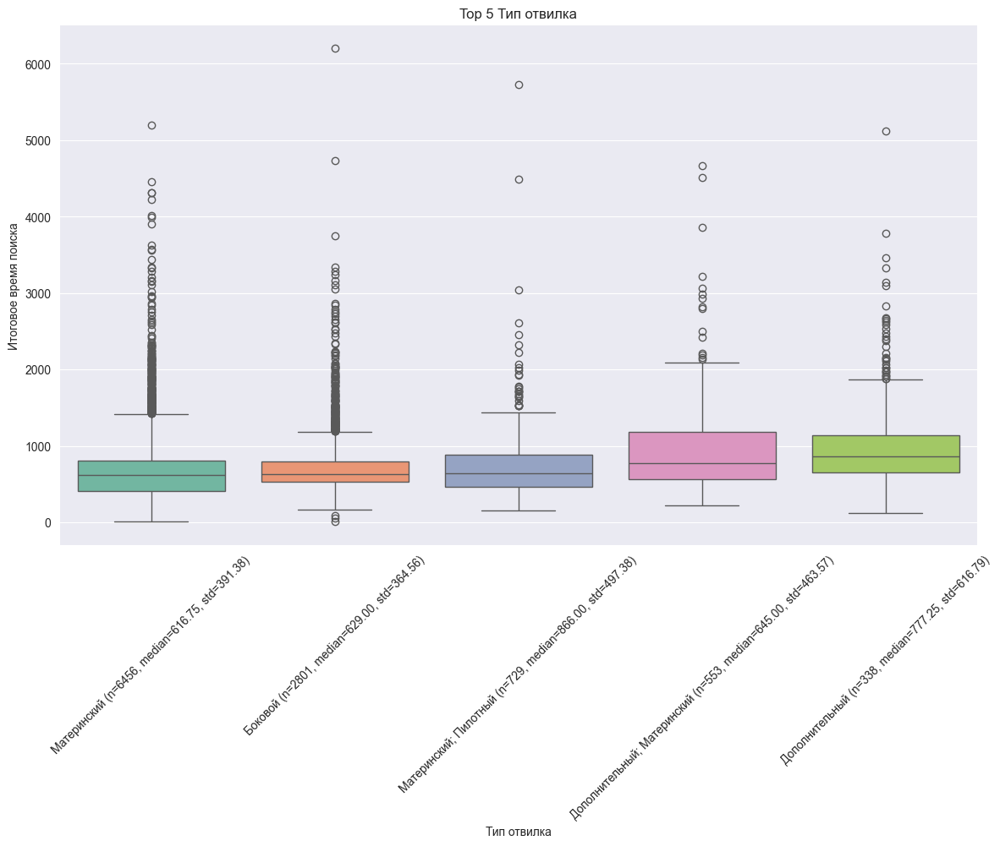

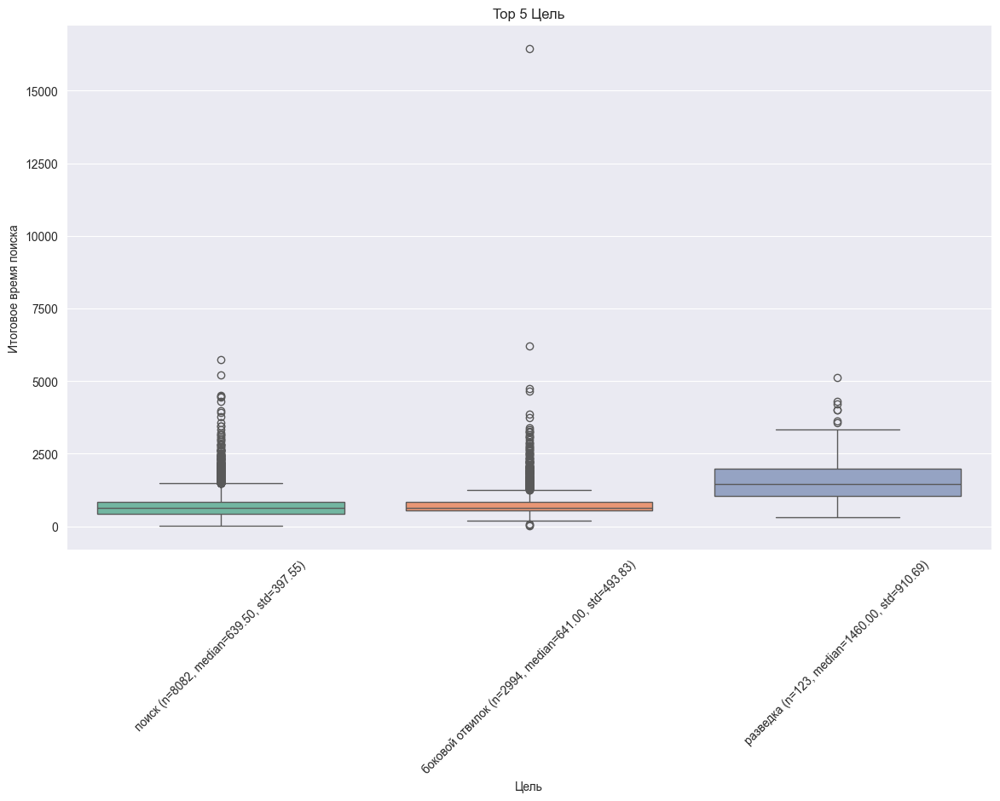

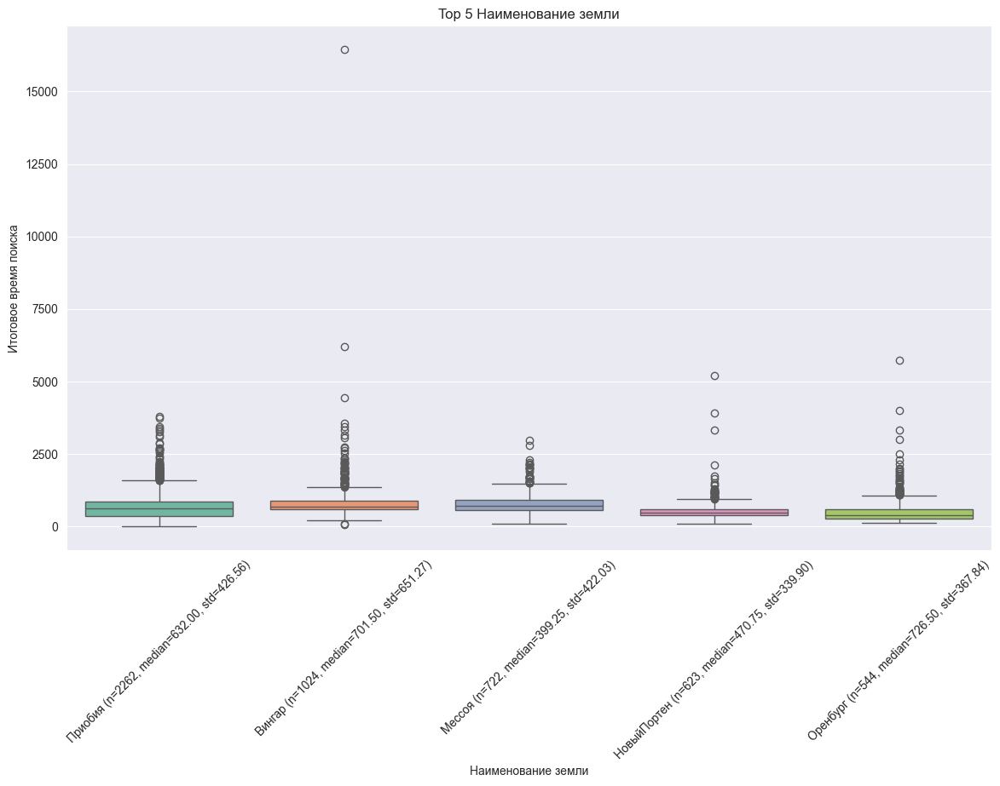

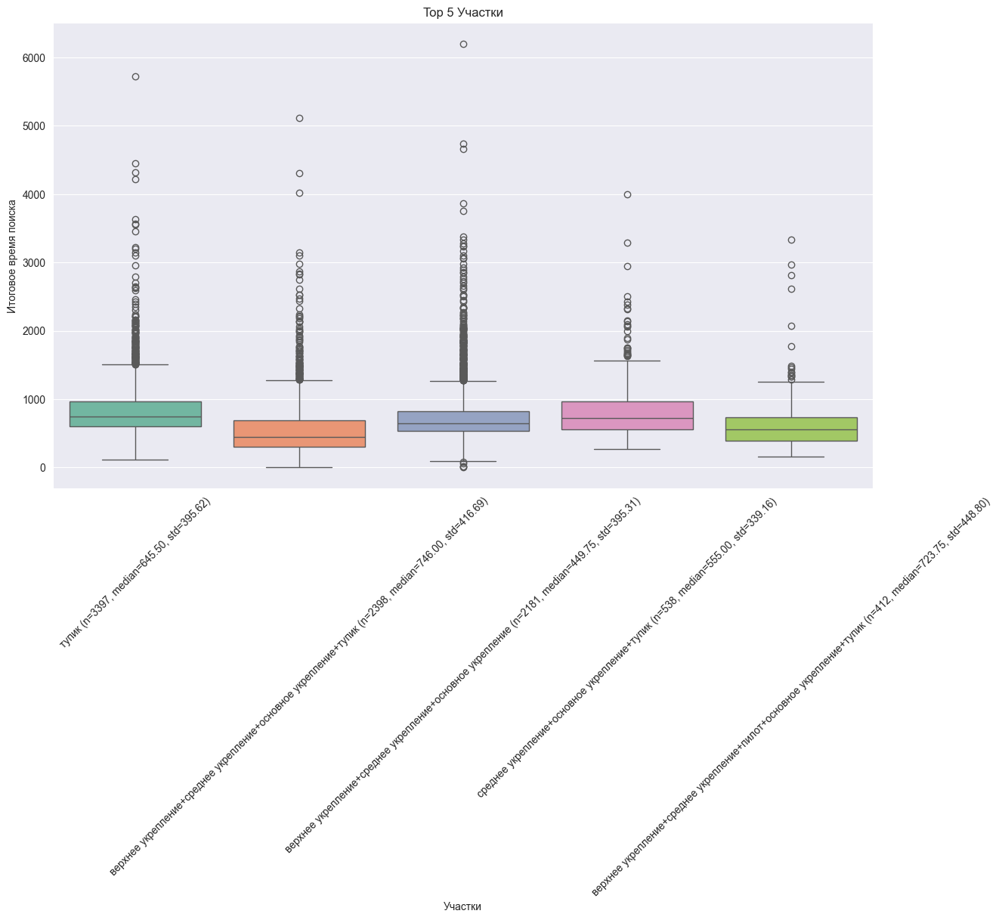

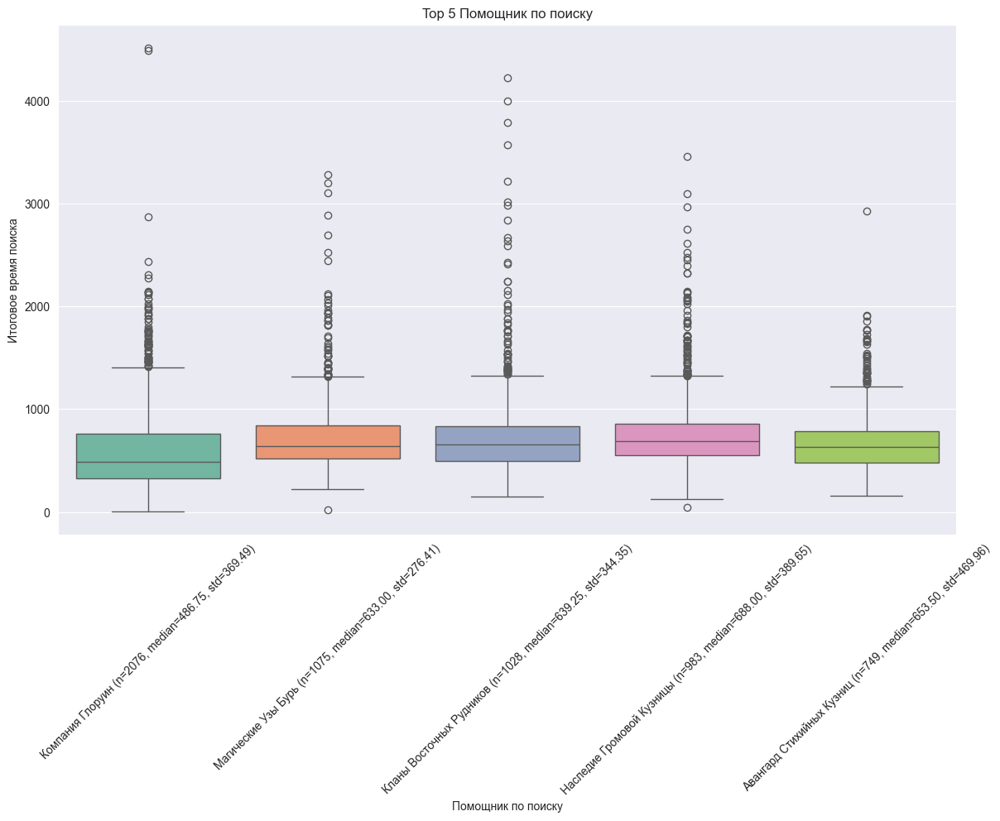

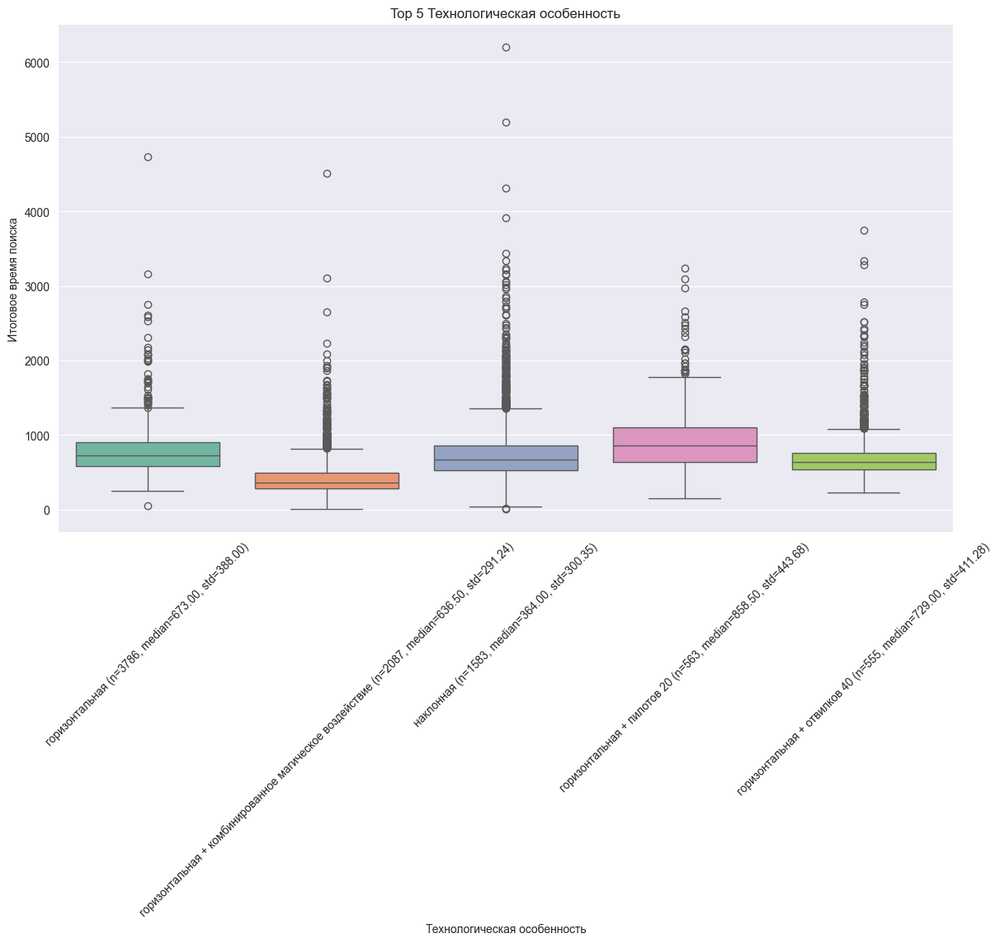

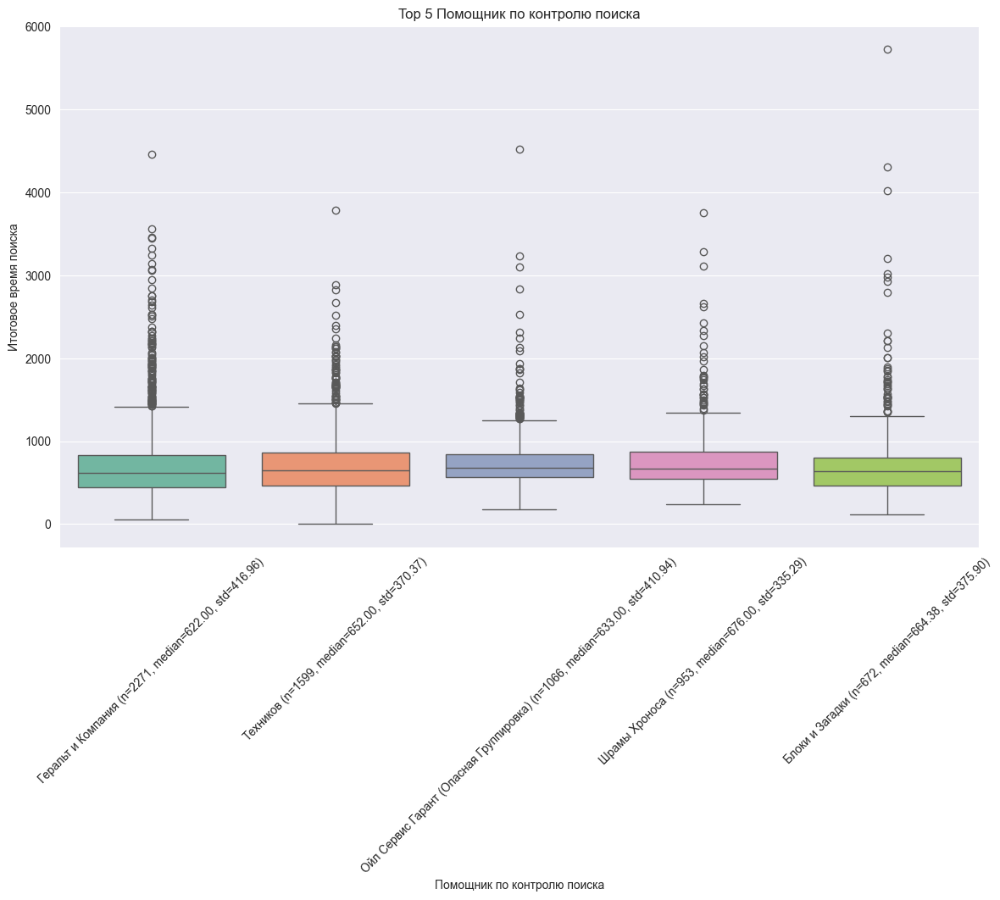

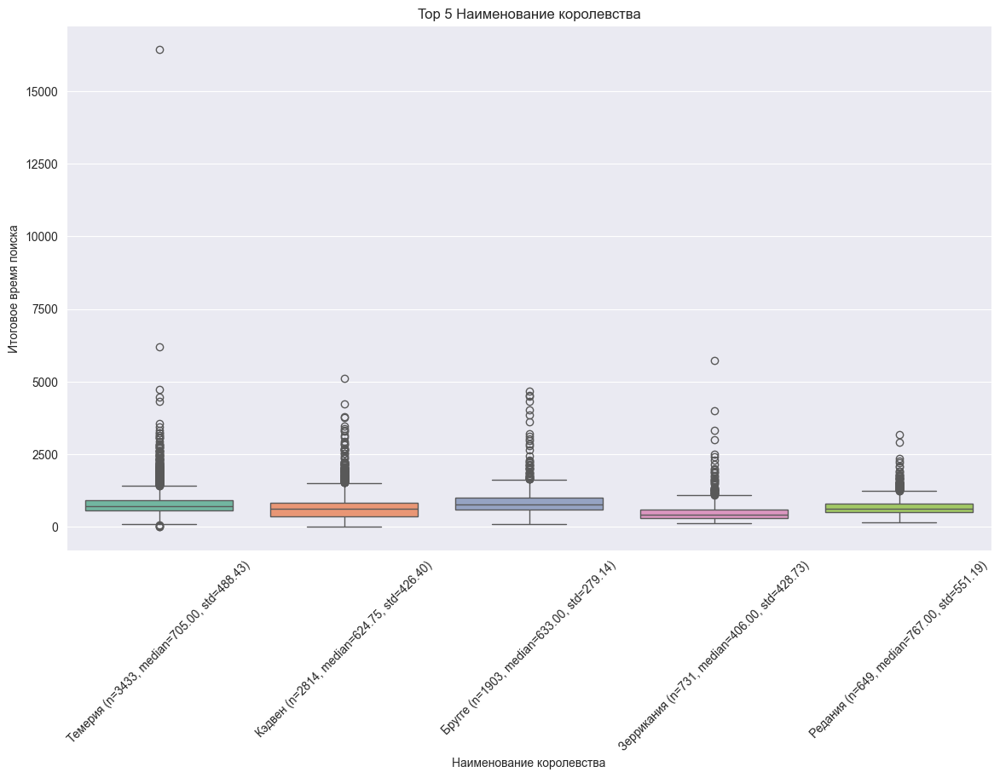

In [150]:
def plot_top_5_by_feature(learning_df, feature, target, title):
    top_counts = learning_df[feature].value_counts().head(5)
    top_features = top_counts.index

    top_features_data = learning_df[learning_df[feature].isin(top_features)]

    plt.figure(figsize=(14, 8))
    sns.boxplot(x=feature, y=target, data=top_features_data, palette='Set2')
    plt.title(title)
    plt.xlabel(feature)
    plt.ylabel(target)

    labels = []
    for helper in top_features:
        median = top_features_data[top_features_data[feature] == helper][target].median()
        std = top_features_data[top_features_data[feature] == helper][target].std()
        labels.append(f"{helper} (n={top_counts[helper]}, median={median:.2f}, std={std:.2f})")

    plt.xticks(ticks=range(len(top_features)), labels=labels, rotation=45)
    plt.show()



features = [
    'Тип отвилка', 'Цель', 'Наименование земли', 'Участки',
    'Помощник по поиску', 'Технологическая особенность',
    'Помощник по контролю поиска', 'Наименование королевства'
]

target = 'Итоговое время поиска'
for feature in features:
    plot_top_5_by_feature(learning_df, feature, target, f'Top 5 {feature}')

**План поисков для героев:**
* _Самым важным признаком модель сочла тип отвилка. Если герои хотят потратить  
минимум времени на поиски, то самым верным решением будет материнский или  
дополнительный материнский отвилок, по этим типам очень много данных,  
медианное время поиска там одно из самых низких и относительно небольшая  
дисперсия._
* _На второе место модель поставила цель. Больше всего данных о записях, с  
целью "Поиск", соотношение данных столь велико, что модель обучалась именно  
на таких данных, за редким исключением. Чтобы быть уверенным в высоком качестве  
прогноза, лучше отправиться именно в такие расщелины._
* _Третье место получил признак "Наименование земли". Географическое положение  
шахты играет большую роль в итоговом времени поиска, Приобия или Вингар  
будут хорошим выбором, можно быть уверенным, что модель качественно предскажет  
время поиска в местных расщелинах._
* _Не последнюю роль во времени поиска играют инженерные решения, которые  
можно обнаружить в шахтах. Серьезно подготовленные расщелины позволят  
с высокой вероятностью потратить меньше времени._
* _Высокой важностью обладает выбор помощника по поиску в команду. Здесь  
важно довериться профессионалам, Компания Глоруин будет хорошим выбором,  
у них низкая медиана поискового времени и доминирующая доля на рынке._
* _Горизонтальная шахта с комбинированным магическим воздействием станет  
хорошим выбором, по таким шахтам достаточно много наблюдений, у них низкая  
медиана и небольшое стандартное отклонение времени поиска._
* _Вновь признак, определяющий географическое положение шахты. Зеррикания  
будет хорошим выбором для рискованных поисков, медиана очень низкая, но  
количество наблюдений не очень большое. Оптимальным значением с точки зрения  
количества записей в обучающей выборке и ожидаемого времени поиска будет  
Кэдвен._